In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import pandas as pd
from pandas_profiling import ProfileReport
from sklearn import preprocessing
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import MinMaxScaler
import warnings
warnings.filterwarnings('ignore')
pd.pandas.set_option('display.max_columns',None)

In [2]:
dataset=pd.read_csv('heart.csv')
dataset.head()

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,M,ATA,140,289,0,Normal,172,N,0.0,Up,0
1,49,F,NAP,160,180,0,Normal,156,N,1.0,Flat,1
2,37,M,ATA,130,283,0,ST,98,N,0.0,Up,0
3,48,F,ASY,138,214,0,Normal,108,Y,1.5,Flat,1
4,54,M,NAP,150,195,0,Normal,122,N,0.0,Up,0


In [4]:
report = ProfileReport(dataset,title='Pandas profiling Report', explorative= True)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [3]:
dataset.columns

Index(['Age', 'Sex', 'ChestPainType', 'RestingBP', 'Cholesterol', 'FastingBS',
       'RestingECG', 'MaxHR', 'ExerciseAngina', 'Oldpeak', 'ST_Slope',
       'HeartDisease'],
      dtype='object')

In [4]:
print(dataset.shape)

(918, 12)


In [4]:
dataset.head()

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,M,ATA,140,289,0,Normal,172,N,0.0,Up,0
1,49,F,NAP,160,180,0,Normal,156,N,1.0,Flat,1
2,37,M,ATA,130,283,0,ST,98,N,0.0,Up,0
3,48,F,ASY,138,214,0,Normal,108,Y,1.5,Flat,1
4,54,M,NAP,150,195,0,Normal,122,N,0.0,Up,0


In [5]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 918 entries, 0 to 917
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Age             918 non-null    int64  
 1   Sex             918 non-null    object 
 2   ChestPainType   918 non-null    object 
 3   RestingBP       918 non-null    int64  
 4   Cholesterol     918 non-null    int64  
 5   FastingBS       918 non-null    int64  
 6   RestingECG      918 non-null    object 
 7   MaxHR           918 non-null    int64  
 8   ExerciseAngina  918 non-null    object 
 9   Oldpeak         918 non-null    float64
 10  ST_Slope        918 non-null    object 
 11  HeartDisease    918 non-null    int64  
dtypes: float64(1), int64(6), object(5)
memory usage: 86.2+ KB


In [6]:
# step-1 make the list of feature that has missing values
features_with_na=[features for features in dataset.columns if dataset[features].isnull().sum()>1]
## 2- step print the feature name and the percentage of missing values
for feature in features_with_na:
    print(feature, np.round(dataset[feature].isnull().mean(), 4),  ' % missing values')

In [7]:
dataset.describe()

,Age,RestingBP,Cholesterol,FastingBS,MaxHR,Oldpeak,HeartDisease
count,918.000000,918.000000,918.000000,918.000000,918.000000,918.000000,918.000000
mean,53.510893,132.396514,198.799564,0.233115,136.809368,0.887364,0.553377
std,9.432617,18.514154,109.384145,0.423046,25.460334,1.066570,0.497414
min,28.000000,0.000000,0.000000,0.000000,60.000000,-2.600000,0.000000
25%,47.000000,120.000000,173.250000,0.000000,120.000000,0.000000,0.000000
50%,54.000000,130.000000,223.000000,0.000000,138.000000,0.600000,1.000000
75%,60.000000,140.000000,267.000000,0.000000,156.000000,1.500000,1.000000
max,77.000000,200.000000,603.000000,1.000000,202.000000,6.200000,1.000000


There's actually two issues here that need to be resolved. First one is, there are total 172 patients who have 0 cholesterol- which is invalid and the second one is, a patient have a 0 resting blood pressure which is also invalid 

In [8]:
dataset['HeartDisease'].value_counts()

1    508
0    410
Name: HeartDisease, dtype: int64

In [9]:
# Percentage of patients have and do not have heart disease
dataset['HeartDisease'].value_counts()/dataset.shape[0]*100

1    55.337691
0    44.662309
Name: HeartDisease, dtype: float64

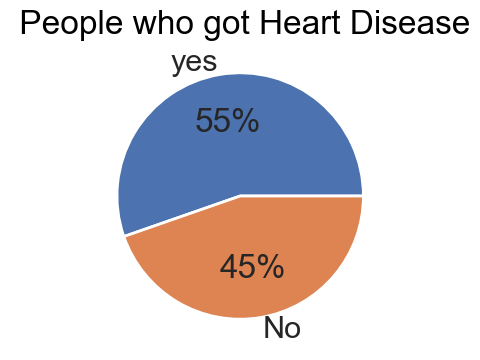

In [10]:
# Create a plot to display the percentage of the positive and negative heart disease 
labels = ['yes', 'No']
values = dataset['HeartDisease'].value_counts().values
sns.set_theme(context='poster')
plt.figure(figsize=(4,4))
plt.title('People who got Heart Diseases', color="Black",fontsize=18)

plt.pie(values, labels=labels, autopct='%1.0f%%')
plt.title(' People who got Heart Disease')
plt.show()

In [11]:
len(dataset[dataset['Cholesterol']==0])

172

In [12]:
len(dataset[dataset['RestingBP']==0])

1

In [13]:
# mark zero values as missing or NaN
from numpy import nan
dataset['Cholesterol'] = dataset['Cholesterol'].replace(0, nan)

In [14]:
numerical_with_nan=[feature for feature in dataset.columns if dataset[feature].isnull().sum()>1 and dataset[feature].dtypes!='O']

## We will print the numerical nan variables and percentage of missing values

for feature in numerical_with_nan:
    print("{}: {}% missing value".format(feature,np.around(dataset[feature].isnull().mean(),4)))

Cholesterol: 0.1874% missing value


In [15]:
for feature in numerical_with_nan:
    ## We will replace by using median since there are outliers
    median_value=dataset[feature].median()
    
    ## create a new feature to capture nan values
    dataset[feature+'nan']=np.where(dataset[feature].isnull(),1,0)
    dataset[feature].fillna(median_value,inplace=True)
    
dataset[numerical_with_nan].isnull().sum()

Cholesterol    0
dtype: int64

In [16]:
# count the number of NaN values in each column
print(dataset.isnull().sum())

Age               0
Sex               0
ChestPainType     0
RestingBP         0
Cholesterol       0
FastingBS         0
RestingECG        0
MaxHR             0
ExerciseAngina    0
Oldpeak           0
ST_Slope          0
HeartDisease      0
Cholesterolnan    0
dtype: int64


In [17]:
dataset = dataset.drop('Cholesterolnan', axis=1)

In [18]:
median_value = dataset['RestingBP'].median()

# replace the specific value with the median value
dataset['RestingBP'] = dataset['RestingBP'].replace({0: median_value})


In [19]:
print(dataset.shape)

(918, 12)


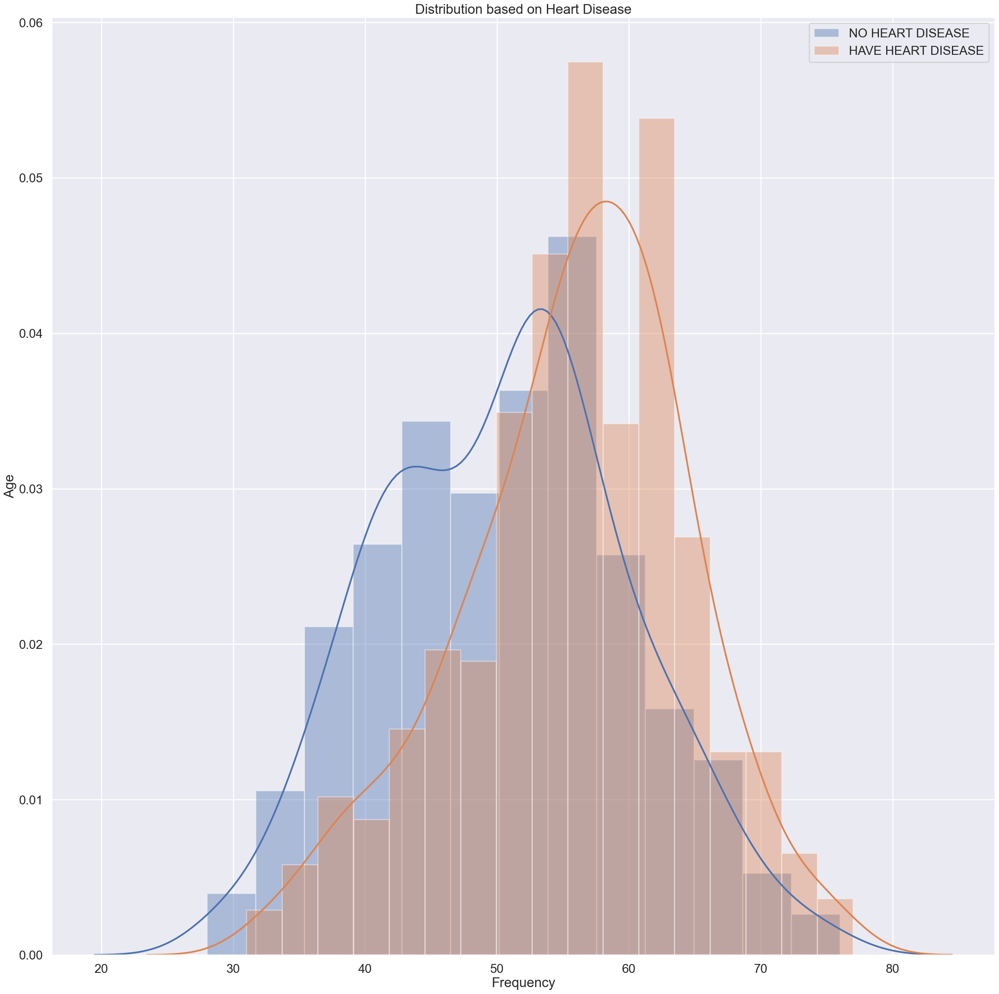

In [20]:
# Display age distribution based on heart disease
plt.figure(figsize=(30,30))
sns.distplot(dataset[dataset['HeartDisease'] == 0]['Age'], label='NO HEART DISEASE')
sns.distplot(dataset[dataset['HeartDisease'] == 1]['Age'], label = 'HAVE HEART DISEASE')
plt.xlabel('Frequency')
plt.ylabel('Age')
plt.title('Distribution based on Heart Disease')
plt.legend()
plt.show()

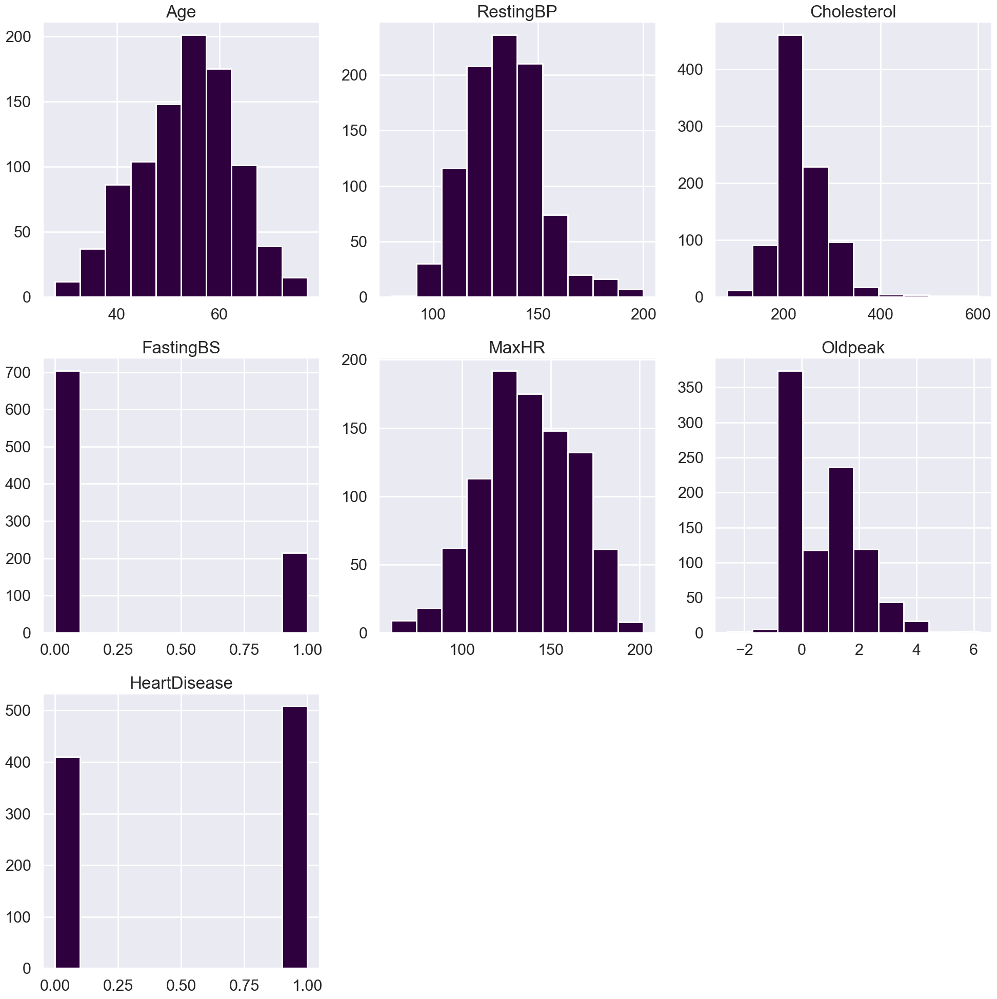

In [21]:
dataset.hist(figsize = (20,20),color='#2e003e')
plt.tight_layout()
plt.show()

In [22]:
# list of numerical variables
numerical_features = [feature for feature in dataset.columns if dataset[feature].dtypes != 'O']

print('Number of numerical variables: ', len(numerical_features))

# visualise the numerical variables
dataset[numerical_features].head()

Number of numerical variables:  7


,Age,RestingBP,Cholesterol,FastingBS,MaxHR,Oldpeak,HeartDisease
0,40,140,289.0,0,172,0.0,0
1,49,160,180.0,0,156,1.0,1
2,37,130,283.0,0,98,0.0,0
3,48,138,214.0,0,108,1.5,1
4,54,150,195.0,0,122,0.0,0


In [23]:
# list of variables that contain heart information
heart_feature = [feature for feature in numerical_features if 'Heart' in feature]
heart_feature

['HeartDisease']

In [24]:
discrete_feature=[feature for feature in numerical_features if len(dataset[feature].unique())<25 and feature not in heart_feature+['HeartDisease']]
print("Discrete Variables Count: {}".format(len(discrete_feature)))


Discrete Variables Count: 1


In [25]:
discrete_feature

['FastingBS']

In [26]:
dataset[discrete_feature].head()

,FastingBS
0,0
1,0
2,0
3,0
4,0


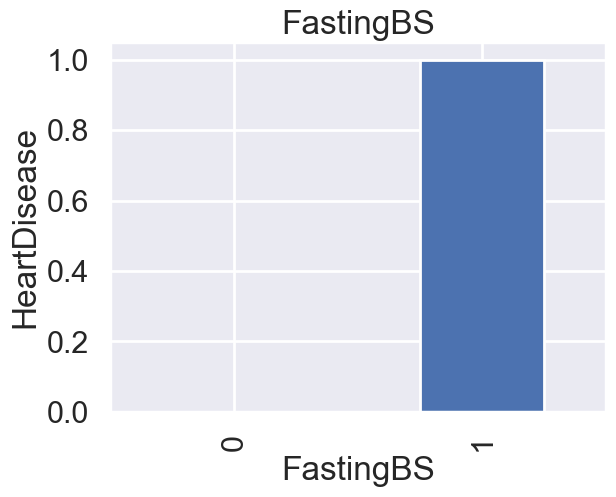

In [27]:
for feature in discrete_feature:
    data=dataset.copy()
    data.groupby(feature)['HeartDisease'].median().plot.bar()
    plt.xlabel(feature)
    plt.ylabel('HeartDisease')
    plt.title(feature)
    plt.show()

<AxesSubplot:>

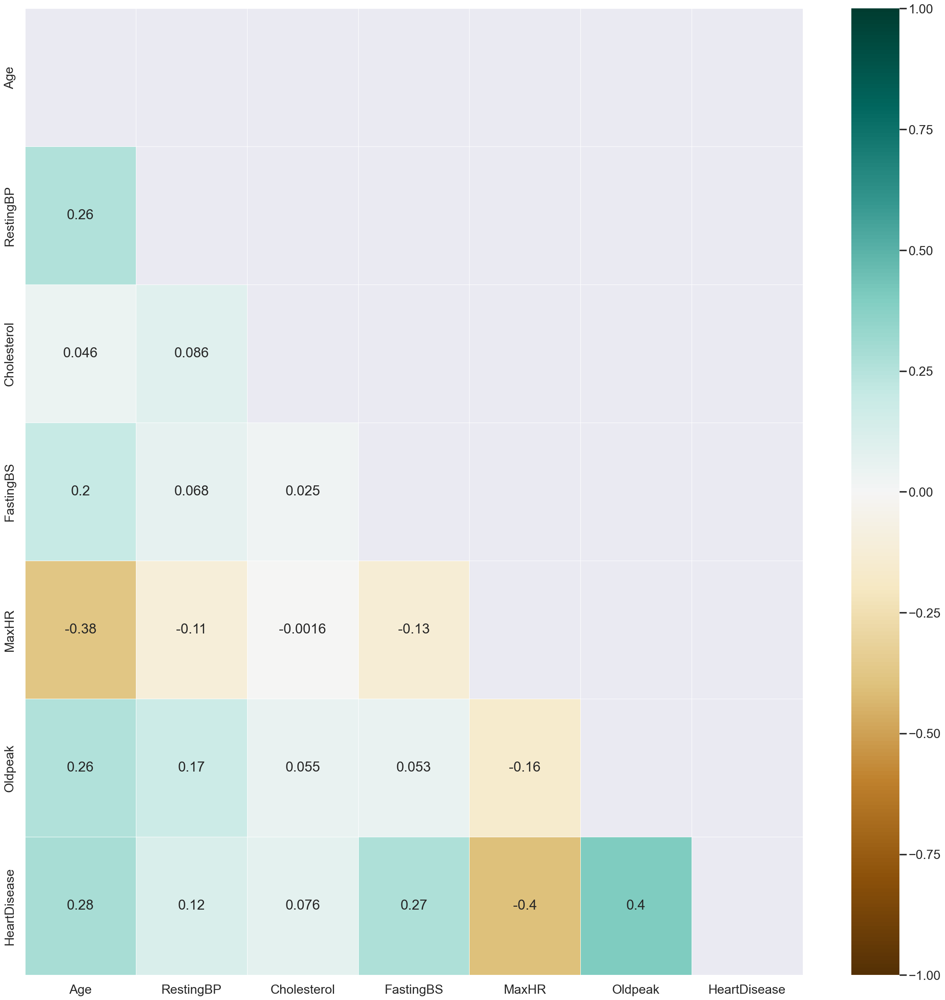

In [28]:
corr = dataset.corr()
plt.figure(figsize=(30,30))
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr,mask=mask,cmap='BrBG', vmin=-1, vmax= 1 , center=0, annot=True,linewidth=.5,square=False)

<AxesSubplot:>

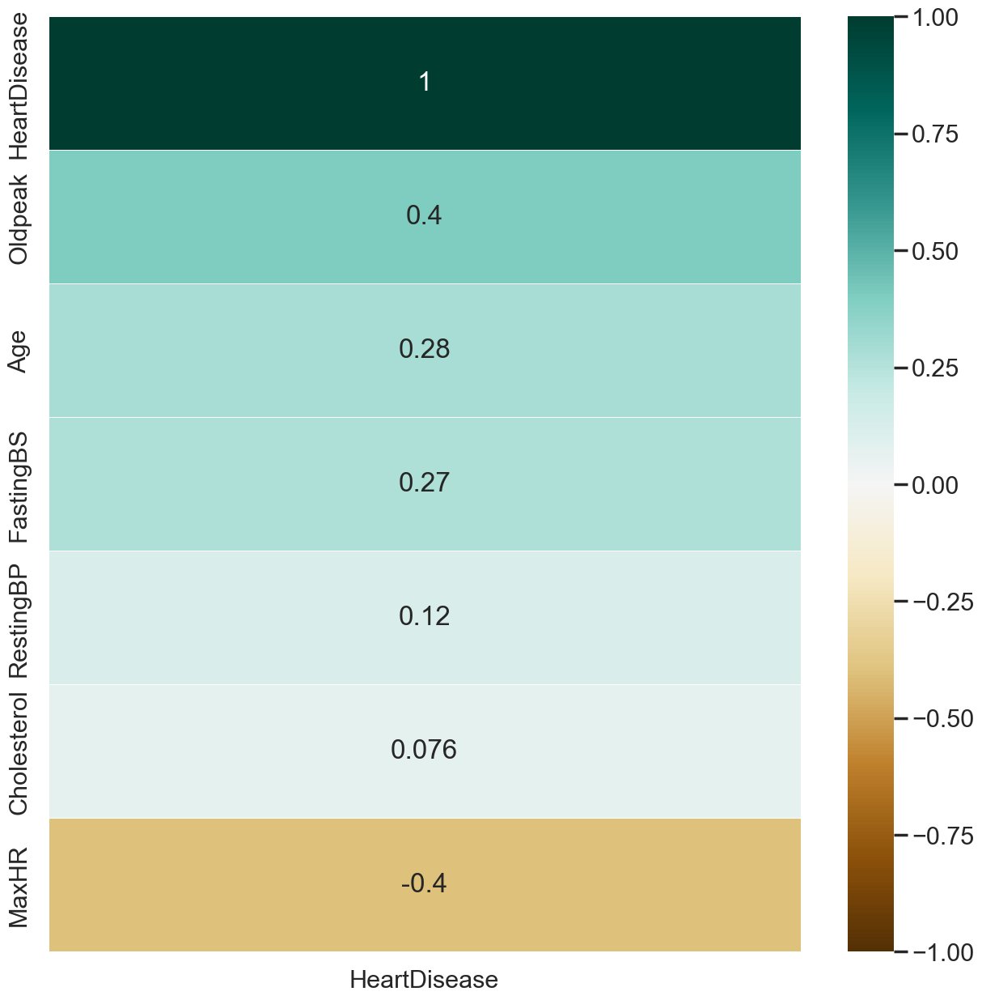

In [29]:
#Correlation between all features with heart disease.
plt.figure(figsize=(15,15))

sns.heatmap(dataset.corr()[['HeartDisease']].sort_values(by='HeartDisease', ascending=False),cmap='BrBG', vmin=-1, vmax= 1 , center=0, annot=True,linewidth=.5,square=False)

In [30]:
continuous_feature=[feature for feature in numerical_features if feature not in discrete_feature]
print("Continuous feature Count {}".format(len(continuous_feature)))
continuous_feature

Continuous feature Count 6


['Age', 'RestingBP', 'Cholesterol', 'MaxHR', 'Oldpeak', 'HeartDisease']

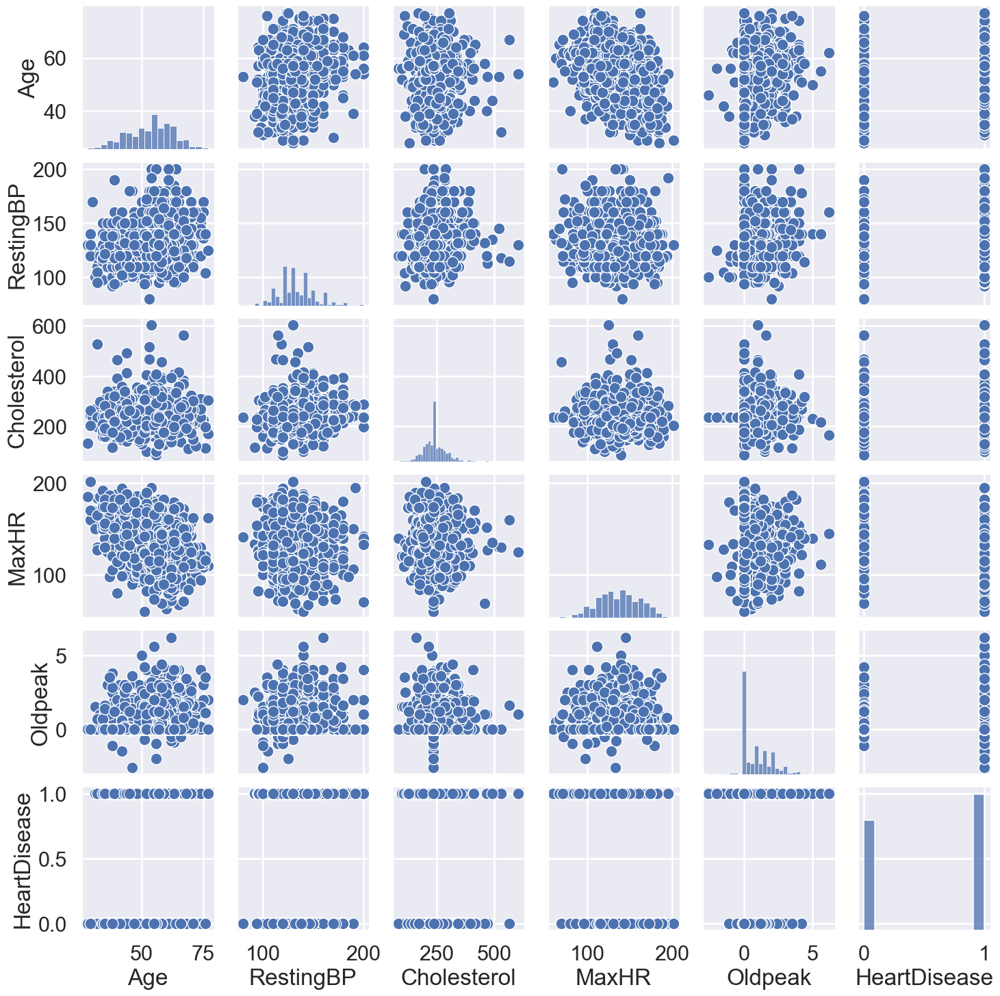

In [31]:
continuous = dataset[['Age', 'RestingBP', 'Cholesterol', 'MaxHR', 'Oldpeak','HeartDisease']]
sns.pairplot(continuous)

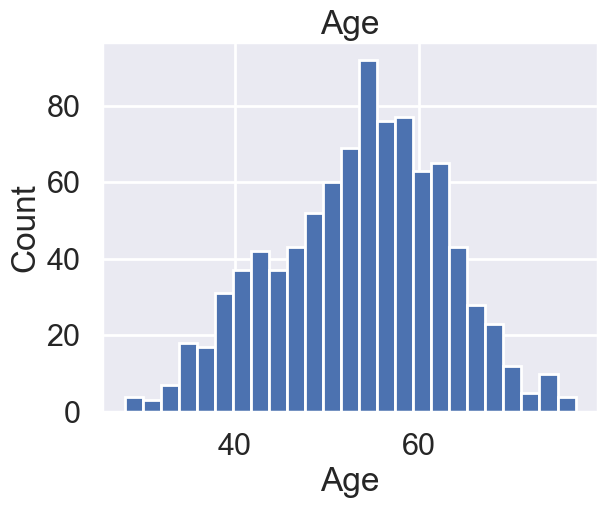

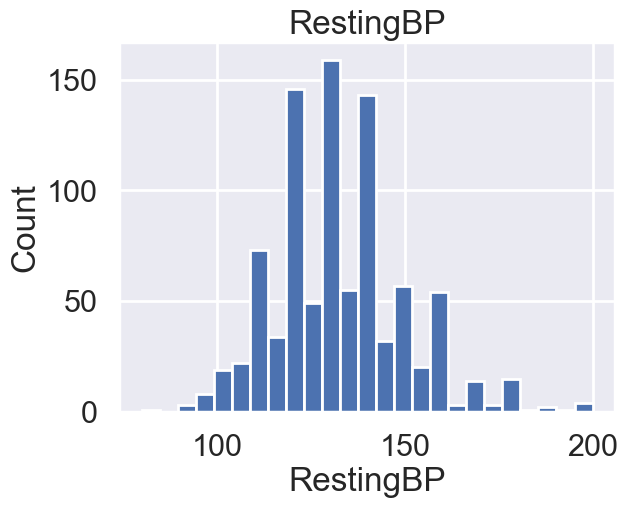

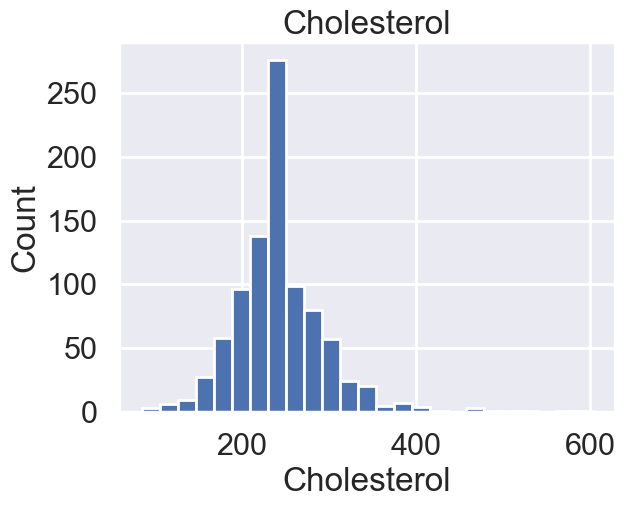

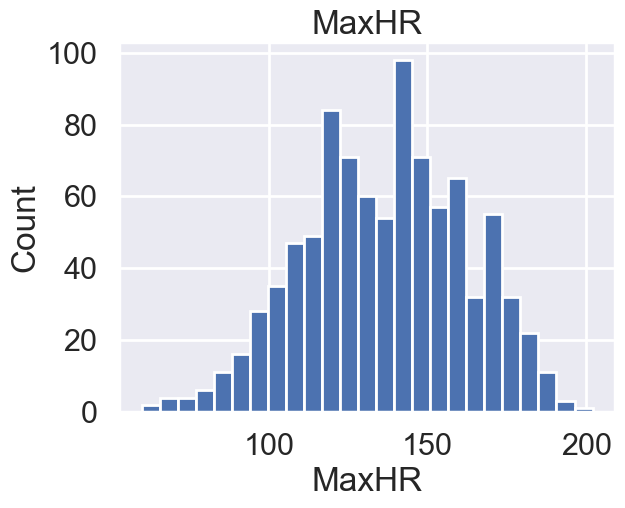

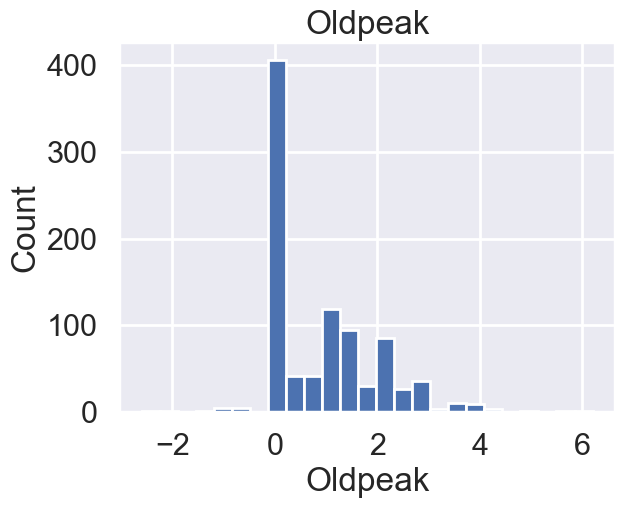

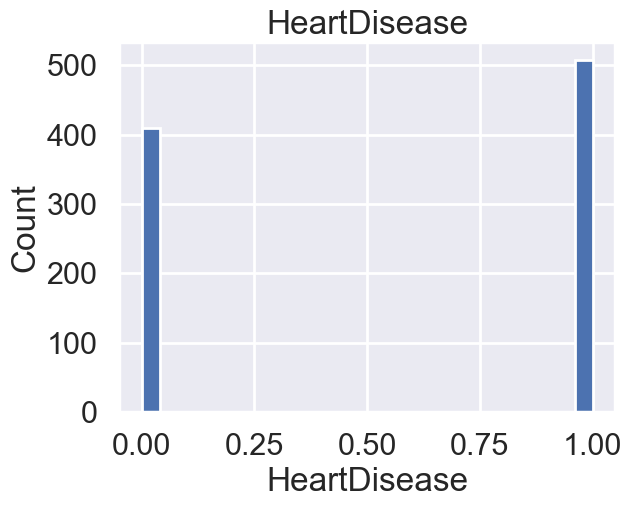

In [32]:
## Lets analyse the continuous values by creating histograms to understand the distribution
for feature in continuous_feature:
    data=dataset.copy()
    data[feature].hist(bins=25)
    plt.xlabel(feature)
    plt.ylabel("Count")
    plt.title(feature)
    plt.show()

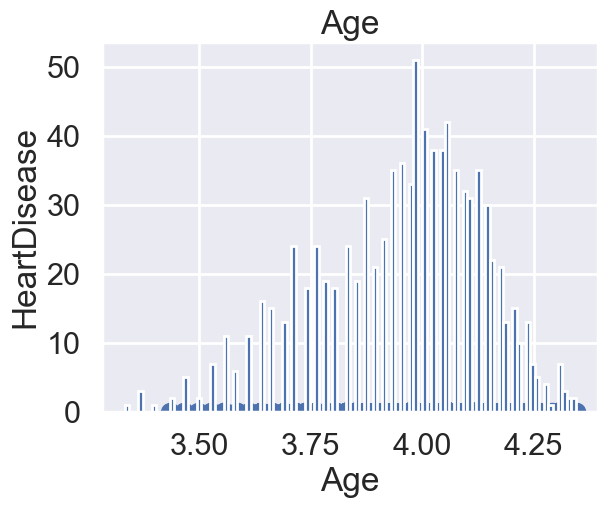

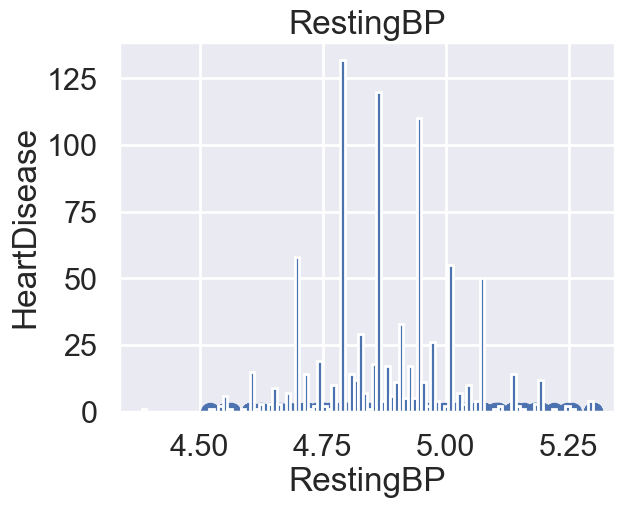

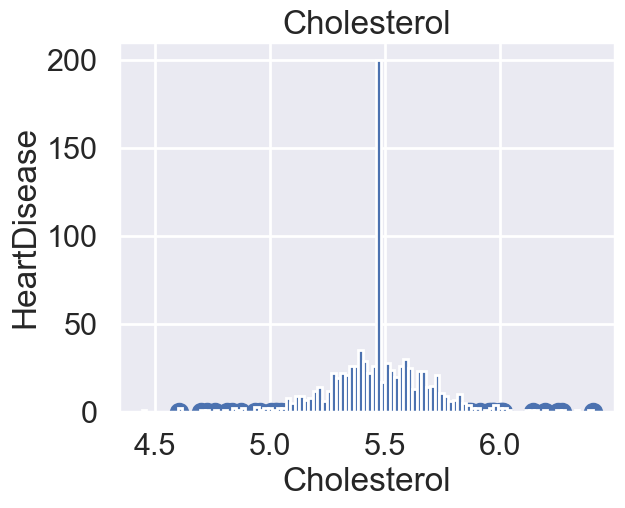

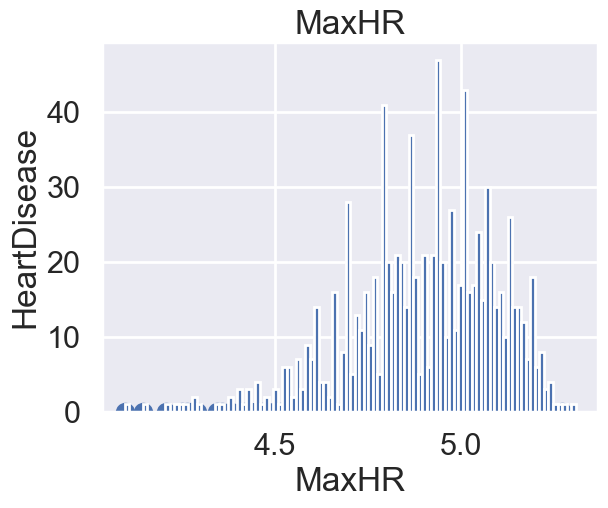

In [33]:
## We will be using logarithmic transformation

for feature in continuous_feature:
    data=dataset.copy()
    if 0 in data[feature].unique():
        pass
    else:
        data[feature]=np.log(data[feature])
        data['HeartDisease']=np.log(data['HeartDisease'])
        plt.scatter(data[feature],data['HeartDisease'])
        plt.xlabel(feature)
        data[feature].hist(bins=100)
        plt.ylabel('HeartDisease')
        plt.title(feature)
        plt.show()


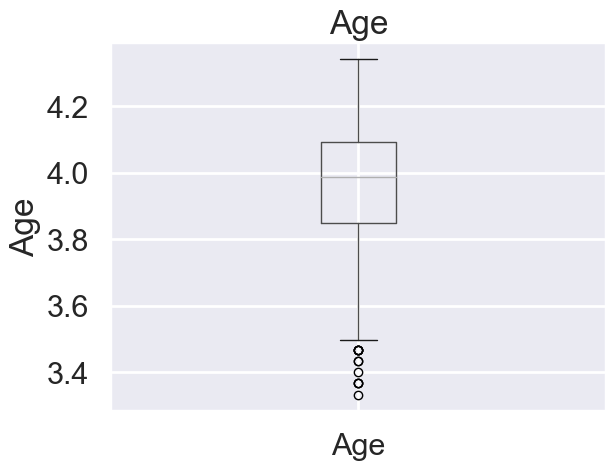

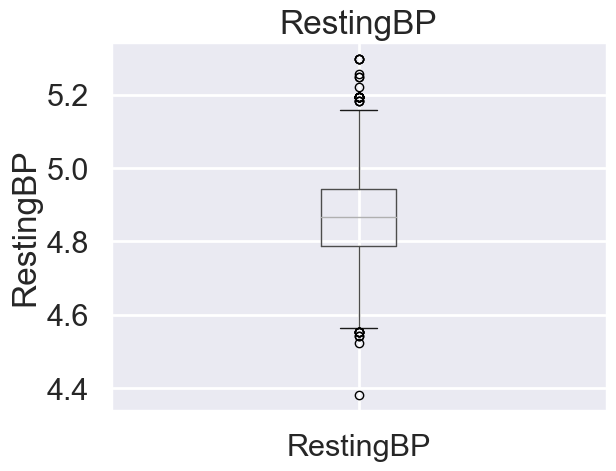

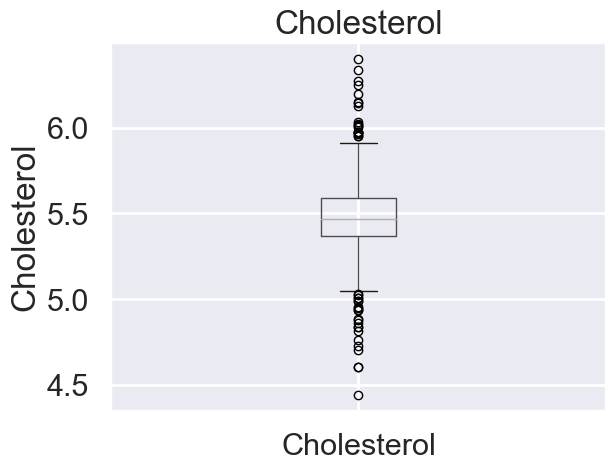

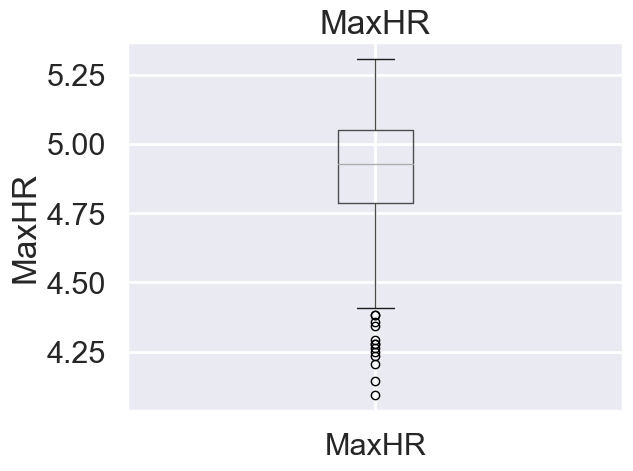

In [34]:
#outline

for feature in continuous_feature:
    data=dataset.copy()
    if 0 in data[feature].unique():
        pass
    else:
        data[feature]=np.log(data[feature])
        data.boxplot(column=feature)
        plt.ylabel(feature)
        plt.title(feature)
        plt.show()

In [35]:
# Categorical Variables
categorical_features=[feature for feature in dataset.columns if data[feature].dtypes=='O']
categorical_features

['Sex', 'ChestPainType', 'RestingECG', 'ExerciseAngina', 'ST_Slope']

In [36]:
for feature in categorical_features:
    print('The feature is {} and number of categories are {}'.format(feature,len(dataset[feature].unique())))

The feature is Sex and number of categories are 2
The feature is ChestPainType and number of categories are 4
The feature is RestingECG and number of categories are 3
The feature is ExerciseAngina and number of categories are 2
The feature is ST_Slope and number of categories are 3


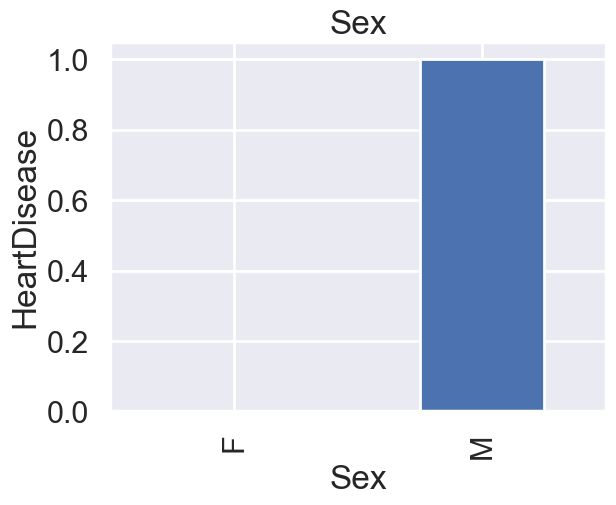

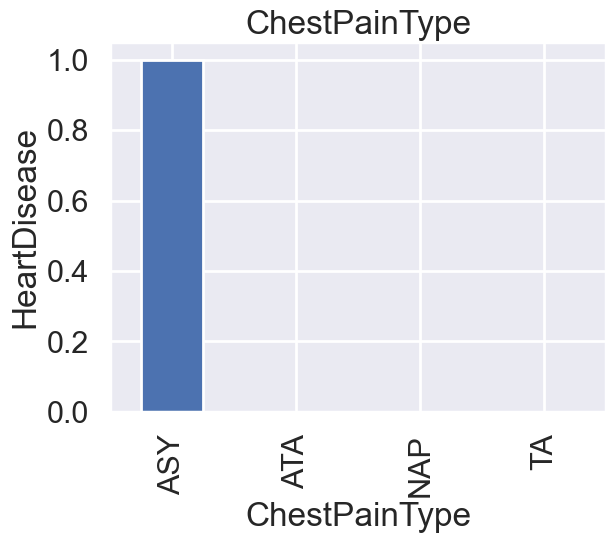

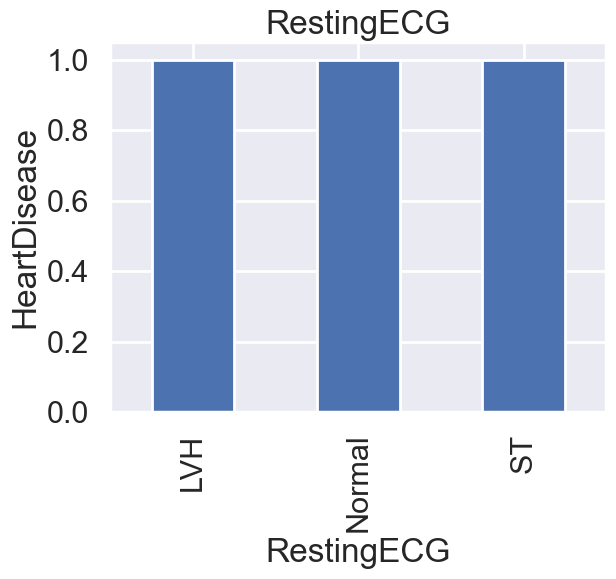

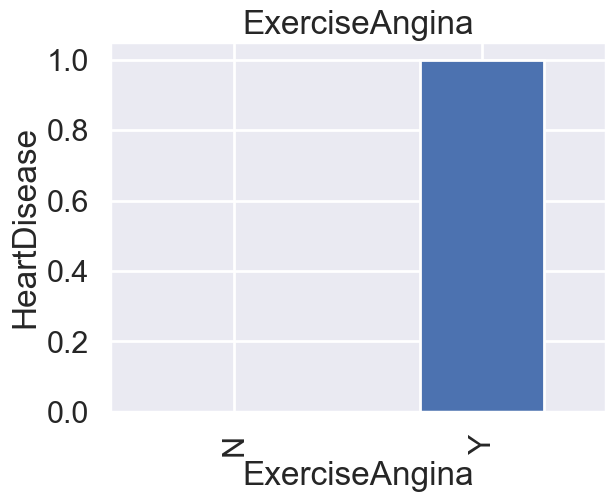

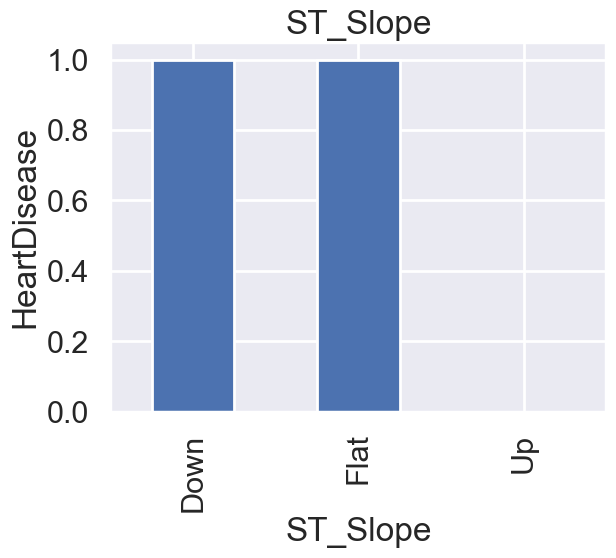

In [37]:
## Find out the relationship between categorical variable and dependent feature SalesPrice
for feature in categorical_features:
    data=dataset.copy()
    data.groupby(feature)['HeartDisease'].median().plot.bar()
    plt.xlabel(feature)
    plt.ylabel('HeartDisease')
    plt.title(feature)
    plt.show()

There are some features which are in object datatype, we have to convert those to numeric data. For that we have to use encoding. There are various methods for encoding categorical data, including one-hot encoding, label encoding, and target encoding. I used label encoding here.

dataset['Sex'].replace(to_replace=['M','F'],value=[1,2],inplace=True)
dataset['ChestPainType'].replace(to_replace=['ATA','NAP','ASY','TA'],value=[1,2,3,4],inplace=True)
dataset['RestingECG'].replace(to_replace=['Normal','ST','LVH'],value=[1,2,3],inplace=True)
dataset['ExerciseAngina'].replace(to_replace=['N','Y'],value=[1,2],inplace=True)
dataset['ST_Slope'].replace(to_replace=['Up','Flat','Down'],value=[1,2,3],inplace=True)

dataset.info()

In [38]:
# Always remember there way always be a chance of data leakage so we need to split the data first and then apply feature
## Engineering
from sklearn.model_selection import train_test_split, GridSearchCV
xtrain, xtest, ytrain, ytest = train_test_split(X, y, test_size = 0.25, stratify = y, random_state = 0)

NameError: name 'X' is not defined

In [39]:
dataset.shape

(918, 12)

In [40]:
xtrain.shape, xtest.shape, ytest.shape, ytrain.shape

NameError: name 'xtrain' is not defined

In [41]:
## Let us capture all the nan values
## First lets handle Categorical features which are missing
features_nan=[feature for feature in dataset.columns if dataset[feature].isnull().sum()>1 and dataset[feature].dtypes=='O']

for feature in features_nan:
    print("{}: {}% missing values".format(feature,np.round(dataset[feature].isnull().mean(),4)))

here i am seeing in the category feature as well i am having no missing value

# Numerical Variables
Since the numerical variables are skewed we will perform log normal distribution

In [42]:
dataset.head()

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,M,ATA,140,289.0,0,Normal,172,N,0.0,Up,0
1,49,F,NAP,160,180.0,0,Normal,156,N,1.0,Flat,1
2,37,M,ATA,130,283.0,0,ST,98,N,0.0,Up,0
3,48,F,ASY,138,214.0,0,Normal,108,Y,1.5,Flat,1
4,54,M,NAP,150,195.0,0,Normal,122,N,0.0,Up,0


In [43]:
import numpy as np
num_features=['RestingBP', 'Cholesterol', 'MaxHR', 'Age']

for feature in num_features:
    dataset[feature]=np.log(dataset[feature])

In [44]:
dataset.head()

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,3.688879,M,ATA,4.941642,5.666427,0,Normal,5.147494,N,0.0,Up,0
1,3.891820,F,NAP,5.075174,5.192957,0,Normal,5.049856,N,1.0,Flat,1
2,3.610918,M,ATA,4.867534,5.645447,0,ST,4.584967,N,0.0,Up,0
3,3.871201,F,ASY,4.927254,5.365976,0,Normal,4.682131,Y,1.5,Flat,1
4,3.988984,M,NAP,5.010635,5.273000,0,Normal,4.804021,N,0.0,Up,0


# Handling Rare Categorical Feature
We will remove categorical variables that are present less than 1% of the observations

In [45]:
categorical_features=[feature for feature in dataset.columns if dataset[feature].dtype=='O']

In [46]:
categorical_features

['Sex', 'ChestPainType', 'RestingECG', 'ExerciseAngina', 'ST_Slope']

In [47]:
for feature in categorical_features:
    temp=dataset.groupby(feature)['HeartDisease'].count()/len(dataset)
    temp_df=temp[temp>0.01].index
    dataset[feature]=np.where(dataset[feature].isin(temp_df),dataset[feature],'Rare_var')

In [48]:
dataset.head(100)

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,3.688879,M,ATA,4.941642,5.666427,0,Normal,5.147494,N,0.0,Up,0
1,3.891820,F,NAP,5.075174,5.192957,0,Normal,5.049856,N,1.0,Flat,1
2,3.610918,M,ATA,4.867534,5.645447,0,ST,4.584967,N,0.0,Up,0
3,3.871201,F,ASY,4.927254,5.365976,0,Normal,4.682131,Y,1.5,Flat,1
4,3.988984,M,NAP,5.010635,5.273000,0,Normal,4.804021,N,0.0,Up,0
...,...,...,...,...,...,...,...,...,...,...,...,...
95,4.060443,M,ASY,4.867534,5.572154,0,Normal,4.941642,Y,2.0,Flat,1
96,3.761200,M,ATA,4.955827,5.332719,0,Normal,4.927254,N,0.0,Up,0
97,3.663562,M,NAP,5.075174,4.990433,1,Normal,5.075174,N,0.0,Up,0
98,4.025352,M,ASY,4.787492,4.442651,0,Normal,4.941642,N,0.0,Up,0


dataset['Sex'].replace(to_replace=['M','F'],value=[1,2],inplace=True)
dataset['ChestPainType'].replace(to_replace=['ATA','NAP','ASY','TA'],value=[1,2,3,4],inplace=True)
dataset['RestingECG'].replace(to_replace=['Normal','ST','LVH'],value=[1,2,3],inplace=True)
dataset['ExerciseAngina'].replace(to_replace=['N','Y'],value=[1,2],inplace=True)
dataset['ST_Slope'].replace(to_replace=['Up','Flat','Down'],value=[1,2,3],inplace=True)

In [49]:
from sklearn.preprocessing import LabelEncoder

In [50]:
#create instance of label encoder
lab = LabelEncoder()

#perform label encoding on 'every' column
dataset['Sex'] = lab.fit_transform(dataset['Sex'])
dataset['ChestPainType'] = lab.fit_transform(dataset['ChestPainType'])
dataset['RestingECG'] = lab.fit_transform(dataset['RestingECG'])
dataset['ExerciseAngina'] = lab.fit_transform(dataset['ExerciseAngina'])
dataset['ST_Slope'] = lab.fit_transform(dataset['ST_Slope'])

In [51]:
X = dataset.drop('HeartDisease', axis = 1)
y = dataset['HeartDisease']

xtrain, xtest, ytrain, ytest = train_test_split(X, y, test_size = 0.25, stratify = y, random_state = 0)

In [52]:
# Always remember there way always be a chance of data leakage so we need to split the data first and then apply feature
## Engineering
from sklearn.model_selection import train_test_split, GridSearchCV
xtrain, xtest, ytrain, ytest = train_test_split(X, y, test_size = 0.25, stratify = y, random_state = 0)

# DATA BALANCING

1. SMOTE TECHNIQUE

In [53]:
smt = SMOTE(random_state = 0)
xtrain_res, ytrain_res = smt.fit_resample(xtrain, ytrain)

print(f'Distribution BEFORE balancing:\n{ytrain.value_counts()}')
print()
print(f'Distribution AFTER balancing:\n{ytrain_res.value_counts()}')

Distribution BEFORE balancing:
1    381
0    307
Name: HeartDisease, dtype: int64

Distribution AFTER balancing:
0    381
1    381
Name: HeartDisease, dtype: int64


2. RANDOM OVERSAMPLING

In [54]:
from imblearn.over_sampling import RandomOverSampler
ros = RandomOverSampler(random_state = 42)
  
X_res, y_res = ros.fit_resample(xtrain, ytrain)
   
X_res = pd.DataFrame(X_res)
Y_res = pd.DataFrame(y_res)
   
   
print(f'Distribution BEFORE balancing:\n{ytrain.value_counts()}')
print()
print(f'Distribution AFTER balancing:\n{Y_res.value_counts()}')
print(f'Distribution BEFORE balancing:\n{xtrain.value_counts()}')
print()
print(f'Distribution AFTER balancing:\n{X_res.value_counts()}')

Distribution BEFORE balancing:
1    381
0    307
Name: HeartDisease, dtype: int64

Distribution AFTER balancing:
HeartDisease
0               381
1               381
dtype: int64
Distribution BEFORE balancing:
Age       Sex  ChestPainType  RestingBP  Cholesterol  FastingBS  RestingECG  MaxHR     ExerciseAngina  Oldpeak  ST_Slope
3.332205  1    1              4.867534   4.882802     0          0           5.220356  0               0.0      2           1
4.060443  1    0              5.135798   5.468060     1          2           4.653960  1               0.0      1           1
                              4.867534   5.468060     0          2           4.605170  1               1.0      1           1
                                         5.572154     0          1           4.941642  1               2.0      1           1
                              4.882802   6.126869     1          1           4.234107  0               1.0      0           1
                                       

In [55]:
from sklearn.preprocessing import MinMaxScaler,StandardScaler
mms = MinMaxScaler() # Normalization
ss = StandardScaler() # Standardization

dataset['Oldpeak'] = mms.fit_transform(dataset[['Oldpeak']])
dataset['Age'] = ss.fit_transform(dataset[['Age']])
dataset['RestingBP'] = ss.fit_transform(dataset[['RestingBP']])
dataset['Cholesterol'] = ss.fit_transform(dataset[['Cholesterol']])
dataset['MaxHR'] = ss.fit_transform(dataset[['MaxHR']])
dataset.head()

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,-1.476257,1,1,0.477360,0.920859,0,1,1.258091,0,0.295455,2,0
1,-0.384482,0,2,1.477207,-1.314806,0,1,0.761639,0,0.409091,1,1
2,-1.895672,1,1,-0.077541,0.821795,0,2,-1.602133,0,0.295455,2,0
3,-0.495409,0,0,0.369621,-0.497831,0,1,-1.108095,1,0.465909,1,1
4,0.138237,1,2,0.993960,-0.936855,0,1,-0.488334,0,0.295455,2,0


In [56]:
scaling_feature=[feature for feature in dataset.columns if feature not in ['HeartDisease']]
len(scaling_feature)

11

In [57]:
mask = ~np.isfinite(dataset)

# count the number of infinite or NaN values in each column
column_sum = mask.sum(axis=0)

# print the column(s) with infinite or NaN values and the number of occurrences
print(column_sum[column_sum > 0]) 

Series([], dtype: int64)


<AxesSubplot:>

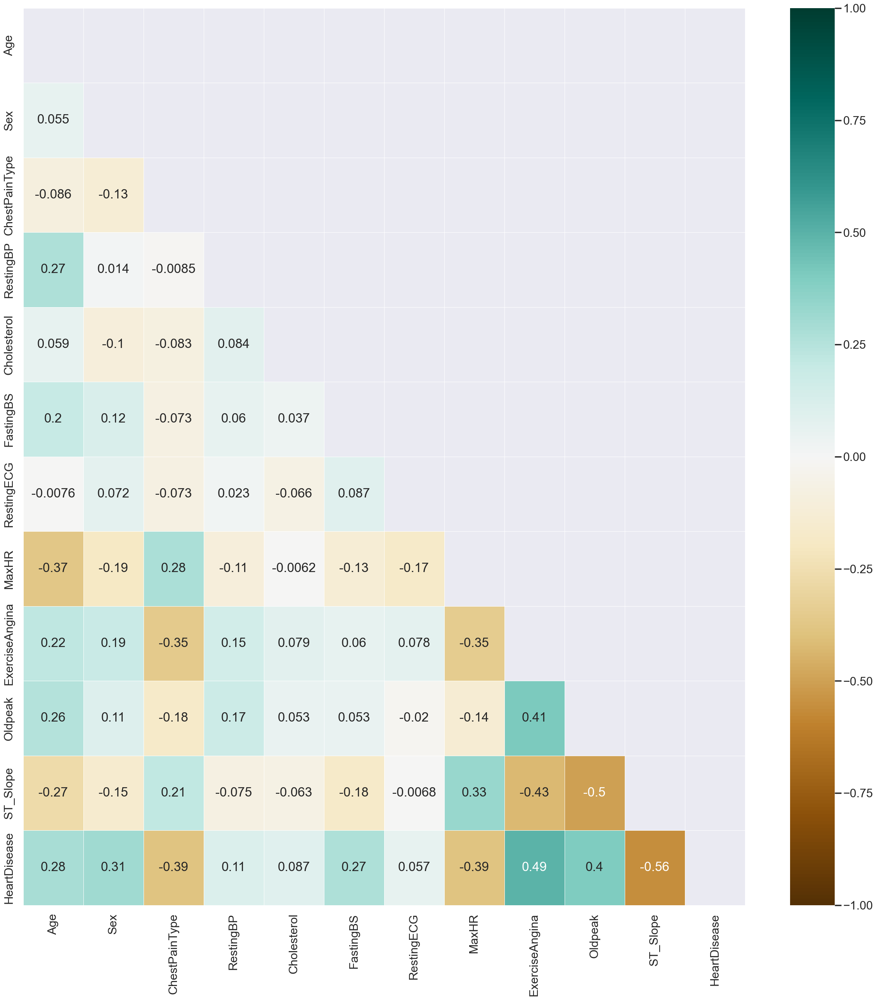

In [58]:
corr = dataset.corr()
plt.figure(figsize=(30,30))
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr,mask=mask,cmap='BrBG', vmin=-1, vmax= 1 , center=0, annot=True,linewidth=.5,square=False)

<AxesSubplot:>

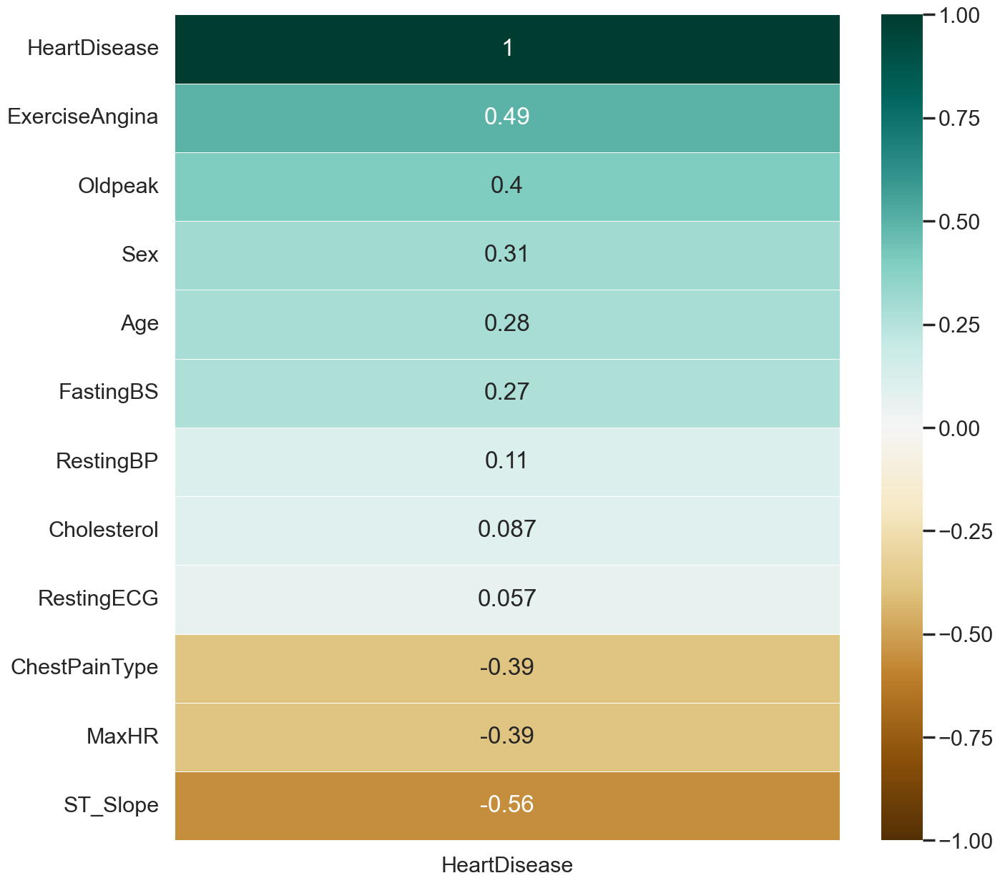

In [59]:
#Correlation between all features with heart disease.
plt.figure(figsize=(15,15))

sns.heatmap(dataset.corr()[['HeartDisease']].sort_values(by='HeartDisease', ascending=False),cmap='BrBG', vmin=-1, vmax= 1 , center=0, annot=True,linewidth=.5,square=False)

here except restingBP, cholestrol and restingECG every other feature is positivily or negatively related

### Feature selection for droping the features which have constant values

In [60]:
from sklearn.feature_selection import VarianceThreshold
var_thres=VarianceThreshold(threshold=0)
var_thres.fit(xtrain)

VarianceThreshold(threshold=0)

In [61]:
var_thres.get_support()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True])

# it shows there are no features with constant variance

In [62]:
sum(var_thres.get_support())

11

In [63]:
# feature selection using pearsons coefficient
xtrain.corr()

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope
Age,1.000000,0.032033,-0.092091,0.254014,0.076881,0.191982,-0.006497,-0.384264,0.212047,0.254662,-0.276504
Sex,0.032033,1.000000,-0.151527,-0.018451,-0.117006,0.123916,0.082382,-0.180848,0.191426,0.103717,-0.145199
ChestPainType,-0.092091,-0.151527,1.000000,-0.005650,-0.028463,-0.077693,-0.071210,0.283995,-0.380195,-0.199327,0.234138
RestingBP,0.254014,-0.018451,-0.005650,1.000000,0.079429,0.098412,0.024485,-0.086591,0.157324,0.187206,-0.078059
Cholesterol,0.076881,-0.117006,-0.028463,0.079429,1.000000,0.060457,-0.095363,0.011228,0.060743,0.050490,-0.050050
FastingBS,0.191982,0.123916,-0.077693,0.098412,0.060457,1.000000,0.078839,-0.147872,0.036984,0.057582,-0.185853
RestingECG,-0.006497,0.082382,-0.071210,0.024485,-0.095363,0.078839,1.000000,-0.172534,0.061707,-0.025891,-0.007032
MaxHR,-0.384264,-0.180848,0.283995,-0.086591,0.011228,-0.147872,-0.172534,1.000000,-0.331532,-0.134265,0.333300
ExerciseAngina,0.212047,0.191426,-0.380195,0.157324,0.060743,0.036984,0.061707,-0.331532,1.000000,0.412439,-0.433915
Oldpeak,0.254662,0.103717,-0.199327,0.187206,0.050490,0.057582,-0.025891,-0.134265,0.412439,1.000000,-0.515988


In [64]:
# with the following function we can select highly correlated features
# it will remove the first feature that is correlated with anything other feature

def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

In [65]:
corr_features = correlation(xtrain, 0.7)
len(set(corr_features))

0

 In my dataset we dont have features which are highly correlated with each other thus we dont need to remove any feature

# Information gain

Information gain calculates the reduction in entropy from the transformation of a dataset. It can be
used for feature selection by evaluating the Information gain of each variable in the context of the
target variable

In [66]:
from sklearn.feature_selection import mutual_info_classif

In [67]:
mutual_info=mutual_info_classif(X,y)

In [68]:
mutual_data=pd.Series(mutual_info,index=X.columns)
mutual_data.sort_values(ascending=False)

ST_Slope          0.218263
ChestPainType     0.154449
Oldpeak           0.125959
ExerciseAngina    0.119410
MaxHR             0.098757
Cholesterol       0.071835
Sex               0.064766
Age               0.057876
FastingBS         0.050390
RestingECG        0.023384
RestingBP         0.000000
dtype: float64

<Figure size 10000x10000 with 0 Axes>

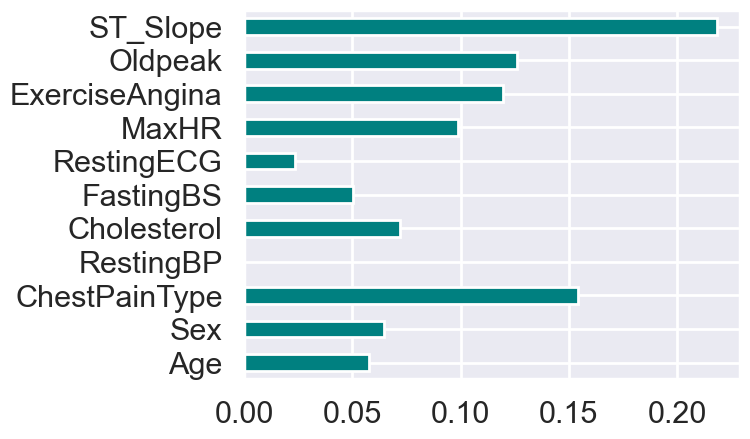

<Figure size 10000x10000 with 0 Axes>

In [69]:
from matplotlib.pyplot import figure
mutual_data.plot(kind='barh',color='teal')
figure(figsize=(100, 100) )

In [70]:
from mlxtend.feature_selection import SequentialFeatureSelector
from sklearn.ensemble import ExtraTreesClassifier

In [71]:
forward_feature_selection= SequentialFeatureSelector(ExtraTreesClassifier(n_jobs=-1), k_features= (1,11), forward=True,floating=False, verbose=2,scoring='accuracy',cv=5).fit(xtrain,ytrain)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    4.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  11 out of  11 | elapsed:    9.6s finished

[2023-07-12 18:46:50] Features: 1/11 -- score: 0.8111075848936846[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    6.1s finished

[2023-07-12 18:46:56] Features: 2/11 -- score: 0.8111075848936846[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    5.5s finished

[2023-07-12 18:47:02] Features: 3/11 -- score: 0.8299481646038295[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  

In [72]:
forward_feature_selection.k_feature_names_

('Age',
 'Sex',
 'ChestPainType',
 'Cholesterol',
 'FastingBS',
 'RestingECG',
 'MaxHR',
 'ExerciseAngina',
 'Oldpeak',
 'ST_Slope')

In [73]:
forward_feature_selection.k_score_

0.850248598328573

In [74]:
pd.DataFrame.from_dict(forward_feature_selection.get_metric_dict()).T

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
1,"(10,)","[0.7971014492753623, 0.8478260869565217, 0.746...",0.811108,"(ST_Slope,)",0.046758,0.036379,0.01819
2,"(5, 10)","[0.7971014492753623, 0.8478260869565217, 0.746...",0.811108,"(FastingBS, ST_Slope)",0.046758,0.036379,0.01819
3,"(2, 5, 10)","[0.8405797101449275, 0.8623188405797102, 0.782...",0.829948,"(ChestPainType, FastingBS, ST_Slope)",0.035608,0.027704,0.013852
4,"(1, 2, 5, 10)","[0.8768115942028986, 0.8768115942028986, 0.782...",0.844473,"(Sex, ChestPainType, FastingBS, ST_Slope)",0.045123,0.035107,0.017553
5,"(1, 2, 5, 8, 10)","[0.8695652173913043, 0.8840579710144928, 0.797...",0.848831,"(Sex, ChestPainType, FastingBS, ExerciseAngina...",0.048159,0.037469,0.018735
6,"(1, 2, 5, 6, 8, 10)","[0.8623188405797102, 0.8623188405797102, 0.768...",0.832857,"(Sex, ChestPainType, FastingBS, RestingECG, Ex...",0.048941,0.038078,0.019039
7,"(1, 2, 5, 6, 8, 9, 10)","[0.8333333333333334, 0.8333333333333334, 0.760...",0.809595,"(Sex, ChestPainType, FastingBS, RestingECG, Ex...",0.034015,0.026465,0.013232
8,"(1, 2, 5, 6, 7, 8, 9, 10)","[0.8478260869565217, 0.8840579710144928, 0.760...",0.822638,"(Sex, ChestPainType, FastingBS, RestingECG, Ma...",0.055994,0.043565,0.021783
9,"(0, 1, 2, 5, 6, 7, 8, 9, 10)","[0.8333333333333334, 0.8768115942028986, 0.768...",0.835798,"(Age, Sex, ChestPainType, FastingBS, RestingEC...",0.054078,0.042074,0.021037
10,"(0, 1, 2, 4, 5, 6, 7, 8, 9, 10)","[0.8840579710144928, 0.8913043478260869, 0.804...",0.850249,"(Age, Sex, ChestPainType, Cholesterol, Fasting...",0.061234,0.047642,0.023821


# Feature Selection for Categorical Features :

In [75]:
categorical_features

['Sex', 'ChestPainType', 'RestingECG', 'ExerciseAngina', 'ST_Slope']

# Chi Squared Test :

In [76]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

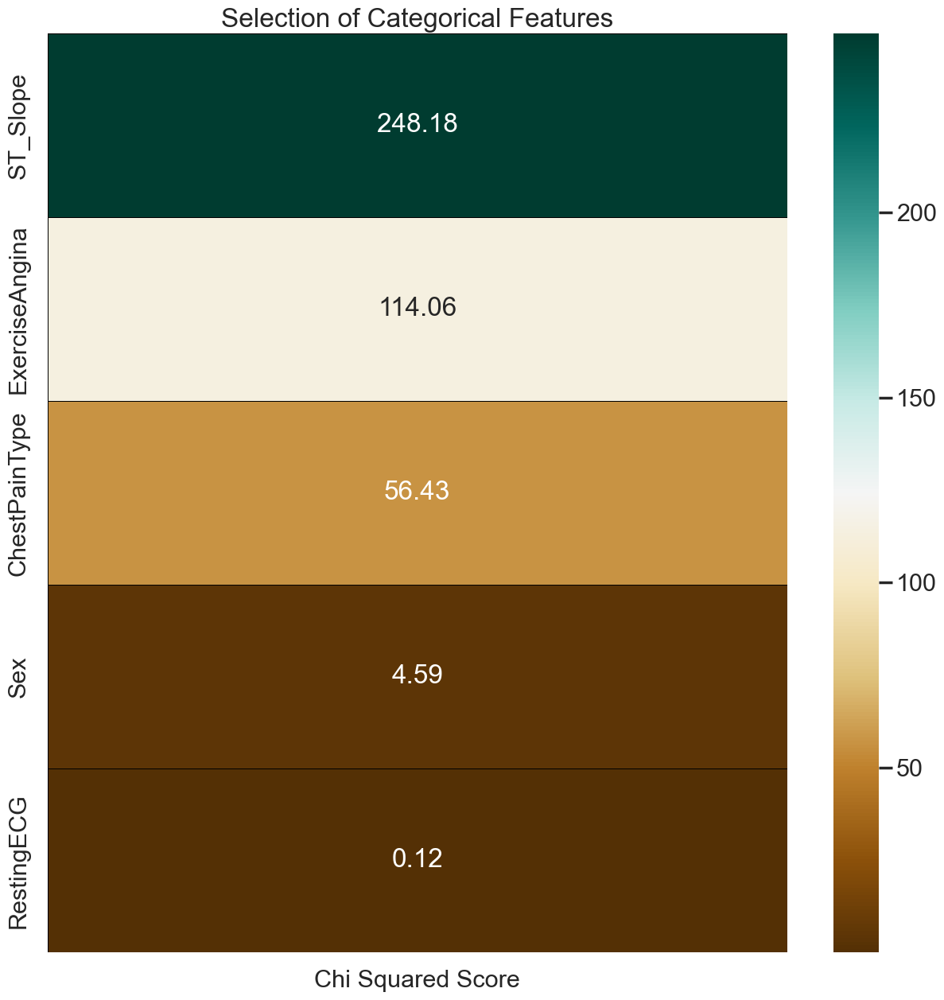

In [77]:
features = dataset.loc[:,categorical_features[:]]
target = dataset.loc[:,categorical_features[-1]]

best_features = SelectKBest(score_func = chi2,k = 3)
fit = best_features.fit(features,target)

featureScores = pd.DataFrame(data = fit.scores_,index = list(features.columns),columns = ['Chi Squared Score']) 

plt.subplots(figsize = (15,15))
sns.heatmap(featureScores.sort_values(ascending = False,by = 'Chi Squared Score'),annot = True,cmap ='BrBG',linewidths = 0.5,linecolor = 'black',fmt = '.2f');
plt.title('Selection of Categorical Features');

<AxesSubplot:>

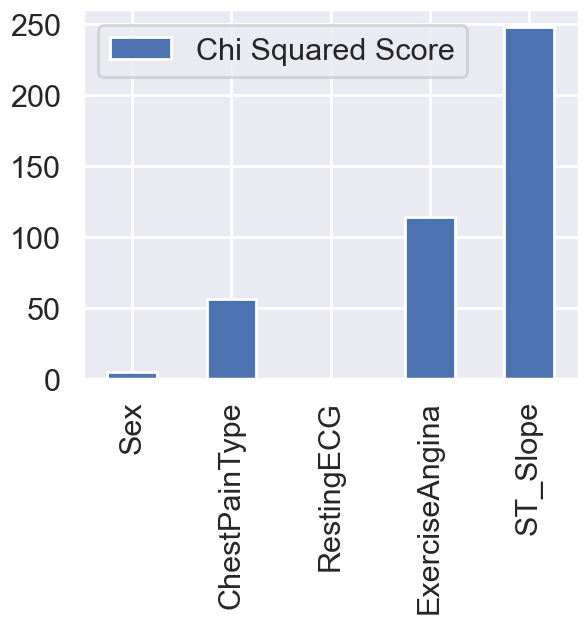

In [78]:
featureScores.plot.bar()

Except RestingECG, all the remaining categorical features are pretty important for predicting heart diseases

# Feature Selection for Numerical Features :

# ANOVA Test 

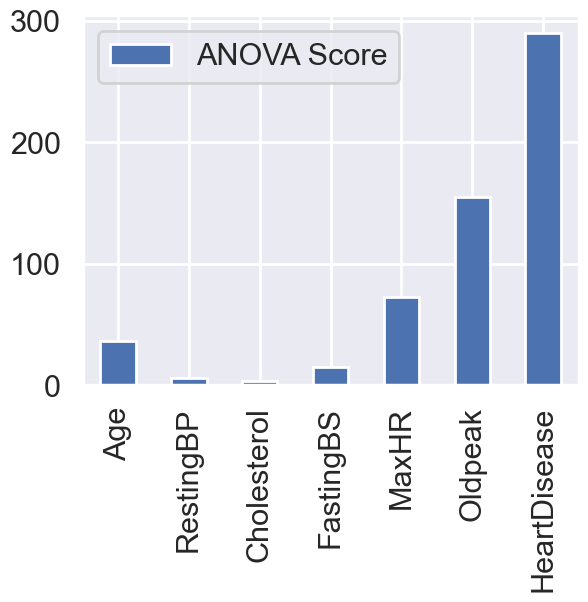

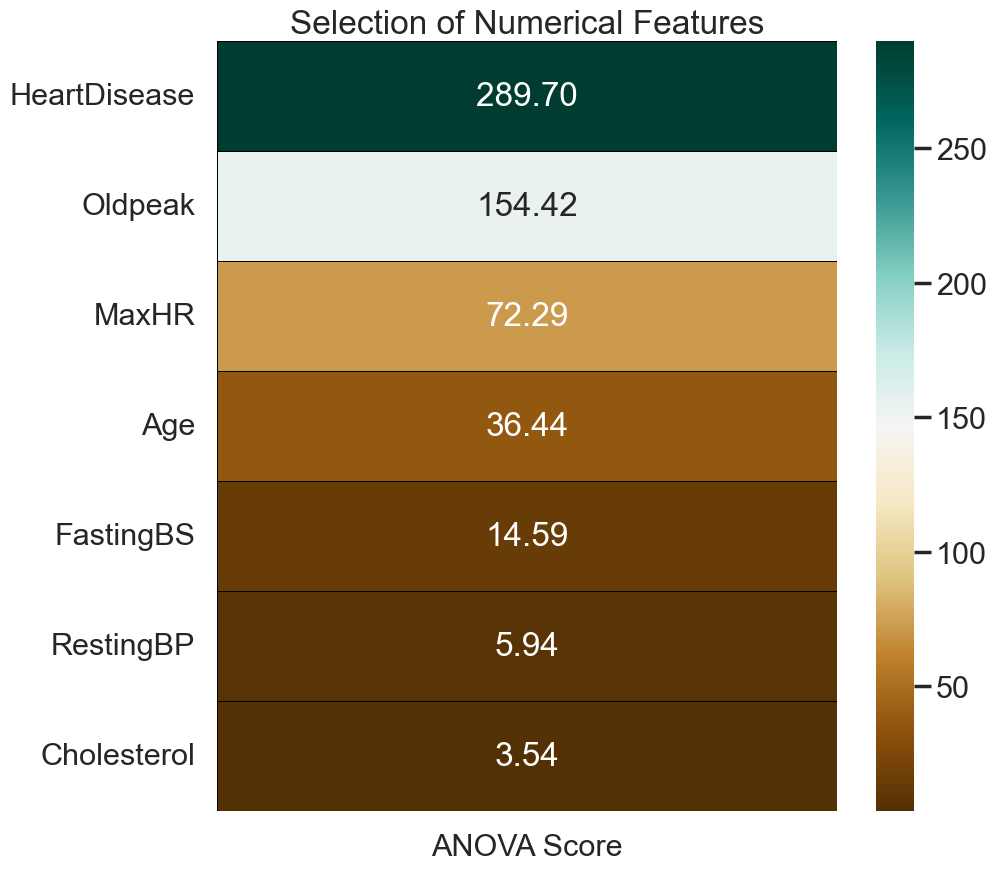

In [79]:
from sklearn.feature_selection import f_classif

features = dataset.loc[:,numerical_features]
target = dataset.loc[:,categorical_features[-1]]

best_features = SelectKBest(score_func = f_classif,k = 'all')
fit = best_features.fit(features,target)

featureScores = pd.DataFrame(data = fit.scores_,index = list(features.columns),columns = ['ANOVA Score']) 
featureScores.plot.bar()
plt.subplots(figsize = (10,10))
sns.heatmap(featureScores.sort_values(ascending = False,by = 'ANOVA Score'),annot = True,cmap ='BrBG',linewidths = 0.4,linecolor = 'black',fmt = '.2f');
plt.title('Selection of Numerical Features');

<AxesSubplot:>

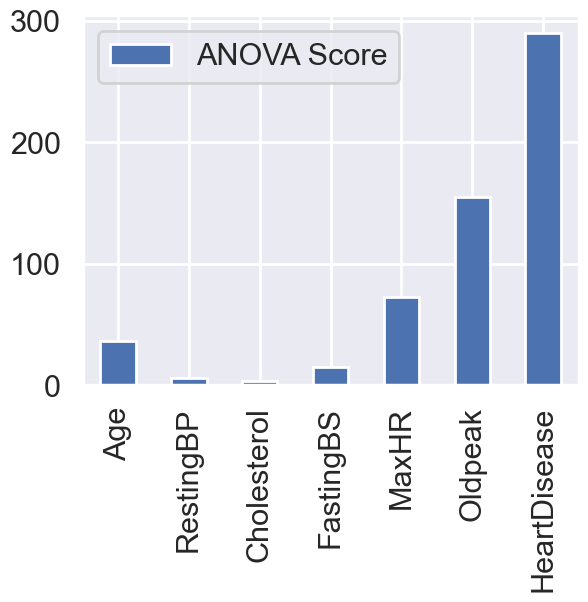

In [80]:
featureScores.plot.bar()

In [81]:
pip install lightgbm

Note: you may need to restart the kernel to use updated packages.


overall the least related features are restingECG, Cholestrol and then RestingBP

In [82]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.metrics import plot_roc_curve
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.metrics import precision_recall_curve

In [83]:
def model(classifier):
    
    classifier.fit(xtrain,ytrain)
    prediction = classifier.predict(xtest)
    cv = RepeatedStratifiedKFold(n_splits = 10,n_repeats = 3,random_state = 1)
    print("Accuracy : ",'{0:.2%}'.format(accuracy_score(ytest,prediction)))
    print("Cross Validation Score : ",'{0:.2%}'.format(cross_val_score(classifier,xtrain,ytrain,cv = cv,scoring = 'roc_auc').mean()))
    print("ROC_AUC Score : ",'{0:.2%}'.format(roc_auc_score(ytest,prediction)))
    print("Error Rate: ",'{0:.2%}'.format(1-accuracy_score(ytest,prediction)))
    plot_roc_curve(classifier, xtest,ytest)
    plt.title('ROC_AUC_Plot')
    plt.show()

    
def model_evaluation(classifier):
    
    # Confusion Matrix
    cm = confusion_matrix(ytest,classifier.predict(xtest))
    names = ['True Neg','False Pos','False Neg','True Pos']
    counts = [value for value in cm.flatten()]
    percentages = ['{0:.2%}'.format(value) for value in cm.flatten()/np.sum(cm)]
    labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(names,counts,percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sns.heatmap(cm,annot = labels,cmap ='BrBG' ,fmt ='')
    
    # Classification Report
    print(classification_report(ytest,classifier.predict(xtest)))



# 1] Logistic Regression 

In [85]:
from sklearn.linear_model import LogisticRegression
from scipy.stats import loguniform
from sklearn.linear_model import Ridge
from sklearn.model_selection import RepeatedKFold
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)

modell=Ridge()

In [136]:
# normal logistic regression
classifier_lr = LogisticRegression(random_state = 66,C=100,penalty= 'l2',solver='newton-cg',class_weight='balanced')

In [87]:
# Classification for GridSearchCV
classifier=LogisticRegression()

In [138]:
from sklearn.model_selection import GridSearchCV
parameter={'penalty':['l1','l2','elasticnet'],'C':[5,6,10,20,30,40,50],'max_iter':[100,200,300],'solver':['newton-cg','lbfgs','liblinear']}

In [139]:
classifier_regressor=GridSearchCV(classifier_lr,param_grid=parameter,scoring='accuracy',cv=cv)

from sklearn.model_selection import RandomizedSearchCV
para={'fit_intercept' :[True, False],'normalize' :[True, False],'solver':['svd', 'cholesky', 'lsqr', 'sag','saga'],'alpha' : loguniform(1e-5, 100)}
classifier_reg=RandomizedSearchCV(modell,para, n_iter=500, scoring='neg_mean_absolute_error', n_jobs=-1, cv=cv, random_state=1)

classifier_reg.fit(xtrain,ytrain)

print(classifier_reg.best_params_)

print(classifier_reg.best_score_)

##prediction
y_pre=classifier_reg.predict(xtest)

In [140]:
classifier_regressor.fit(xtrain,ytrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=LogisticRegression(C=100, class_weight='balanced',
                                          random_state=66, solver='newton-cg'),
             param_grid={'C': [5, 6, 10, 20, 30, 40, 50],
                         'max_iter': [100, 200, 300],
                         'penalty': ['l1', 'l2', 'elasticnet'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear']},
             scoring='accuracy')

In [141]:
print(classifier_regressor.best_params_)

{'C': 40, 'max_iter': 100, 'penalty': 'l2', 'solver': 'liblinear'}


In [142]:
print(classifier_regressor.best_score_)

0.8385976129582268


In [143]:
##prediction
y_pred=classifier_regressor.predict(xtest)

In [144]:
## accuracy score
from sklearn.metrics import accuracy_score,classification_report

In [145]:
score=accuracy_score(y_pred,ytest)
print(score)

0.8478260869565217


In [146]:
# imbalanced and via grid search
print(classification_report(y_pred,ytest))

              precision    recall  f1-score   support

           0       0.90      0.79      0.84       118
           1       0.80      0.91      0.85       112

    accuracy                           0.85       230
   macro avg       0.85      0.85      0.85       230
weighted avg       0.85      0.85      0.85       230



Accuracy :  85.22%
Cross Validation Score :  90.94%
ROC_AUC Score :  85.42%
Error Rate:  14.78%


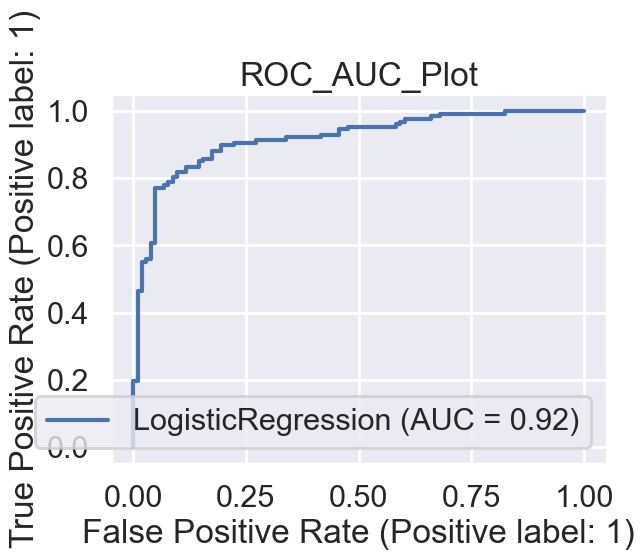

In [147]:
#not balanced and without grid search hyperparameters
model(classifier)

Accuracy :  84.35%
Cross Validation Score :  90.99%
ROC_AUC Score :  84.91%
Error Rate:  15.65%


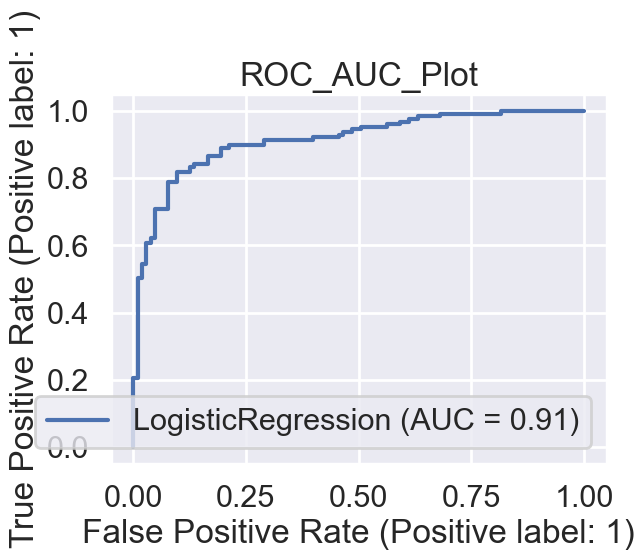

In [148]:
# balanced but without GridSearchCV hyperparameters
model(classifier_lr)

              precision    recall  f1-score   support

           0       0.78      0.90      0.84       103
           1       0.91      0.80      0.85       127

    accuracy                           0.84       230
   macro avg       0.85      0.85      0.84       230
weighted avg       0.85      0.84      0.84       230



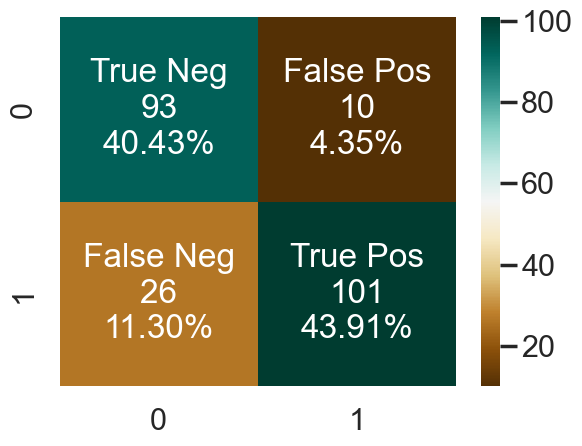

In [149]:
#Report generated after classifier without gridsearchcv 
model_evaluation(classifier_lr)

## 2] linear regression

In [120]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score

In [121]:
ridge_regressor=Ridge()

In [122]:
parameters={'alpha':[1,2,5,10,20,30,40,50,60,70,80,90]}
ridgecv=GridSearchCV(ridge_regressor,parameters,scoring='neg_mean_squared_error',cv=5)
ridgecv.fit(xtrain,ytrain)

GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [1, 2, 5, 10, 20, 30, 40, 50, 60, 70, 80,
                                   90]},
             scoring='neg_mean_squared_error')

In [123]:
print(ridgecv.best_params_)

{'alpha': 10}


In [124]:
print(ridgecv.best_score_)

-0.12723248622346786


In [125]:
ridge_pred=ridgecv.predict(xtest)

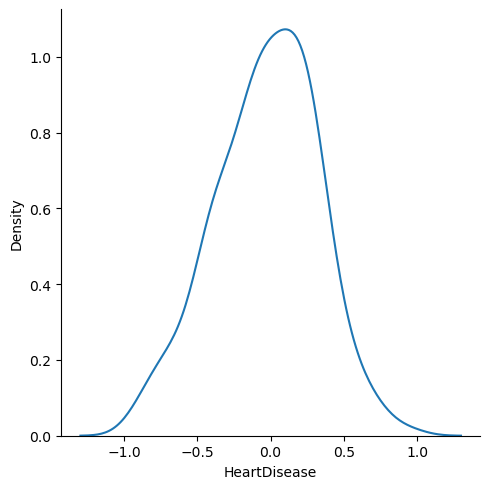

In [126]:
import seaborn as sns
sns.displot(ridge_pred-ytest,kind='kde')

In [127]:
score=r2_score(ridge_pred,ytest)
print(score)

-0.08160270083331822


# 2] Decision Tree Classifier 

In [150]:
from sklearn.tree import DecisionTreeClassifier

In [175]:
classifier_dtbalanced = DecisionTreeClassifier(random_state = 10,max_depth = 100,min_samples_leaf = 4, class_weight='balanced')

In [177]:
classifier1=DecisionTreeClassifier(random_state = 10,max_depth = 100,min_samples_leaf = 4)

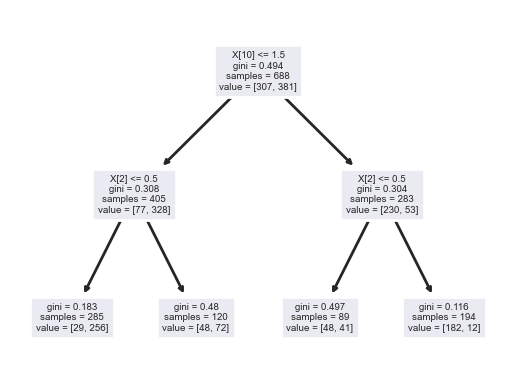

In [179]:
tree=DecisionTreeClassifier(max_depth=2)
tree.fit(xtrain,ytrain)
from sklearn.tree import plot_tree
plot_tree(tree,fontsize=7)
plt.show()

In [180]:
parameter1 ={'criterion':['gini','entropy','log_loss'],'splitter':['best','random'],'max_depth':[1,2,3,4,5,30],'max_features':['auto', 'sqrt', 'log2']}

In [191]:
classifier_decisiontree=GridSearchCV(classifier_dtbalanced,param_grid=parameter1,scoring='accuracy',cv=cv)

In [192]:
classifier_decisiontree.fit(xtrain,ytrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              max_depth=100, min_samples_leaf=4,
                                              random_state=10),
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [1, 2, 3, 4, 5, 30],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'splitter': ['best', 'random']},
             scoring='accuracy')

In [193]:
print(classifier_decisiontree.best_params_)

{'criterion': 'entropy', 'max_depth': 4, 'max_features': 'auto', 'splitter': 'random'}


In [194]:
print(classifier_decisiontree.best_score_)

0.8255896561523159


In [195]:
##prediction
y_pred1=classifier_decisiontree.predict(xtest)

In [196]:
score=accuracy_score(y_pred1,ytest)
error=1-accuracy_score(y_pred1,ytest)
print("accuracy is ",score)
print("error rate is",error)

accuracy is  0.8434782608695652
error rate is 0.15652173913043477


In [197]:
# imbalanced and via grid search
print(classification_report(y_pred1,ytest))

              precision    recall  f1-score   support

           0       0.84      0.81      0.83       107
           1       0.84      0.87      0.86       123

    accuracy                           0.84       230
   macro avg       0.84      0.84      0.84       230
weighted avg       0.84      0.84      0.84       230



Accuracy :  83.48%
Cross Validation Score :  84.82%
ROC_AUC Score :  83.76%
Error Rate:  16.52%


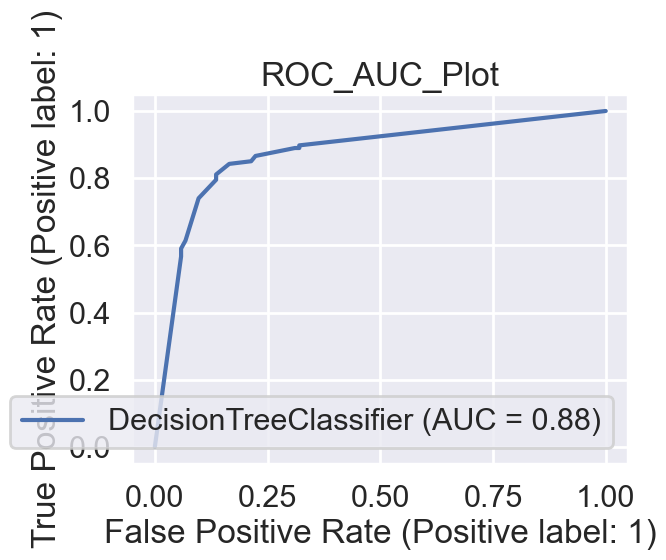

In [188]:
#balanced but no gridsearch hyperparameters applied
model(classifier_dtbalanced)

Accuracy :  83.04%
Cross Validation Score :  85.72%
ROC_AUC Score :  83.45%
Error Rate:  16.96%


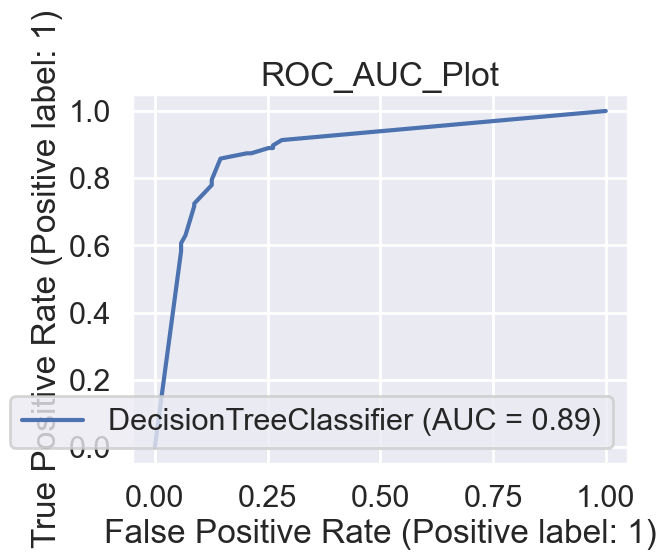

In [189]:
#not balanced and without grid search hyperparameters
model(classifier1)

              precision    recall  f1-score   support

           0       0.78      0.80      0.79       103
           1       0.83      0.82      0.83       127

    accuracy                           0.81       230
   macro avg       0.81      0.81      0.81       230
weighted avg       0.81      0.81      0.81       230



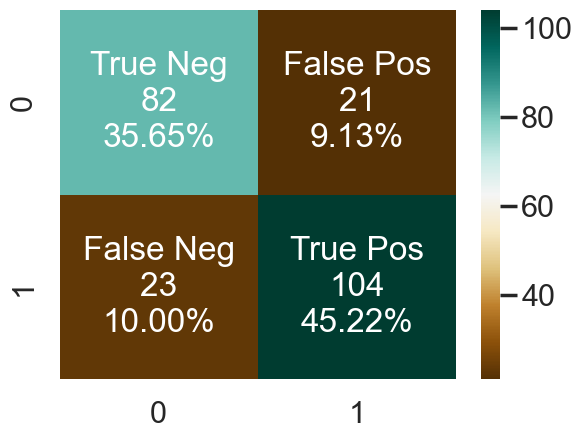

In [190]:
#not balanced but grid search tree applied
model_evaluation(classifier_decisiontree)

              precision    recall  f1-score   support

           0       0.76      0.84      0.80       103
           1       0.86      0.78      0.82       127

    accuracy                           0.81       230
   macro avg       0.81      0.81      0.81       230
weighted avg       0.81      0.81      0.81       230



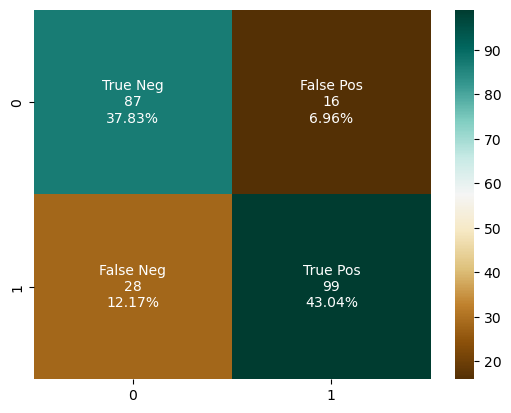

In [145]:
# not balanced and without grid searchtree 
model_evaluation(classifier1)

              precision    recall  f1-score   support

           0       0.78      0.87      0.83       103
           1       0.89      0.80      0.84       127

    accuracy                           0.83       230
   macro avg       0.83      0.84      0.83       230
weighted avg       0.84      0.83      0.84       230



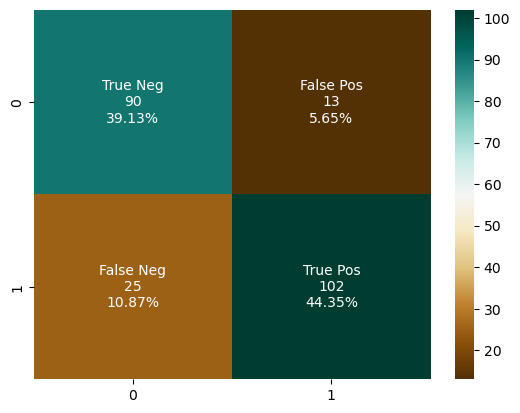

In [146]:
# balanced but not gridsearch applied
model_evaluation(classifier_dtbalanced)

# 3.] Super Vector Machine 

In [198]:
from sklearn.svm import SVC

In [204]:
classifier_svc = SVC(kernel = 'linear',C = 100)

In [206]:
classifier_svcbalanced = SVC(kernel = 'linear',C = 100,class_weight='balanced')

In [201]:
parameter2 ={'C':[1, 10, 100],'gamma':[0.001, 0.0001],'kernel': ['linear','rbf']}

In [217]:
classifier_supervector=GridSearchCV(classifier_svcbalanced,param_grid=parameter2,scoring='accuracy',cv=cv)

In [218]:
classifier_supervector.fit(xtrain,ytrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=SVC(C=100, class_weight='balanced', kernel='linear'),
             param_grid={'C': [1, 10, 100], 'gamma': [0.001, 0.0001],
                         'kernel': ['linear', 'rbf']},
             scoring='accuracy')

In [219]:
print(classifier_supervector.best_params_)

{'C': 100, 'gamma': 0.001, 'kernel': 'rbf'}


In [220]:
##prediction
y_pred2=classifier_supervector.predict(xtest)

In [221]:
print(classifier_supervector.best_score_)

0.8444444444444443


In [222]:
score=accuracy_score(y_pred2,ytest)
error=1-accuracy_score(y_pred1,ytest)
print(score)
print(error)

0.8608695652173913
0.15652173913043477


In [223]:
# imbalanced and via grid search
print(classification_report(y_pred2,ytest))

              precision    recall  f1-score   support

           0       0.89      0.81      0.85       113
           1       0.83      0.91      0.87       117

    accuracy                           0.86       230
   macro avg       0.86      0.86      0.86       230
weighted avg       0.86      0.86      0.86       230



Accuracy :  86.52%
Cross Validation Score :  90.58%
ROC_AUC Score :  86.88%
Error Rate:  13.48%


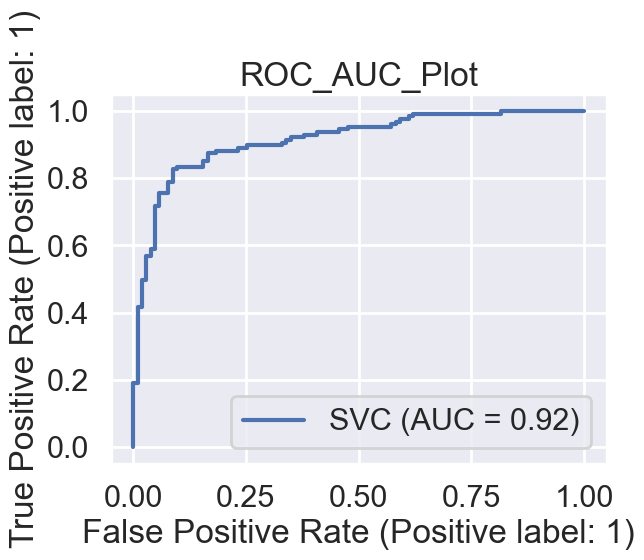

In [224]:
#balanced but no gridsearch hyperparameters applied
model(classifier_svcbalanced)

Accuracy :  85.65%
Cross Validation Score :  90.48%
ROC_AUC Score :  85.82%
Error Rate:  14.35%


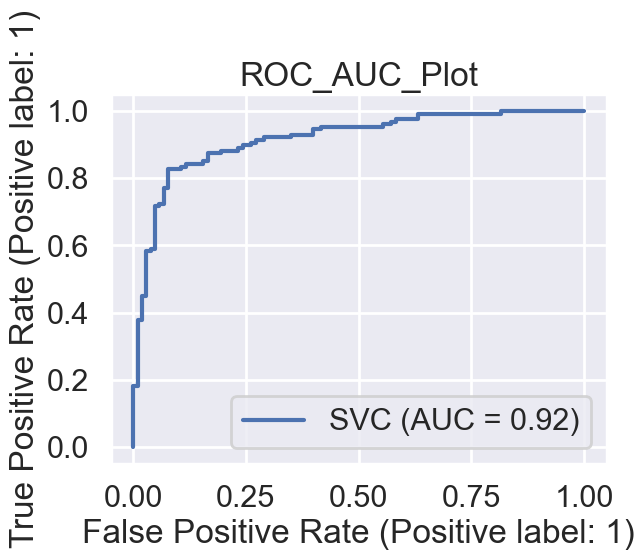

In [208]:
#not balanced and without grid search hyperparameters
model(classifier_svc)

              precision    recall  f1-score   support

           0       0.82      0.90      0.86       103
           1       0.91      0.83      0.87       127

    accuracy                           0.87       230
   macro avg       0.86      0.87      0.86       230
weighted avg       0.87      0.87      0.87       230



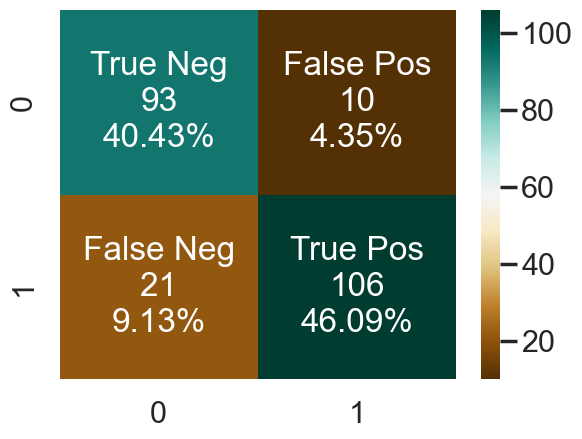

In [209]:
model_evaluation(classifier_svcbalanced)

              precision    recall  f1-score   support

           0       0.82      0.88      0.85       103
           1       0.90      0.84      0.87       127

    accuracy                           0.86       230
   macro avg       0.86      0.86      0.86       230
weighted avg       0.86      0.86      0.86       230



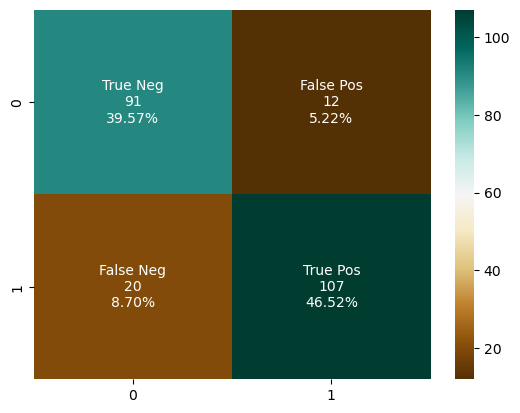

In [162]:
model_evaluation(classifier_svc)

              precision    recall  f1-score   support

           0       0.82      0.87      0.85       103
           1       0.89      0.84      0.87       127

    accuracy                           0.86       230
   macro avg       0.85      0.86      0.86       230
weighted avg       0.86      0.86      0.86       230



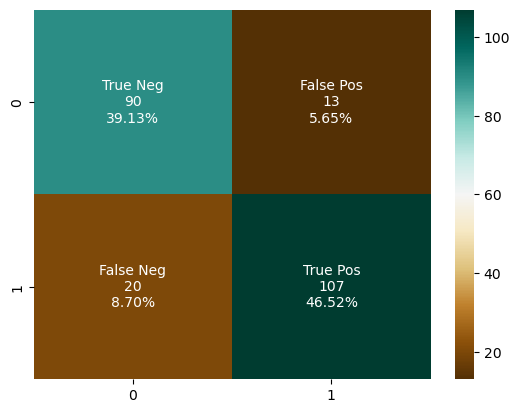

In [163]:
model_evaluation(classifier_supervector)

# 4.] Random Forest Classifier 

In [225]:
from sklearn.ensemble import RandomForestClassifier

In [256]:
classifier_rf = RandomForestClassifier(max_depth = 150,random_state = 20)

In [250]:
classifier_rfbalanced = RandomForestClassifier(max_depth = 100,random_state = 40,class_weight='balanced')

In [228]:
n_estimators=[100]
max_features=['auto','sqrt']
max_depth=[2,4]
min_samples_leaf=[1,2]
bootstrap=[True,False]
min_samples_split=[2,5]

In [229]:
param_grid={'max_features':max_features,'max_depth':max_depth,'min_samples_leaf':min_samples_leaf,'bootstrap':bootstrap,'min_samples_split':min_samples_split}

In [230]:
randomtree=RandomForestClassifier(max_depth=2,n_estimators=100)
randomtree.fit(xtrain,ytrain)

RandomForestClassifier(max_depth=2)

In [258]:
classifier_randomsearch=GridSearchCV(classifier_rfbalanced,param_grid,scoring='accuracy',cv=cv)

In [260]:
classifier_randomsearch.fit(xtrain,ytrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=RandomForestClassifier(class_weight='balanced',
                                              max_depth=100, random_state=40),
             param_grid={'bootstrap': [True, False], 'max_depth': [2, 4],
                         'max_features': ['auto', 'sqrt'],
                         'min_samples_leaf': [1, 2],
                         'min_samples_split': [2, 5]},
             scoring='accuracy')

In [261]:
print(classifier_randomsearch.best_params_)

{'bootstrap': True, 'max_depth': 4, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 5}


In [262]:
##prediction
y_pred2=classifier_randomsearch.predict(xtest)

In [263]:
print(classifier_randomsearch.best_score_)

0.8487851662404091


In [264]:
score=accuracy_score(y_pred2,ytest)
print(score)

0.8478260869565217


In [237]:
# imbalanced and via grid search
print(classification_report(y_pred2,ytest))

              precision    recall  f1-score   support

           0       0.87      0.81      0.84       111
           1       0.83      0.89      0.86       119

    accuracy                           0.85       230
   macro avg       0.85      0.85      0.85       230
weighted avg       0.85      0.85      0.85       230



Accuracy :  88.70%
Cross Validation Score :  91.16%
ROC_AUC Score :  88.66%
Error Rate:  11.30%


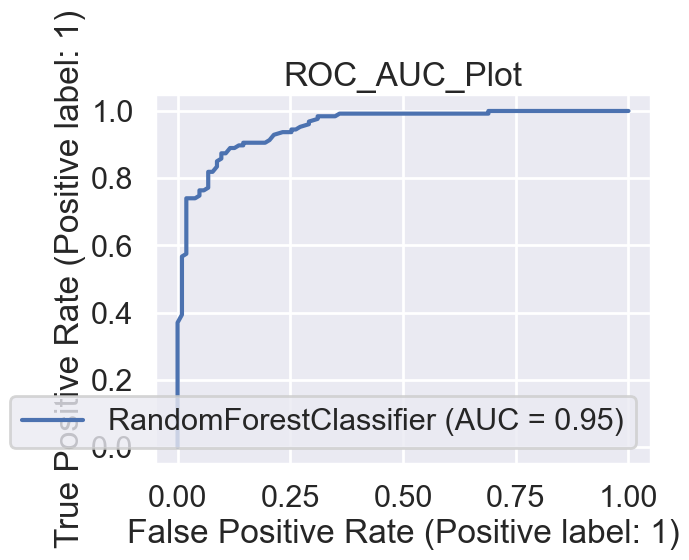

In [251]:
#balanced but no gridsearch hyperparameters applied
model(classifier_rfbalanced)

Accuracy :  87.83%
Cross Validation Score :  91.20%
ROC_AUC Score :  87.88%
Error Rate:  12.17%


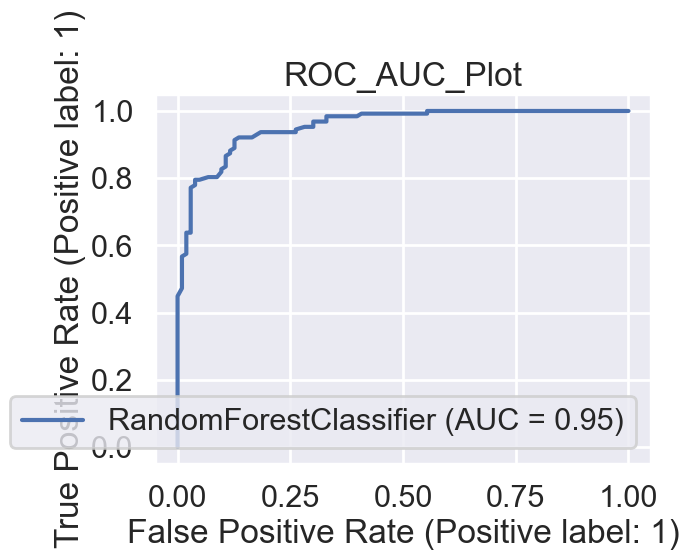

In [257]:
#not balanced and without grid search hyperparameters
model(classifier_rf)

              precision    recall  f1-score   support

           0       0.80      0.89      0.84       103
           1       0.90      0.82      0.86       127

    accuracy                           0.85       230
   macro avg       0.85      0.86      0.85       230
weighted avg       0.86      0.85      0.85       230



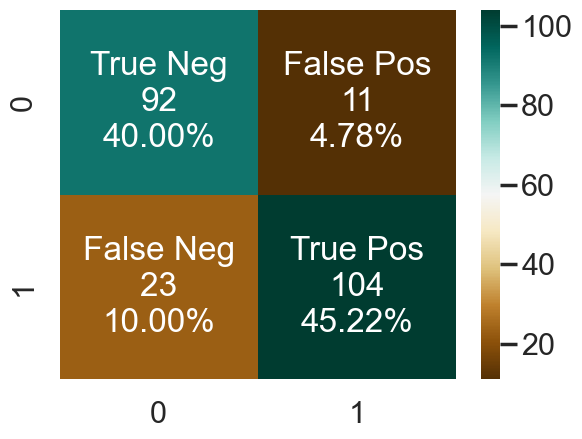

In [240]:
model_evaluation(classifier_rfbalanced)

              precision    recall  f1-score   support

           0       0.81      0.87      0.84       103
           1       0.89      0.83      0.86       127

    accuracy                           0.85       230
   macro avg       0.85      0.85      0.85       230
weighted avg       0.85      0.85      0.85       230



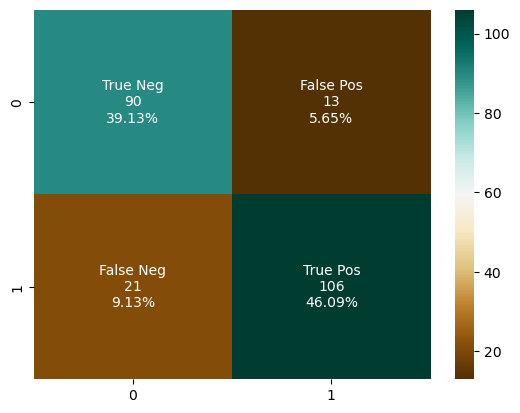

In [103]:
model_evaluation(classifier_rf)

              precision    recall  f1-score   support

           0       0.81      0.87      0.84       103
           1       0.89      0.83      0.86       127

    accuracy                           0.85       230
   macro avg       0.85      0.85      0.85       230
weighted avg       0.85      0.85      0.85       230



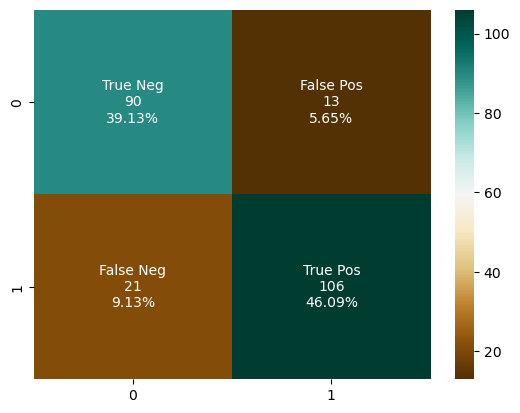

In [104]:
model_evaluation(classifier_randomsearch)

[Text(0.5, 0.8333333333333334, 'X[3] <= 4.959\ngini = 0.491\nsamples = 425\nvalue = [298, 390]'),
 Text(0.25, 0.5, 'X[9] <= 0.85\ngini = 0.5\nsamples = 324\nvalue = [259, 273]'),
 Text(0.125, 0.16666666666666666, 'gini = 0.421\nsamples = 170\nvalue = [197, 85]'),
 Text(0.375, 0.16666666666666666, 'gini = 0.373\nsamples = 154\nvalue = [62, 188]'),
 Text(0.75, 0.5, 'X[1] <= 0.5\ngini = 0.375\nsamples = 101\nvalue = [39, 117]'),
 Text(0.625, 0.16666666666666666, 'gini = 0.497\nsamples = 20\nvalue = [12, 14]'),
 Text(0.875, 0.16666666666666666, 'gini = 0.329\nsamples = 81\nvalue = [27, 103]')]

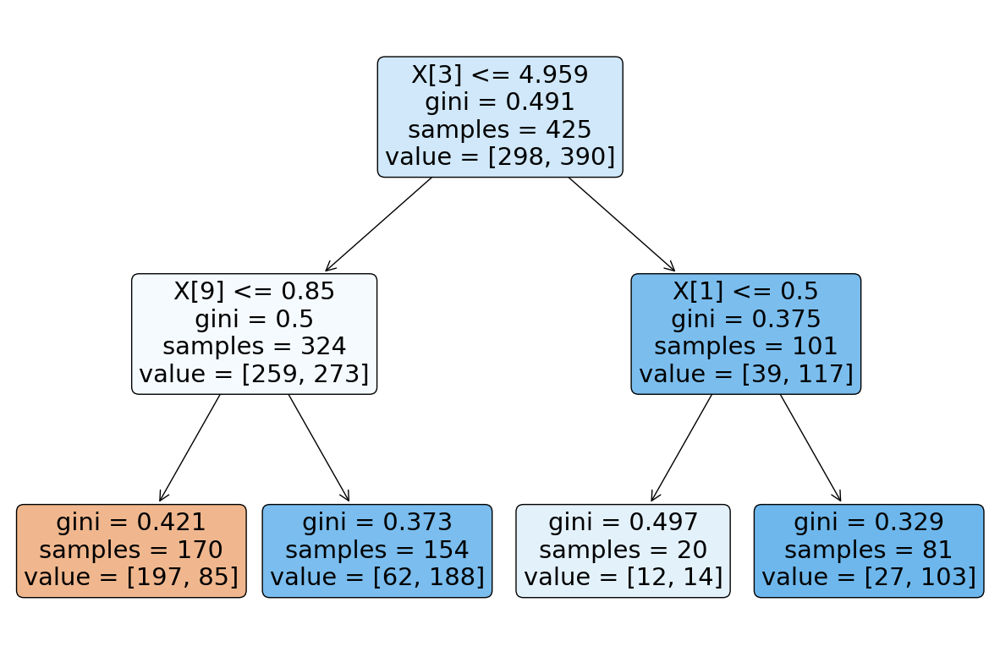

In [105]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

fig = plt.figure(figsize=(15, 10))
plot_tree(randomtree.estimators_[0], filled=True, impurity=True,rounded=True)

In [106]:
fig.savefig('figure_name.png')

# 5.] Naive Bayes

In [265]:
from sklearn.naive_bayes import GaussianNB

In [266]:
classifier_NB = GaussianNB()

In [267]:
classifier_NBbalanced= GaussianNB()

Accuracy :  83.91%
Cross Validation Score :  90.82%
ROC_AUC Score :  84.33%
Error Rate:  16.09%


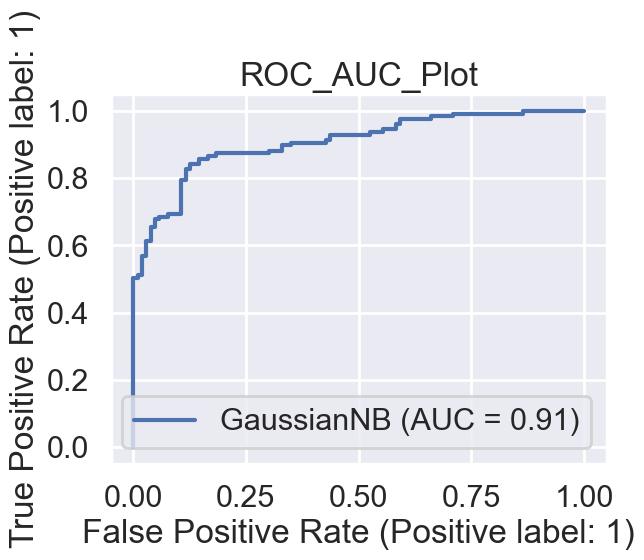

In [268]:
model(classifier_NB)

              precision    recall  f1-score   support

           0       0.78      0.88      0.83       103
           1       0.89      0.80      0.85       127

    accuracy                           0.84       230
   macro avg       0.84      0.84      0.84       230
weighted avg       0.85      0.84      0.84       230



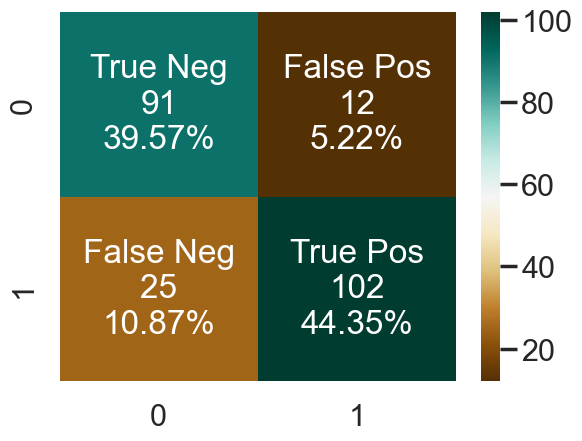

In [269]:
model_evaluation(classifier_NB)

In [270]:
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier

In [291]:
gb = GradientBoostingClassifier(random_state = 1,min_samples_leaf=100,min_samples_split=10)
ab=AdaBoostClassifier()

In [287]:
from scipy.stats import uniform as sp_randFloat
from scipy.stats import randint as sp_randInt

In [294]:
parameters={'learning_rate': [0.1,0.9],
            'subsample':[0.1,0.9],
            'n_estimators':[1,100],
            'max_depth':[3,10],
            'min_samples_split':[50,140],
            'min_samples_leaf':[50,140]
           }

In [295]:
classifier_Gb=GridSearchCV(gb,param_grid=parameters,scoring='accuracy',cv=cv)

In [296]:
classifier_Gb.fit(xtrain,ytrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=GradientBoostingClassifier(min_samples_leaf=100,
                                                  min_samples_split=10,
                                                  random_state=1),
             param_grid={'learning_rate': [0.1, 0.9], 'max_depth': [3, 10],
                         'min_samples_leaf': [50, 140],
                         'min_samples_split': [50, 140],
                         'n_estimators': [1, 100], 'subsample': [0.1, 0.9]},
             scoring='accuracy')

In [297]:
print(classifier_Gb.best_params_)

{'learning_rate': 0.1, 'max_depth': 3, 'min_samples_leaf': 50, 'min_samples_split': 140, 'n_estimators': 100, 'subsample': 0.9}


In [298]:
print(classifier_Gb.best_score_)

0.866247513498153


In [299]:
##prediction
y_pred1=classifier_Gb.predict(xtest)

In [300]:
score=accuracy_score(y_pred1,ytest)
error=1-accuracy_score(y_pred1,ytest)
print("accuracy is ",score)
print("error rate is",error)

accuracy is  0.8782608695652174
error rate is 0.12173913043478257


In [301]:
# imbalanced and via grid search
print(classification_report(y_pred1,ytest))

              precision    recall  f1-score   support

           0       0.88      0.85      0.87       107
           1       0.87      0.90      0.89       123

    accuracy                           0.88       230
   macro avg       0.88      0.88      0.88       230
weighted avg       0.88      0.88      0.88       230



              precision    recall  f1-score   support

           0       0.85      0.88      0.87       103
           1       0.90      0.87      0.89       127

    accuracy                           0.88       230
   macro avg       0.88      0.88      0.88       230
weighted avg       0.88      0.88      0.88       230



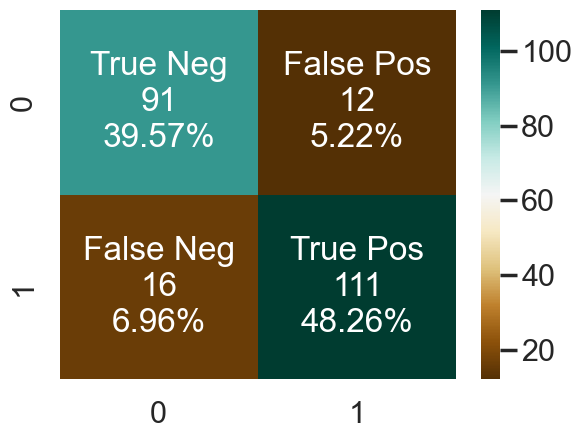

In [302]:
model_evaluation(classifier_Gb)

Accuracy :  88.26%
Cross Validation Score :  91.61%
ROC_AUC Score :  88.36%
Error Rate:  11.74%


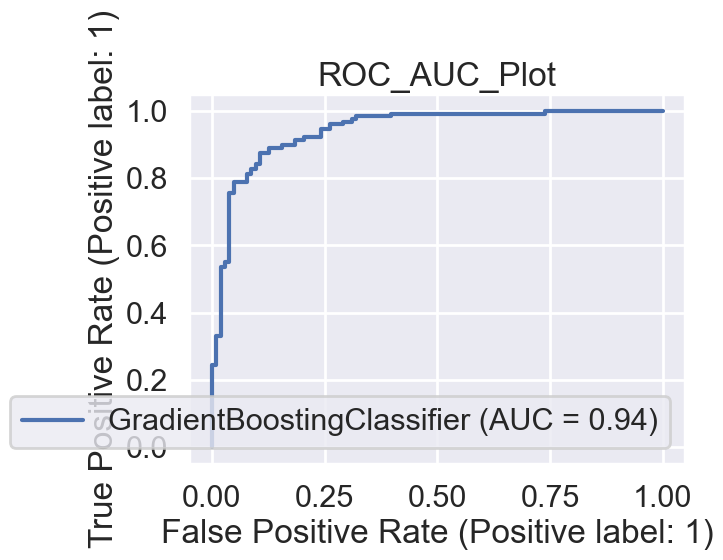

In [303]:
model(gb)

              precision    recall  f1-score   support

           0       0.85      0.89      0.87       103
           1       0.91      0.87      0.89       127

    accuracy                           0.88       230
   macro avg       0.88      0.88      0.88       230
weighted avg       0.88      0.88      0.88       230



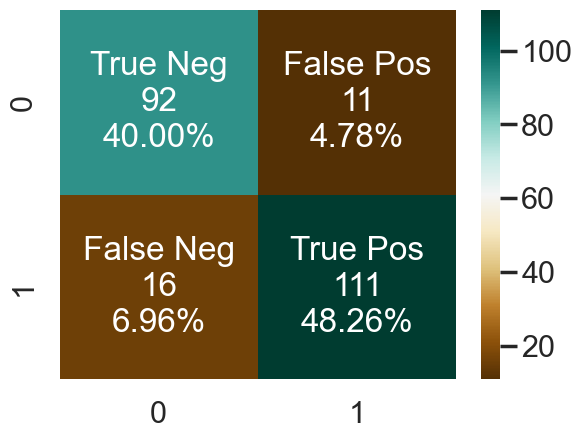

In [304]:
model_evaluation(gb)

# work yet to be done 

1. preparing the model after feature extraction 
2. comparing it with others prepared model outcomes 

In [208]:
!pip install niapy

In [305]:
from sklearn.svm import SVC
from niapy.problems import Problem
from niapy.task import Task
from niapy.algorithms.basic import ParticleSwarmOptimization

In [306]:
X_new=dataset.drop(columns=['HeartDisease'])
y_new=dataset['HeartDisease']

In [307]:
X=X_new.to_numpy()
y=y_new.to_numpy()

In [308]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=1234)

In [309]:
class FeatureSelection(Problem):
    def __init__(self, X_train, y_train, alpha=0.99):
        super().__init__(dimension=X_train.shape[1], lower=0, upper=1)
        self.X_train = X_train
        self.y_train = y_train
       # self.alpha = alpha

    def _evaluate(self, x):
        selected = x > 0.5
        num_selected = selected.sum()
        if num_selected == 0:
            return 1.0
       # accuracy = cross_val_score(SVC(), self.X_train[:, selected], self.y_train, cv=2, n_jobs=-1).mean()
        #score = 1 - accuracy
        num_features = self.X_train.shape[1]
        return num_features
       # return self.alpha * score + (1 - self.alpha) * (num_selected / num_features)

In [310]:
problem = FeatureSelection(X_train, y_train)
task = Task(problem, max_iters=100)
algorithm = ParticleSwarmOptimization( population_size=10, limit=100,seed=1234)
best_features, best_fitness = algorithm.run(task)

In [311]:
dataset_features=dataset.drop(columns=['HeartDisease'])
best_features

array([0.97669977, 0.38019574, 0.92324623, 0.26169242, 0.31909706,
       0.11809123, 0.24176629, 0.31853393, 0.96407925, 0.2636498 ,
       0.44100612])

In [312]:
feature_names=dataset_features.columns.to_numpy() 

In [313]:
selected_features = best_features > 0.5
print('Number of selected features:', selected_features.sum())

print('Selected features:', ', '.join(feature_names[selected_features].tolist()))

print(selected_features)

Number of selected features: 3
Selected features: Age, ChestPainType, ExerciseAngina
[ True False  True False False False False False  True False False]


In [314]:
df=dataset[['Age','ChestPainType','ExerciseAngina','HeartDisease']].copy()

In [315]:
df

,Age,ChestPainType,ExerciseAngina,HeartDisease
0,-1.476257,1,0,0
1,-0.384482,2,0,1
2,-1.895672,1,0,0
3,-0.495409,0,1,1
4,0.138237,2,0,0
...,...,...,...,...
913,-0.842611,3,0,1
914,1.378401,0,0,1
915,0.429106,0,1,1
916,0.429106,1,0,1


# Model Implementation with PSO algorithm

In [316]:
from sklearn.model_selection import train_test_split, GridSearchCV
x = df.drop('HeartDisease', axis = 1)
Y = df['HeartDisease']
Xtrain, Xtest, Ytrain, Ytest = train_test_split(x, Y, test_size = 0.25, stratify = Y, random_state = 0)

In [317]:
def model(classifier):
    
    classifier.fit(Xtrain,Ytrain)
    prediction = classifier.predict(Xtest)
    cv = RepeatedStratifiedKFold(n_splits = 10,n_repeats = 3,random_state = 1)
    print("Accuracy : ",'{0:.2%}'.format(accuracy_score(Ytest,prediction)))
    print("Cross Validation Score : ",'{0:.2%}'.format(cross_val_score(classifier,Xtrain,Ytrain,cv = cv,scoring = 'roc_auc').mean()))
    print("ROC_AUC Score : ",'{0:.2%}'.format(roc_auc_score(Ytest,prediction)))
    plot_roc_curve(classifier, Xtest,Ytest)
    plt.title('ROC_AUC_Plot')
    plt.show()

    
def model_evaluation(classifier):
    
    # Confusion Matrix
    cm = confusion_matrix(Ytest,classifier.predict(Xtest))
    names = ['True Neg','False Pos','False Neg','True Pos']
    counts = [value for value in cm.flatten()]
    percentages = ['{0:.2%}'.format(value) for value in cm.flatten()/np.sum(cm)]
    labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(names,counts,percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sns.heatmap(cm,annot = labels,cmap ='BrBG' ,fmt ='')
    
    # Classification Report
    print(classification_report(Ytest,classifier.predict(Xtest)))



In [349]:
# normal logistic regression
classifier_lrbal= LogisticRegression(random_state =10,C=200,penalty= 'l2',solver='newton-cg',class_weight='balanced')

In [361]:
classifier=LogisticRegression(random_state =1,C=100,penalty= 'l2',solver='newton-cg')

In [362]:
parameter={'penalty':['l1','l2','elasticnet'],'C':[20,30,40,50,100],'max_iter':[100,200,300],'solver':['newton-cg','lbfgs','liblinear']}

In [372]:
classifier_regressor=GridSearchCV(classifier_lrbal,param_grid=parameter,scoring='accuracy',cv=cv)

In [373]:
classifier_regressor.fit(Xtrain,Ytrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=LogisticRegression(C=200, class_weight='balanced',
                                          random_state=10, solver='newton-cg'),
             param_grid={'C': [20, 30, 40, 50, 100],
                         'max_iter': [100, 200, 300],
                         'penalty': ['l1', 'l2', 'elasticnet'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear']},
             scoring='accuracy')

In [374]:
print(classifier_regressor.best_params_)

{'C': 20, 'max_iter': 100, 'penalty': 'l1', 'solver': 'liblinear'}


In [375]:
print(classifier_regressor.best_score_)

0.7799374822392726


In [376]:
##prediction
Y_pred=classifier_regressor.predict(Xtest)

In [377]:
## accuracy score
from sklearn.metrics import accuracy_score,classification_report

In [379]:
score=accuracy_score(Y_pred,Ytest)
print(score)

0.7608695652173914


Accuracy :  77.83%
Cross Validation Score :  83.66%
ROC_AUC Score :  78.09%


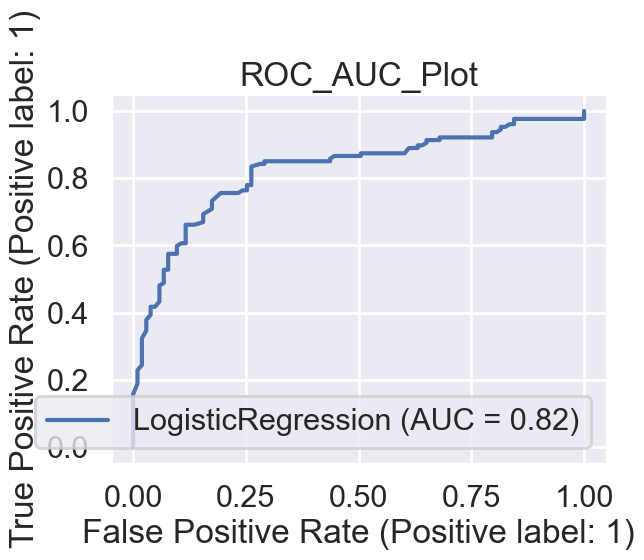

In [380]:
model(classifier)

In [330]:
print(classification_report(Y_pred,Ytest))

              precision    recall  f1-score   support

           0       0.81      0.73      0.76       114
           1       0.76      0.83      0.79       116

    accuracy                           0.78       230
   macro avg       0.78      0.78      0.78       230
weighted avg       0.78      0.78      0.78       230



Accuracy :  76.09%
Cross Validation Score :  83.64%
ROC_AUC Score :  76.88%


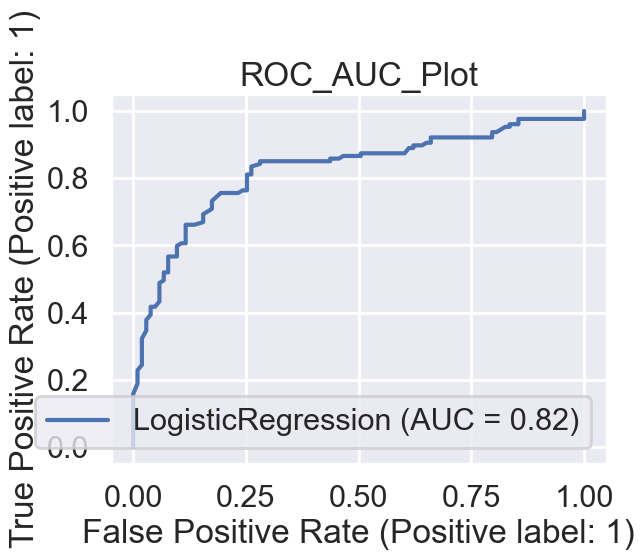

In [350]:
model(classifier_lrbal)

              precision    recall  f1-score   support

           0       0.69      0.84      0.76       103
           1       0.85      0.69      0.76       127

    accuracy                           0.76       230
   macro avg       0.77      0.77      0.76       230
weighted avg       0.78      0.76      0.76       230



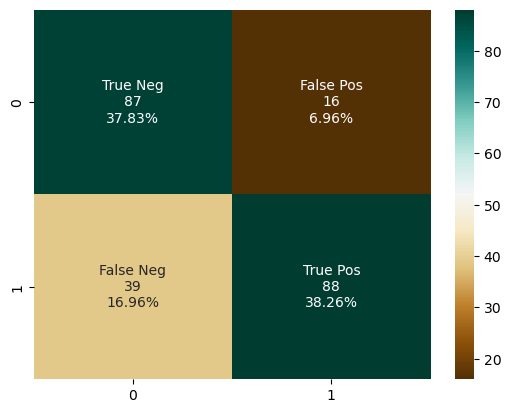

In [209]:
model_evaluation(classifier_lr)

In [427]:
classifier_dt = DecisionTreeClassifier(random_state = 10,max_depth = 100,min_samples_leaf = 50)

In [430]:
classifier_dtbalanced = DecisionTreeClassifier(random_state = 10,max_depth = 200,min_samples_leaf = 50, class_weight='balanced')

In [403]:
classifier1=DecisionTreeClassifier()

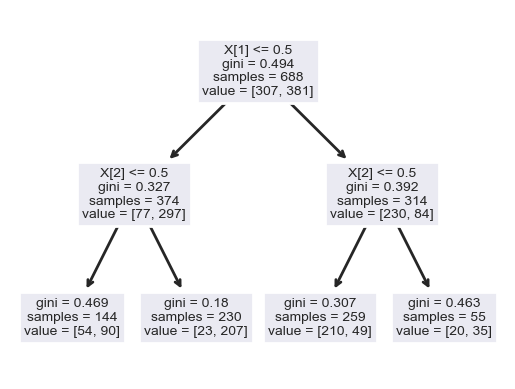

<Figure size 10000x10000 with 0 Axes>

<Figure size 10000x10000 with 0 Axes>

In [573]:
tree=DecisionTreeClassifier(max_depth=2)
tree.fit(Xtrain,Ytrain)
from sklearn.tree import plot_tree
plot_tree(tree,fontsize=10)
plt.show()
plt.figure(figsize=(100,100))

In [583]:
parameter1 ={'criterion':['gini','entropy','log_loss'],'splitter':['best','random'],'max_depth':[5,50,100],'max_features':['auto', 'sqrt', 'log2']}

In [584]:
classifier_decisiontree=GridSearchCV(classifier_dtbalanced,param_grid=parameter1,scoring='accuracy',cv=cv)

In [585]:
classifier_decisiontree.fit(Xtrain,Ytrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              max_depth=200,
                                              min_samples_leaf=50,
                                              random_state=10),
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [5, 50, 100],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'splitter': ['best', 'random']},
             scoring='accuracy')

In [586]:
print(classifier_decisiontree.best_params_)

{'criterion': 'gini', 'max_depth': 5, 'max_features': 'auto', 'splitter': 'random'}


In [587]:
print(classifier_decisiontree.best_score_)

0.7674126172208012


In [588]:
##prediction
y_pred1=classifier_decisiontree.predict(Xtest)

In [589]:
score=accuracy_score(y_pred1,Ytest)
error=1-accuracy_score(y_pred1,Ytest)
print("accuracy is ",score)
print("error rate is",error)

accuracy is  0.7434782608695653
error rate is 0.25652173913043474


In [590]:
# imbalanced and via grid search
print(classification_report(y_pred1,Ytest))

              precision    recall  f1-score   support

           0       0.73      0.71      0.72       106
           1       0.76      0.77      0.76       124

    accuracy                           0.74       230
   macro avg       0.74      0.74      0.74       230
weighted avg       0.74      0.74      0.74       230



Accuracy :  75.65%
Cross Validation Score :  84.66%
ROC_AUC Score :  76.21%


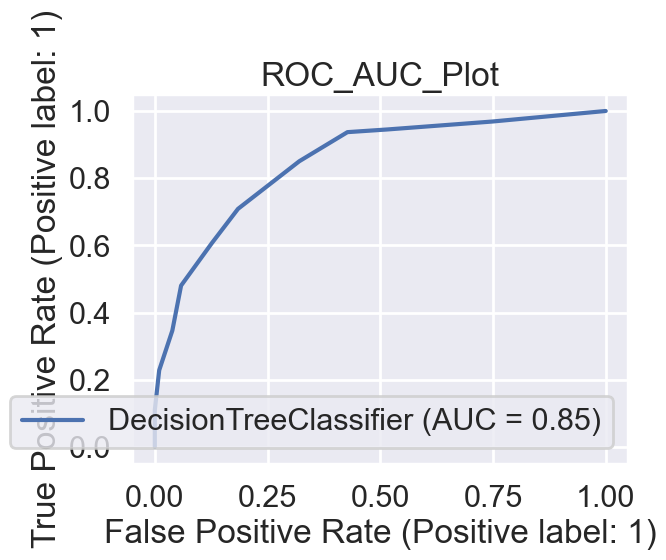

In [582]:
#balanced but no gridsearch hyperparameters applied
model(classifier_dtbalanced)

Accuracy :  77.39%
Cross Validation Score :  84.65%
ROC_AUC Score :  76.50%


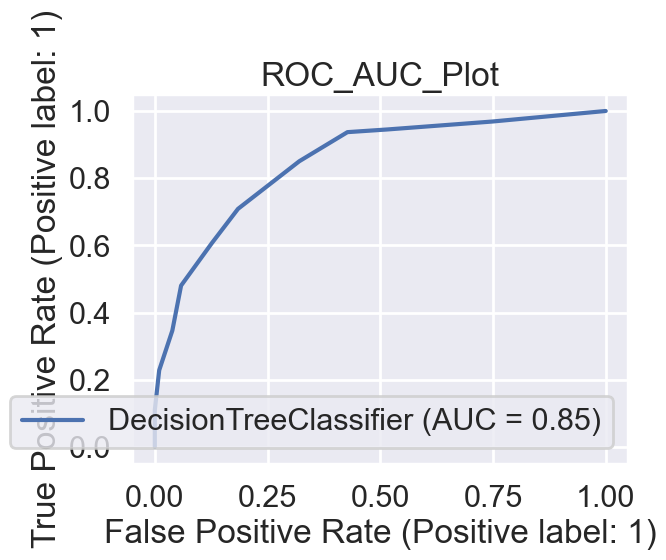

In [442]:
#not balanced and without grid search hyperparameters
model(classifier_dt)

              precision    recall  f1-score   support

           0       0.79      0.68      0.73       103
           1       0.77      0.85      0.81       127

    accuracy                           0.77       230
   macro avg       0.78      0.77      0.77       230
weighted avg       0.78      0.77      0.77       230



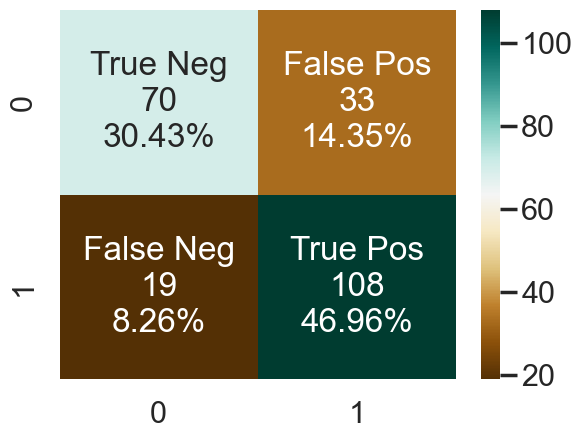

In [443]:
#not balanced but grid search tree applied
model_evaluation(classifier_decisiontree)

              precision    recall  f1-score   support

           0       0.65      0.75      0.70       103
           1       0.77      0.68      0.72       127

    accuracy                           0.71       230
   macro avg       0.71      0.71      0.71       230
weighted avg       0.72      0.71      0.71       230



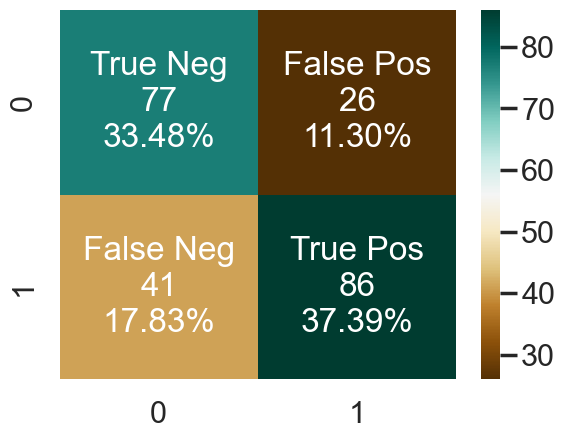

In [444]:
# not balanced and without grid searchtree 
model_evaluation(classifier1)

Accuracy :  77.39%
Cross Validation Score :  84.65%
ROC_AUC Score :  76.50%


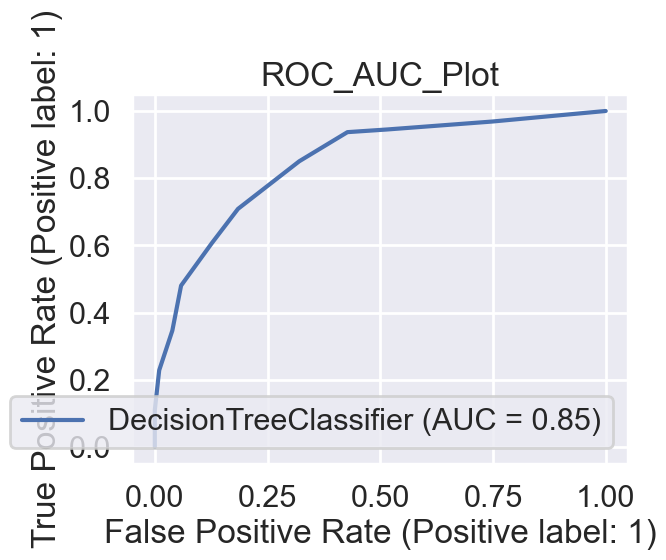

In [445]:
model(classifier_dt)

              precision    recall  f1-score   support

           0       0.79      0.68      0.73       103
           1       0.77      0.85      0.81       127

    accuracy                           0.77       230
   macro avg       0.78      0.77      0.77       230
weighted avg       0.78      0.77      0.77       230



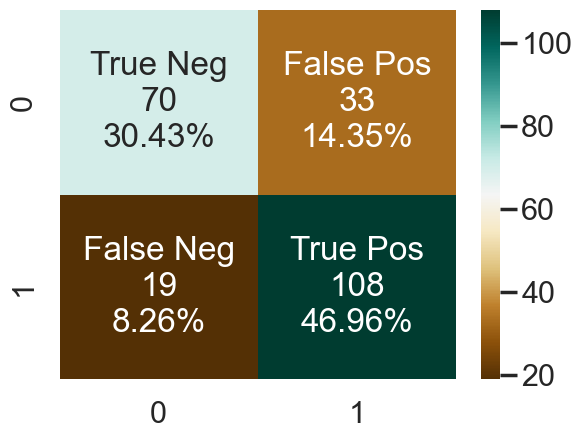

In [446]:
model_evaluation(classifier_dt)

In [478]:
classifier_svc = SVC()

In [448]:
classifier_svcbalanced = SVC(kernel = 'linear',C = 100,class_weight='balanced')

In [480]:
parameter2 ={'C':[150, 50, 100,200,250],'gamma':[0.001, 0.0001],'kernel': ['linear','rbf']}

In [487]:
classifier_supervector=GridSearchCV(classifier_svcbalanced,param_grid=parameter2,scoring='accuracy',cv=cv)

In [488]:
classifier_supervector.fit(Xtrain,Ytrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=SVC(C=100, class_weight='balanced', kernel='linear'),
             param_grid={'C': [150, 50, 100, 200, 250],
                         'gamma': [0.001, 0.0001],
                         'kernel': ['linear', 'rbf']},
             scoring='accuracy')

In [489]:
print(classifier_supervector.best_params_)

{'C': 50, 'gamma': 0.0001, 'kernel': 'rbf'}


In [490]:
##prediction
y_pred2=classifier_supervector.predict(Xtest)

In [491]:
print(classifier_supervector.best_score_)

0.765949133276499


In [492]:
score=accuracy_score(y_pred2,Ytest)
error=1-accuracy_score(y_pred2,Ytest)
print(score)
print(error)

0.7521739130434782
0.24782608695652175


In [467]:
# imbalanced and via grid search
print(classification_report(y_pred2,Ytest))

              precision    recall  f1-score   support

           0       0.83      0.69      0.75       123
           1       0.70      0.83      0.76       107

    accuracy                           0.76       230
   macro avg       0.76      0.76      0.76       230
weighted avg       0.77      0.76      0.76       230



Accuracy :  71.74%
Cross Validation Score :  83.28%
ROC_AUC Score :  73.31%


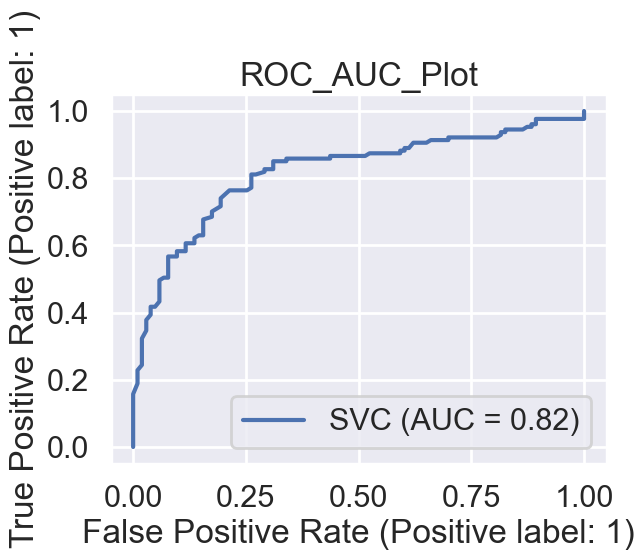

In [493]:
#balanced but no gridsearch hyperparameters applied
model(classifier_svcbalanced)

              precision    recall  f1-score   support

           0       0.63      0.88      0.74       103
           1       0.86      0.58      0.69       127

    accuracy                           0.72       230
   macro avg       0.75      0.73      0.72       230
weighted avg       0.76      0.72      0.71       230



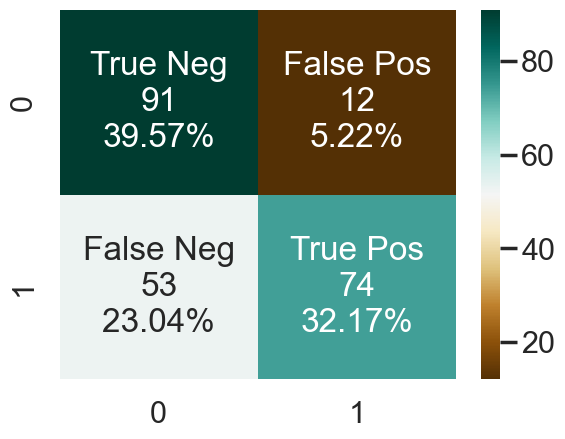

In [473]:
model_evaluation(classifier_svcbalanced)

Accuracy :  77.83%
Cross Validation Score :  81.99%
ROC_AUC Score :  77.08%


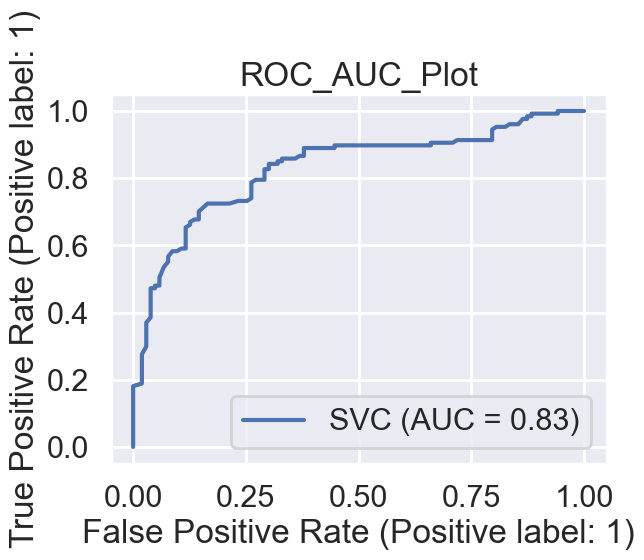

In [479]:
model(classifier_svc)

              precision    recall  f1-score   support

           0       0.63      0.88      0.74       103
           1       0.86      0.58      0.69       127

    accuracy                           0.72       230
   macro avg       0.75      0.73      0.72       230
weighted avg       0.76      0.72      0.71       230



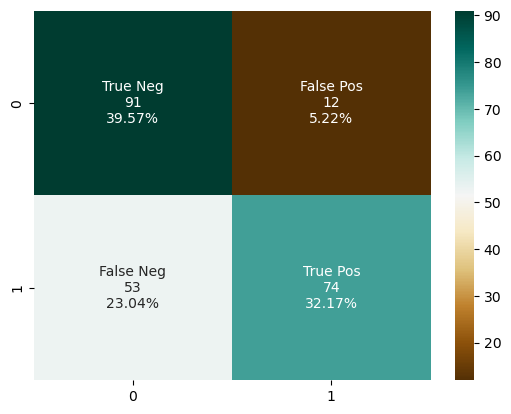

In [215]:
model_evaluation(classifier_svc)

In [529]:
classifier_rf = RandomForestClassifier(max_depth = 4,random_state = 77,min_samples_leaf=50)

In [543]:
classifier_rfbalanced = RandomForestClassifier(max_depth = 4,class_weight='balanced',min_samples_leaf=50)

In [550]:
n_estimators=[100]
max_features=['auto','sqrt']
max_depth=[2,4]
min_samples_leaf=[1,2]
bootstrap=[True,False]
min_samples_split=[2,5]

In [551]:
param_grid={'max_features':max_features,'max_depth':max_depth,'min_samples_leaf':min_samples_leaf,'bootstrap':bootstrap,'min_samples_split':min_samples_split}

In [552]:
randomtree=RandomForestClassifier(max_depth=2,n_estimators=100)
randomtree.fit(Xtrain,Ytrain)

RandomForestClassifier(max_depth=2)

In [591]:
classifier_randomsearch=GridSearchCV(classifier_rfbalanced,param_grid,scoring='accuracy',cv=cv)

In [592]:
classifier_randomsearch.fit(Xtrain,Ytrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=RandomForestClassifier(class_weight='balanced',
                                              max_depth=4,
                                              min_samples_leaf=50),
             param_grid={'bootstrap': [True, False], 'max_depth': [2, 4],
                         'max_features': ['auto', 'sqrt'],
                         'min_samples_leaf': [1, 2],
                         'min_samples_split': [2, 5]},
             scoring='accuracy')

In [593]:
print(classifier_randomsearch.best_params_)

{'bootstrap': True, 'max_depth': 2, 'max_features': 'auto', 'min_samples_leaf': 2, 'min_samples_split': 5}


In [594]:
##prediction
y_pred2=classifier_randomsearch.predict(Xtest)

In [595]:
print(classifier_randomsearch.best_score_)

0.7915885194657573


In [596]:
score=accuracy_score(y_pred1,Ytest)
error=1-accuracy_score(y_pred1,Ytest)
print("accuracy is ",score)
print("error rate is",error)

accuracy is  0.7434782608695653
error rate is 0.25652173913043474


In [505]:
# imbalanced and via grid search
print(classification_report(y_pred1,Ytest))

              precision    recall  f1-score   support

           0       0.68      0.79      0.73        89
           1       0.85      0.77      0.81       141

    accuracy                           0.77       230
   macro avg       0.77      0.78      0.77       230
weighted avg       0.78      0.77      0.78       230



Accuracy :  76.52%
Cross Validation Score :  86.23%
ROC_AUC Score :  76.45%


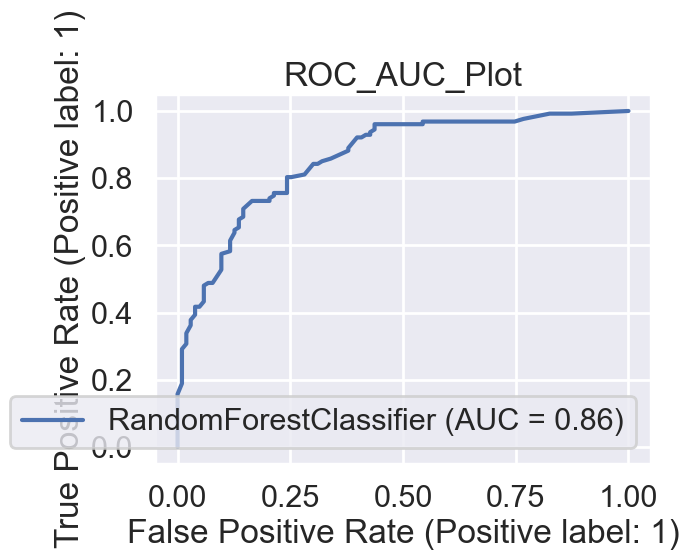

In [545]:
#balanced but no gridsearch hyperparameters applied
model(classifier_rfbalanced)

              precision    recall  f1-score   support

           0       0.73      0.76      0.74       103
           1       0.80      0.77      0.78       127

    accuracy                           0.77       230
   macro avg       0.76      0.76      0.76       230
weighted avg       0.77      0.77      0.77       230



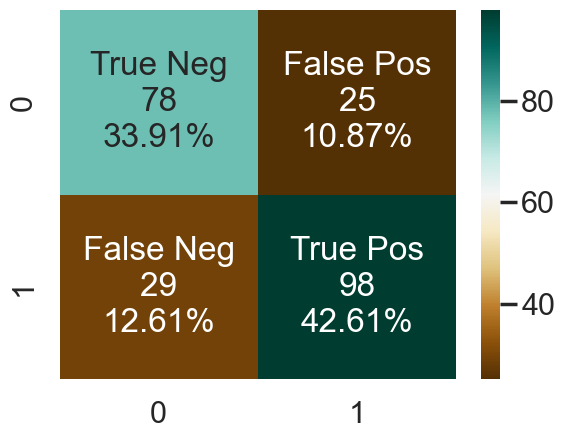

In [546]:
model_evaluation(classifier_rfbalanced)

              precision    recall  f1-score   support

           0       0.74      0.76      0.75       103
           1       0.80      0.78      0.79       127

    accuracy                           0.77       230
   macro avg       0.77      0.77      0.77       230
weighted avg       0.77      0.77      0.77       230



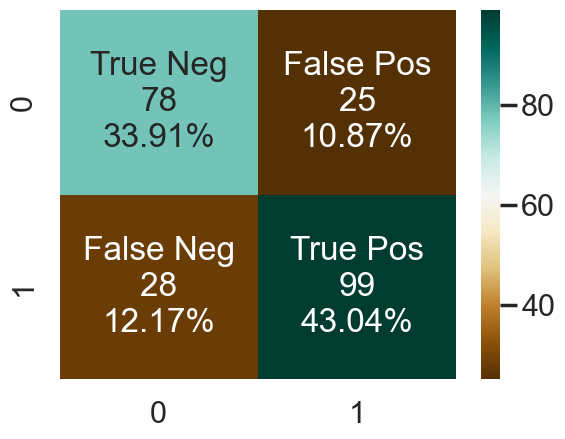

In [547]:
model_evaluation(classifier_randomsearch)

Accuracy :  78.26%
Cross Validation Score :  85.76%
ROC_AUC Score :  78.02%


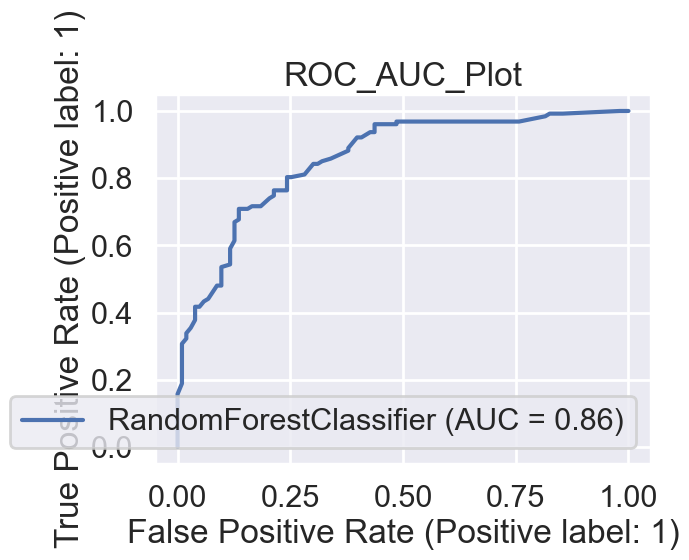

In [548]:
model(classifier_rf)

              precision    recall  f1-score   support

           0       0.76      0.76      0.76       103
           1       0.80      0.80      0.80       127

    accuracy                           0.78       230
   macro avg       0.78      0.78      0.78       230
weighted avg       0.78      0.78      0.78       230



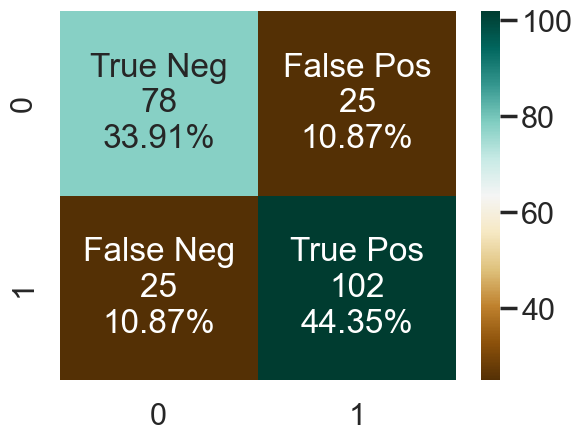

In [549]:
model_evaluation(classifier_rf)

[Text(0.5, 0.8333333333333334, 'X[0] <= -0.783\ngini = 0.498\nsamples = 445\nvalue = [320, 368]'),
 Text(0.25, 0.5, 'X[1] <= 0.5\ngini = 0.392\nsamples = 95\nvalue = [115, 42]'),
 Text(0.125, 0.16666666666666666, 'gini = 0.472\nsamples = 36\nvalue = [24, 39]'),
 Text(0.375, 0.16666666666666666, 'gini = 0.062\nsamples = 59\nvalue = [91, 3]'),
 Text(0.75, 0.5, 'X[2] <= 0.5\ngini = 0.474\nsamples = 350\nvalue = [205, 326]'),
 Text(0.625, 0.16666666666666666, 'gini = 0.486\nsamples = 185\nvalue = [168, 120]'),
 Text(0.875, 0.16666666666666666, 'gini = 0.258\nsamples = 165\nvalue = [37, 206]')]

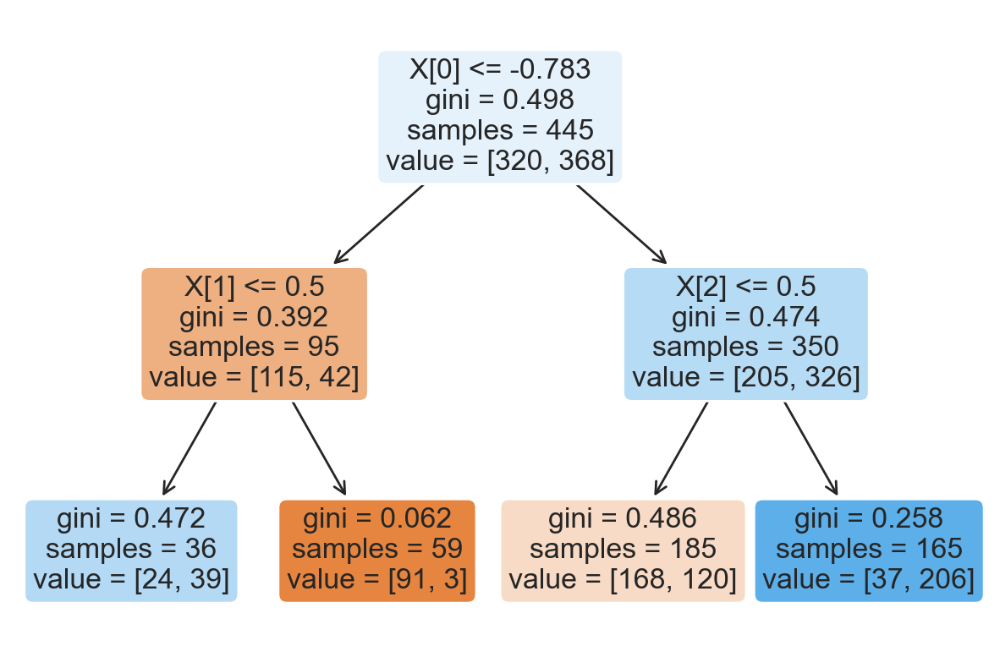

In [511]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

fig = plt.figure(figsize=(15, 10))
plot_tree(randomtree.estimators_[0], filled=True, impurity=True,rounded=True)

In [597]:
classifier_NB = GaussianNB()

Accuracy :  77.39%
Cross Validation Score :  83.34%
ROC_AUC Score :  77.60%


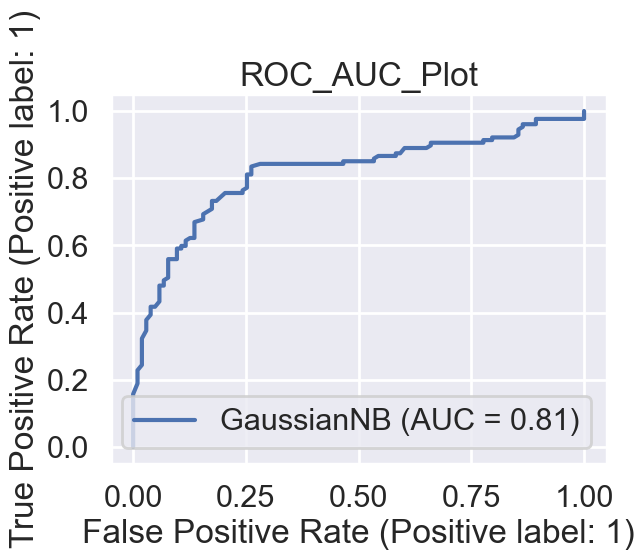

In [598]:
model(classifier_NB)

              precision    recall  f1-score   support

           0       0.73      0.80      0.76       103
           1       0.82      0.76      0.79       127

    accuracy                           0.77       230
   macro avg       0.77      0.78      0.77       230
weighted avg       0.78      0.77      0.77       230



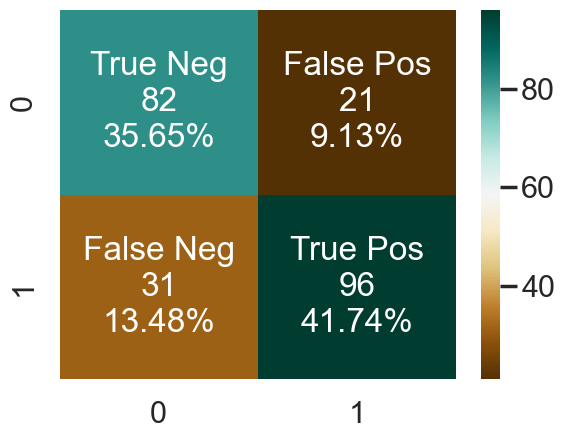

In [514]:
model_evaluation(classifier_NB)

In [599]:
gb = GradientBoostingClassifier(random_state = 1)

In [600]:
from scipy.stats import uniform as sp_randFloat
from scipy.stats import randint as sp_randInt

In [601]:
parameters={'learning_rate': [0.1,0.9],
            'subsample':[0.1,0.9],
            'n_estimators':[1,100],
            'max_depth':[3,10],
            'min_samples_split':[50,140],
            'min_samples_leaf':[50,140]
           }

In [602]:
classifier_Gb=GridSearchCV(gb,param_grid=parameters,scoring='accuracy',cv=cv)

In [603]:
classifier_Gb.fit(Xtrain,Ytrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=GradientBoostingClassifier(random_state=1),
             param_grid={'learning_rate': [0.1, 0.9], 'max_depth': [3, 10],
                         'min_samples_leaf': [50, 140],
                         'min_samples_split': [50, 140],
                         'n_estimators': [1, 100], 'subsample': [0.1, 0.9]},
             scoring='accuracy')

In [604]:
print(classifier_Gb.best_params_)

{'learning_rate': 0.1, 'max_depth': 3, 'min_samples_leaf': 50, 'min_samples_split': 50, 'n_estimators': 100, 'subsample': 0.9}


In [605]:
print(classifier_Gb.best_score_)

0.7920787155441888


In [609]:
##prediction
y_pred1=classifier_Gb.predict(Xtest)

In [611]:
score=accuracy_score(y_pred1,Ytest)
error=1-accuracy_score(y_pred1,Ytest)
print("accuracy is ",score)
print("error rate is",error)

accuracy is  0.7478260869565218
error rate is 0.25217391304347825


In [613]:
# imbalanced and via grid search
print(classification_report(y_pred1,Ytest))

              precision    recall  f1-score   support

           0       0.77      0.70      0.73       113
           1       0.73      0.79      0.76       117

    accuracy                           0.75       230
   macro avg       0.75      0.75      0.75       230
weighted avg       0.75      0.75      0.75       230



              precision    recall  f1-score   support

           0       0.70      0.77      0.73       103
           1       0.79      0.73      0.76       127

    accuracy                           0.75       230
   macro avg       0.75      0.75      0.75       230
weighted avg       0.75      0.75      0.75       230



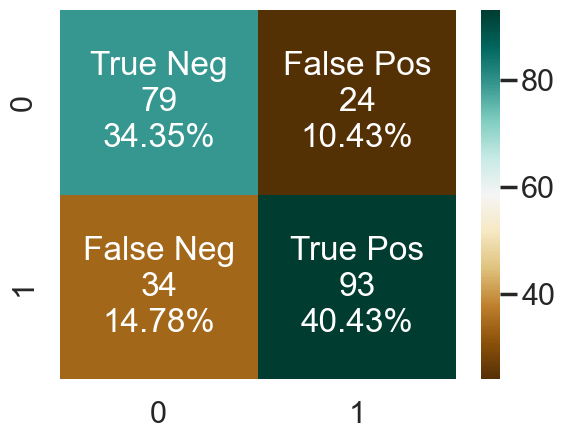

In [614]:
model_evaluation(classifier_Gb)

Accuracy :  75.22%
Cross Validation Score :  85.11%
ROC_AUC Score :  74.72%


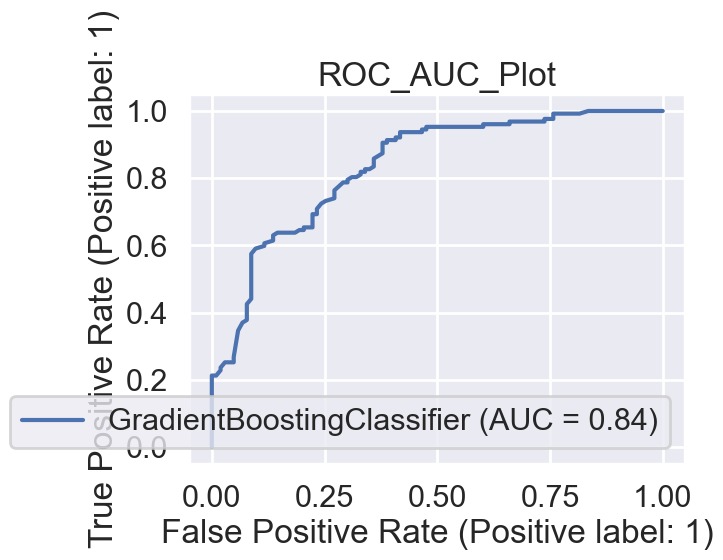

In [615]:
model(gb)

              precision    recall  f1-score   support

           0       0.73      0.70      0.72       103
           1       0.77      0.80      0.78       127

    accuracy                           0.75       230
   macro avg       0.75      0.75      0.75       230
weighted avg       0.75      0.75      0.75       230



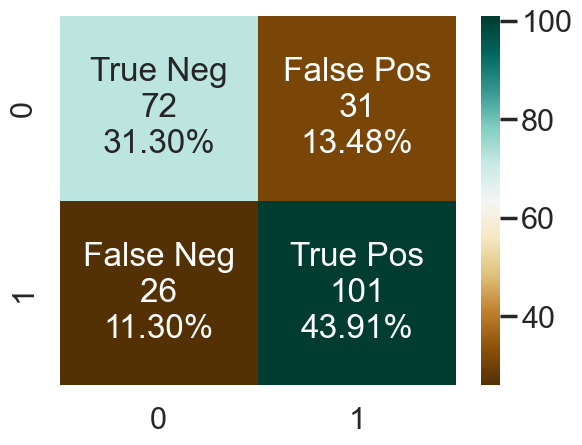

In [616]:
model_evaluation(gb)

This is a common way to think that seems to follow the following logic.

Including many features gives the model considerable flexibility.

That flexibility puts us at risk of overfitting and achieving pitiful generalizability that keeps models from making useful predictions on new data (when we’re truly interested in the predictions).

Therefore, reduce the feature count to reduce the overfitting potential.

It is true that reducing the feature count helps quell overfitting concerns. However, leaving out features deprives the model of the unique information contained in that feature, information that might be a critical determinant of the outcome. Thus, while your feature selection probably quells overfitting concerns, it does so at the risk of introducing underfitting concerns.

You seem to have underfit your data by depriving the model of useful features for making predictions, leading to the decrease in accuracy (setting aside the known issues with accuracy). Because this can happen, not every statistician is such a fan of feature selection.

# Model creation with chi square and Anova selected features 

In [617]:
data=dataset[['Age','ChestPainType','ExerciseAngina','ST_Slope','HeartDisease','Oldpeak','MaxHR','Age']].copy()

In [618]:
from sklearn.model_selection import train_test_split, GridSearchCV
xx = data.drop('HeartDisease', axis = 1)
YY = data['HeartDisease']
XXtrain, XXtest, YYtrain, YYtest = train_test_split(xx, YY, test_size = 0.25, stratify = YY, random_state = 0)

In [619]:
def model(classifier):
    
    classifier.fit(XXtrain,YYtrain)
    prediction = classifier.predict(XXtest)
    cv = RepeatedStratifiedKFold(n_splits = 10,n_repeats = 3,random_state = 1)
    print("Accuracy : ",'{0:.2%}'.format(accuracy_score(YYtest,prediction)))
    print("Cross Validation Score : ",'{0:.2%}'.format(cross_val_score(classifier,XXtrain,YYtrain,cv = cv,scoring = 'roc_auc').mean()))
    print("ROC_AUC Score : ",'{0:.2%}'.format(roc_auc_score(YYtest,prediction)))
    plot_roc_curve(classifier, XXtest,YYtest)
    plt.title('ROC_AUC_Plot')
    plt.show()

    
def model_evaluation(classifier):
    
    # Confusion Matrix
    cm = confusion_matrix(YYtest,classifier.predict(XXtest))
    names = ['True Neg','False Pos','False Neg','True Pos']
    counts = [value for value in cm.flatten()]
    percentages = ['{0:.2%}'.format(value) for value in cm.flatten()/np.sum(cm)]
    labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(names,counts,percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sns.heatmap(cm,annot = labels,cmap ='BrBG' ,fmt ='')
    
    # Classification Report
    print(classification_report(YYtest,classifier.predict(XXtest)))



In [716]:
# normal logistic regression
classifier_lr = LogisticRegression(random_state = 50,C=100,penalty= 'l2',solver='newton-cg',class_weight='balanced')

In [717]:
# Classification for GridSearchCV
classifier=LogisticRegression()

In [718]:
parameter={'penalty':['l1','l2','elasticnet'],'C':[100,150,30,40,50],'max_iter':[100,200,300],'solver':['newton-cg','lbfgs','liblinear']}

In [719]:
classifier_regressor=GridSearchCV(classifier_lr,param_grid=parameter,scoring='accuracy',cv=cv)

In [720]:
classifier_regressor.fit(XXtrain,YYtrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=LogisticRegression(C=100, class_weight='balanced',
                                          random_state=50, solver='newton-cg'),
             param_grid={'C': [100, 150, 30, 40, 50],
                         'max_iter': [100, 200, 300],
                         'penalty': ['l1', 'l2', 'elasticnet'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear']},
             scoring='accuracy')

In [721]:
print(classifier_regressor.best_params_)

{'C': 100, 'max_iter': 100, 'penalty': 'l1', 'solver': 'liblinear'}


In [722]:
print(classifier_regressor.best_score_)

0.8120133560670644


In [723]:
##prediction
y_pred=classifier_regressor.predict(XXtest)

In [726]:
score=accuracy_score(y_pred1,YYtest)
error=1-accuracy_score(y_pred1,YYtest)
print("accuracy is ",score)
print("error rate is",error)

accuracy is  0.8260869565217391
error rate is 0.17391304347826086


In [729]:
# imbalanced and via grid search
print(classification_report(y_pred,YYtest))

              precision    recall  f1-score   support

           0       0.87      0.74      0.80       121
           1       0.76      0.88      0.81       109

    accuracy                           0.81       230
   macro avg       0.81      0.81      0.81       230
weighted avg       0.82      0.81      0.81       230



Accuracy :  81.30%
Cross Validation Score :  89.00%
ROC_AUC Score :  81.97%


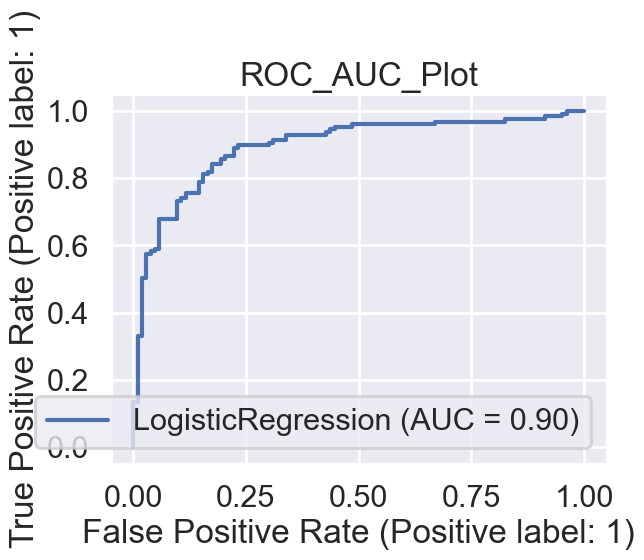

In [728]:
# balanced but without GridSearchCV hyperparameters
model(classifier_lr)

              precision    recall  f1-score   support

           0       0.74      0.88      0.81       103
           1       0.89      0.75      0.81       127

    accuracy                           0.81       230
   macro avg       0.81      0.82      0.81       230
weighted avg       0.82      0.81      0.81       230



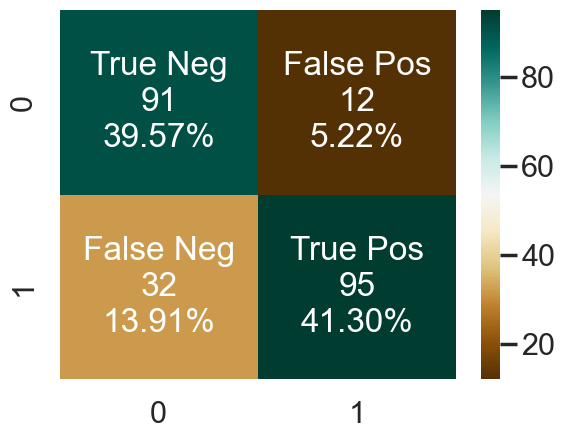

In [632]:
#Report generated after classifier without gridsearchcv 
model_evaluation(classifier_lr)

Accuracy :  82.17%
Cross Validation Score :  88.93%
ROC_AUC Score :  82.67%


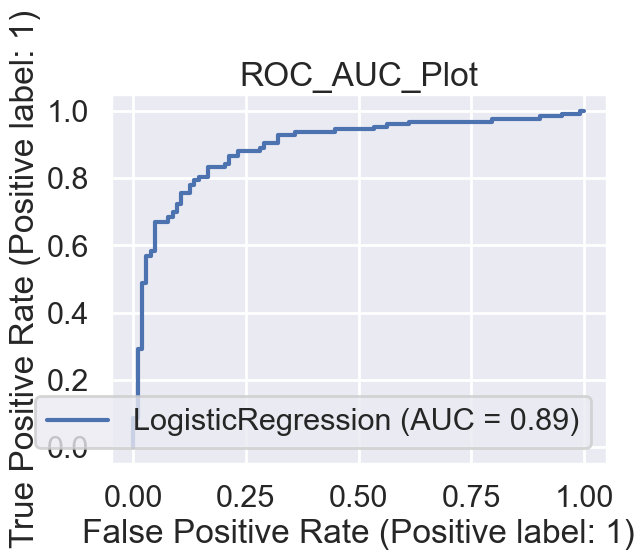

In [730]:
model(classifier)

              precision    recall  f1-score   support

           0       0.76      0.87      0.81       103
           1       0.88      0.78      0.83       127

    accuracy                           0.82       230
   macro avg       0.82      0.83      0.82       230
weighted avg       0.83      0.82      0.82       230



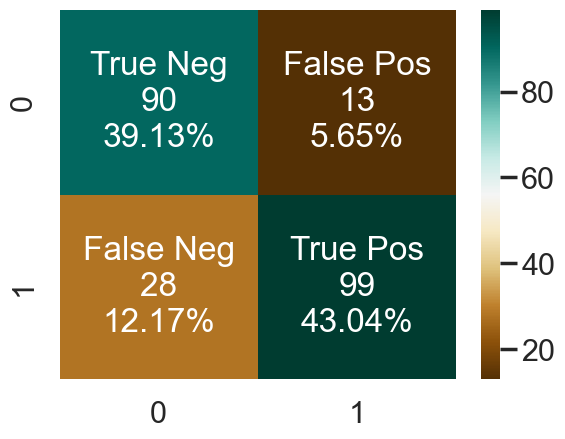

In [731]:
model_evaluation(classifier)

In [737]:
classifier_dt = DecisionTreeClassifier(random_state = 1000,max_depth =10,min_samples_leaf = 1)

In [741]:
classifier_dtbalanced = DecisionTreeClassifier(random_state = 1000,max_depth = 4,min_samples_leaf = 1, class_weight='balanced')

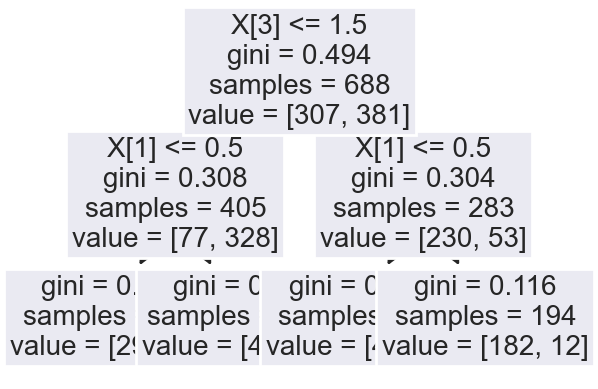

<Figure size 10000x10000 with 0 Axes>

<Figure size 10000x10000 with 0 Axes>

In [678]:
tree=DecisionTreeClassifier(max_depth=2)
tree.fit(XXtrain,YYtrain)
from sklearn.tree import plot_tree
plot_tree(tree,fontsize=20)
plt.show()
plt.figure(figsize=(100,100))

In [639]:
parameter1 ={'criterion':['gini','entropy','log_loss'],'splitter':['best','random'],'max_depth':[1,2,3,4,5],'max_features':['auto', 'sqrt', 'log2']}

In [752]:
classifier_decisiontree=GridSearchCV(classifier_dtbalanced,param_grid=parameter1,scoring='accuracy',cv=cv)

In [753]:
classifier_decisiontree.fit(XXtrain,YYtrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              max_depth=4, random_state=1000),
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [1, 2, 3, 4, 5],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'splitter': ['best', 'random']},
             scoring='accuracy')

In [754]:
print(classifier_decisiontree.best_params_)

{'criterion': 'gini', 'max_depth': 5, 'max_features': 'auto', 'splitter': 'random'}


In [755]:
print(classifier_decisiontree.best_score_)

0.8245595339585111


In [756]:
##prediction
y_pred1=classifier_decisiontree.predict(XXtest)

In [757]:
score=accuracy_score(y_pred1,YYtest)
error=1-accuracy_score(y_pred1,YYtest)
print("accuracy is ",score)
print("error rate is",error)

accuracy is  0.8043478260869565
error rate is 0.19565217391304346


In [758]:
# imbalanced and via grid search
print(classification_report(y_pred1,ytest))

              precision    recall  f1-score   support

           0       0.87      0.74      0.80       122
           1       0.75      0.88      0.81       108

    accuracy                           0.80       230
   macro avg       0.81      0.81      0.80       230
weighted avg       0.81      0.80      0.80       230



Accuracy :  82.61%
Cross Validation Score :  87.71%
ROC_AUC Score :  82.97%


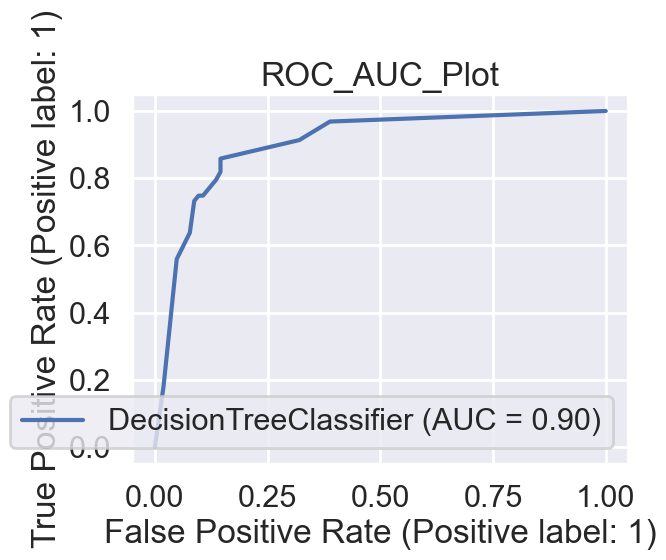

In [751]:
#balanced but no gridsearch hyperparameters applied
model(classifier_dtbalanced)

Accuracy :  81.30%
Cross Validation Score :  76.83%
ROC_AUC Score :  81.05%


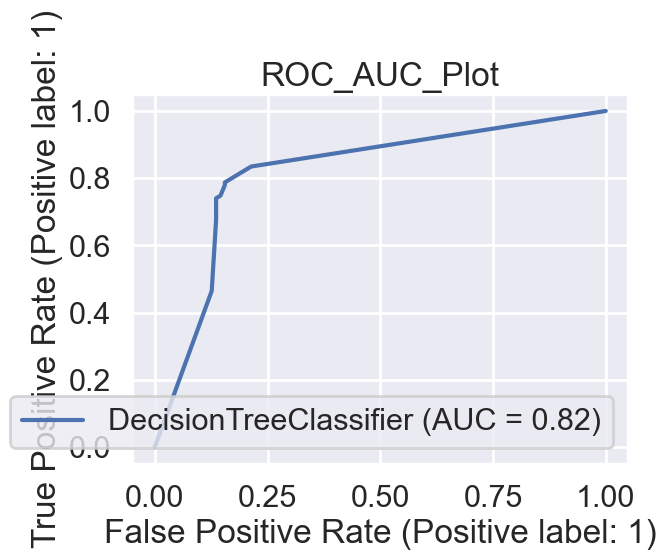

In [760]:
#not balanced and without grid search hyperparameters
model(classifier_dt)

              precision    recall  f1-score   support

           0       0.74      0.87      0.80       103
           1       0.88      0.75      0.81       127

    accuracy                           0.80       230
   macro avg       0.81      0.81      0.80       230
weighted avg       0.82      0.80      0.80       230



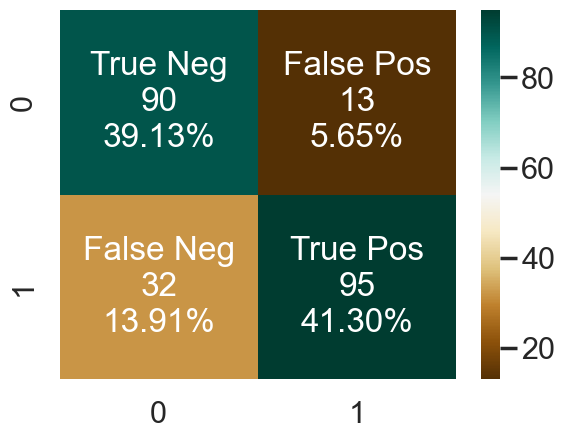

In [761]:
#not balanced but grid search tree applied
model_evaluation(classifier_decisiontree)

              precision    recall  f1-score   support

           0       0.72      0.82      0.77       103
           1       0.83      0.75      0.79       127

    accuracy                           0.78       230
   macro avg       0.78      0.78      0.78       230
weighted avg       0.78      0.78      0.78       230



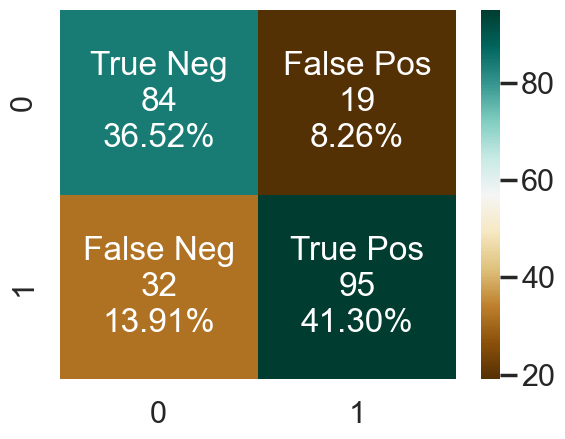

In [762]:
# not balanced and without grid searchtree 
model_evaluation(classifier1)

Accuracy :  81.30%
Cross Validation Score :  76.83%
ROC_AUC Score :  81.05%


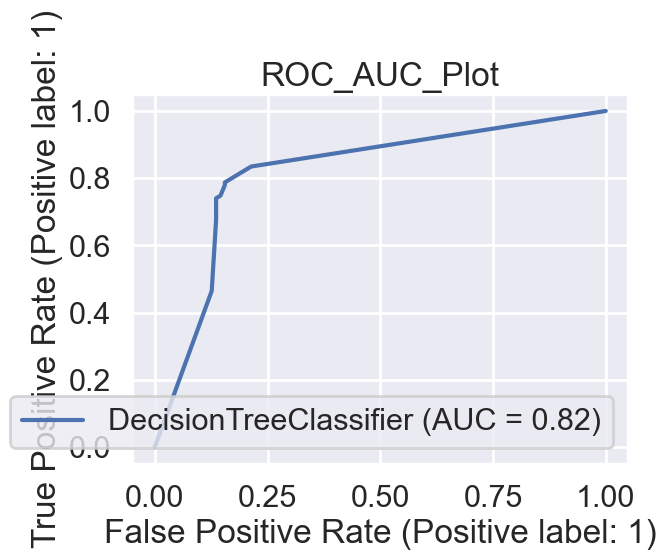

In [759]:
model(classifier_dt)

              precision    recall  f1-score   support

           0       0.79      0.79      0.79       103
           1       0.83      0.83      0.83       127

    accuracy                           0.81       230
   macro avg       0.81      0.81      0.81       230
weighted avg       0.81      0.81      0.81       230



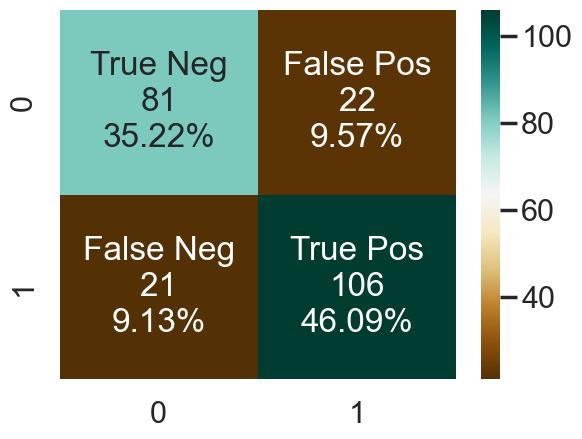

In [763]:
model_evaluation(classifier_dt)

In [780]:
classifier_svc = SVC(kernel = 'linear',C = 10)

In [781]:
classifier_svcbalanced = SVC(kernel = 'linear',C = 10,class_weight='balanced')

In [782]:
parameter2 ={'C':[1, 10, 100],'gamma':[0.001, 0.0001],'kernel': ['linear','rbf']}

In [792]:
classifier_supervector=GridSearchCV(classifier_svcbalanced,param_grid=parameter2,scoring='accuracy',cv=cv)

In [793]:
classifier_supervector.fit(XXtrain,YYtrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=SVC(C=10, class_weight='balanced', kernel='linear'),
             param_grid={'C': [1, 10, 100], 'gamma': [0.001, 0.0001],
                         'kernel': ['linear', 'rbf']},
             scoring='accuracy')

In [794]:
print(classifier_supervector.best_params_)

{'C': 100, 'gamma': 0.0001, 'kernel': 'rbf'}


In [795]:
##prediction
y_pred2=classifier_supervector.predict(XXtest)

In [796]:
print(classifier_supervector.best_score_)

0.8163682864450128


In [797]:
score=accuracy_score(y_pred2,YYtest)
error=1-accuracy_score(y_pred2,YYtest)
print(score)
print(error)

0.8130434782608695
0.18695652173913047


In [798]:
# imbalanced and via grid search
print(classification_report(y_pred2,YYtest))

              precision    recall  f1-score   support

           0       0.89      0.74      0.81       124
           1       0.75      0.90      0.82       106

    accuracy                           0.81       230
   macro avg       0.82      0.82      0.81       230
weighted avg       0.83      0.81      0.81       230



Accuracy :  81.74%
Cross Validation Score :  88.27%
ROC_AUC Score :  82.27%


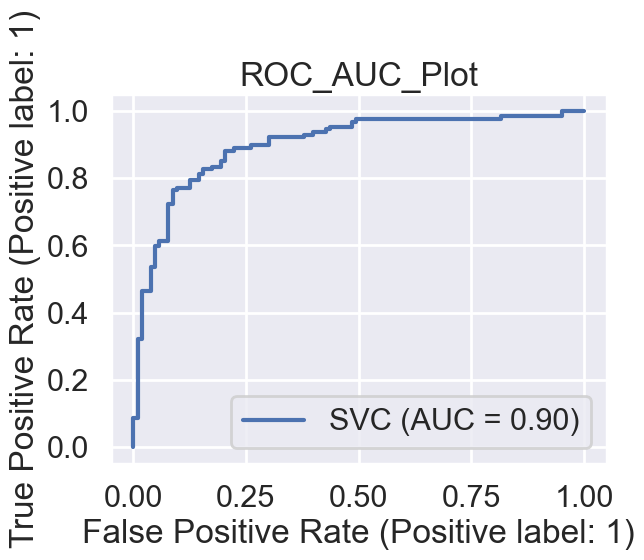

In [799]:
#balanced but no gridsearch hyperparameters applied
model(classifier_svcbalanced)

              precision    recall  f1-score   support

           0       0.76      0.87      0.81       103
           1       0.88      0.77      0.82       127

    accuracy                           0.82       230
   macro avg       0.82      0.82      0.82       230
weighted avg       0.83      0.82      0.82       230



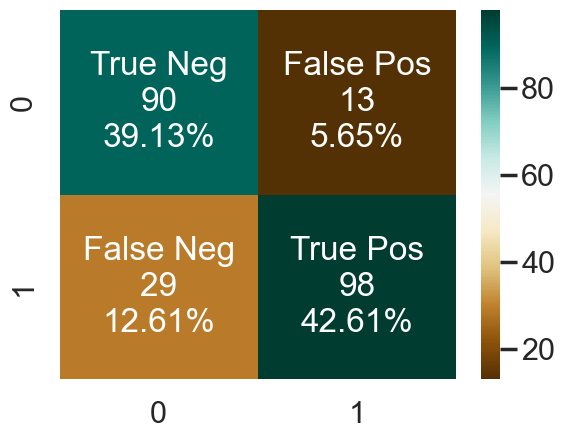

In [791]:
model_evaluation(classifier_svcbalanced)

Accuracy :  82.17%
Cross Validation Score :  87.82%
ROC_AUC Score :  82.48%


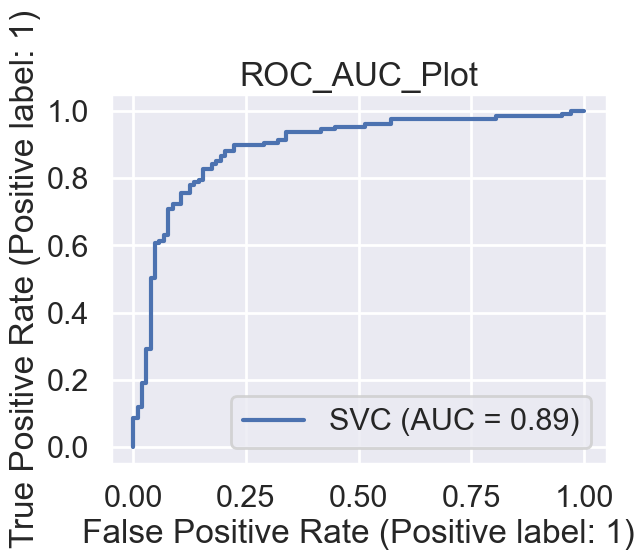

In [776]:
model(classifier_svc)

              precision    recall  f1-score   support

           0       0.77      0.85      0.81       103
           1       0.87      0.80      0.83       127

    accuracy                           0.82       230
   macro avg       0.82      0.82      0.82       230
weighted avg       0.83      0.82      0.82       230



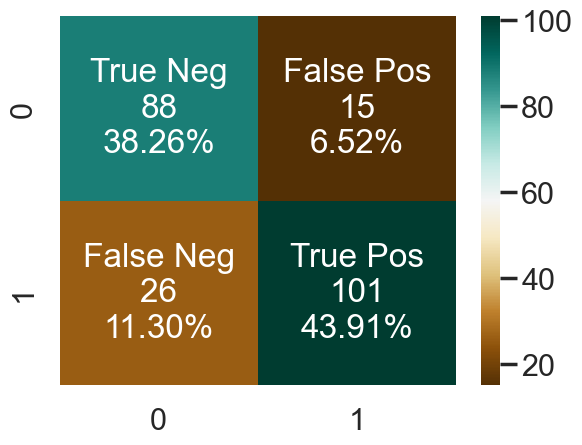

In [777]:
model_evaluation(classifier_svc)

              precision    recall  f1-score   support

           0       0.76      0.86      0.81       103
           1       0.88      0.78      0.82       127

    accuracy                           0.82       230
   macro avg       0.82      0.82      0.82       230
weighted avg       0.82      0.82      0.82       230



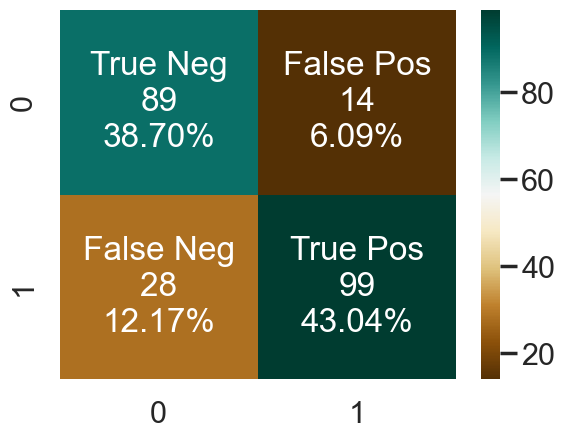

In [778]:
model_evaluation(classifier_supervector)

In [779]:
classifier_rf = RandomForestClassifier(max_depth = 4,random_state = 0)

In [672]:
classifier_rfbalanced = RandomForestClassifier(max_depth = 4,random_state = 0,class_weight='balanced')

In [673]:
n_estimators=[100]
max_features=['auto','sqrt']
max_depth=[2,4]
min_samples_leaf=[1,2]
bootstrap=[True,False]
min_samples_split=[2,5]

In [674]:
param_grid={'max_features':max_features,'max_depth':max_depth,'min_samples_leaf':min_samples_leaf,'bootstrap':bootstrap,'min_samples_split':min_samples_split}

In [675]:
randomtree=RandomForestClassifier(max_depth=2,n_estimators=100)
randomtree.fit(XXtrain,YYtrain)

RandomForestClassifier(max_depth=2)

In [808]:
classifier_randomsearch=GridSearchCV(classifier_rfbalanced,param_grid,scoring='accuracy',cv=cv)

In [830]:
classifier_randomsearch.fit(XXtrain,YYtrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=RandomForestClassifier(class_weight='balanced',
                                              max_depth=4, random_state=0),
             param_grid={'bootstrap': [True, False], 'max_depth': [2, 4],
                         'max_features': ['auto', 'sqrt'],
                         'min_samples_leaf': [1, 2],
                         'min_samples_split': [2, 5]},
             scoring='accuracy')

In [831]:
print(classifier_randomsearch.best_params_)

{'bootstrap': False, 'max_depth': 4, 'max_features': 'auto', 'min_samples_leaf': 2, 'min_samples_split': 5}


In [832]:
##prediction
y_pred2=classifier_randomsearch.predict(XXtest)

In [833]:
print(classifier_randomsearch.best_score_)

0.842007672634271


In [834]:
score=accuracy_score(y_pred1,YYtest)
error=1-accuracy_score(y_pred1,YYtest)
print("accuracy is ",score)
print("error rate is",error)

accuracy is  0.8434782608695652
error rate is 0.15652173913043477


In [835]:
# imbalanced and via grid search
print(classification_report(y_pred2,YYtest))

              precision    recall  f1-score   support

           0       0.89      0.78      0.83       118
           1       0.80      0.90      0.85       112

    accuracy                           0.84       230
   macro avg       0.84      0.84      0.84       230
weighted avg       0.85      0.84      0.84       230



Accuracy :  83.04%
Cross Validation Score :  90.36%
ROC_AUC Score :  83.54%


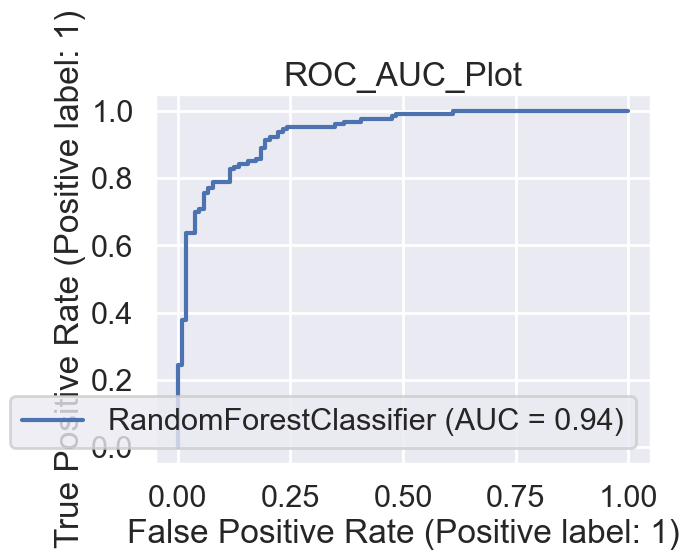

In [805]:
#balanced but no gridsearch hyperparameters applied
model(classifier_rfbalanced)

              precision    recall  f1-score   support

           0       0.77      0.88      0.82       103
           1       0.89      0.79      0.84       127

    accuracy                           0.83       230
   macro avg       0.83      0.84      0.83       230
weighted avg       0.84      0.83      0.83       230



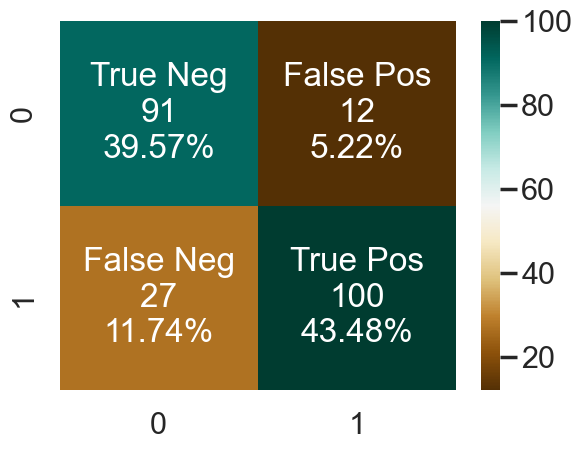

In [806]:
model_evaluation(classifier_rfbalanced)

In [ ]:
model_evaluation(classifier_randomsearch)

Accuracy :  84.35%
Cross Validation Score :  90.41%
ROC_AUC Score :  84.63%


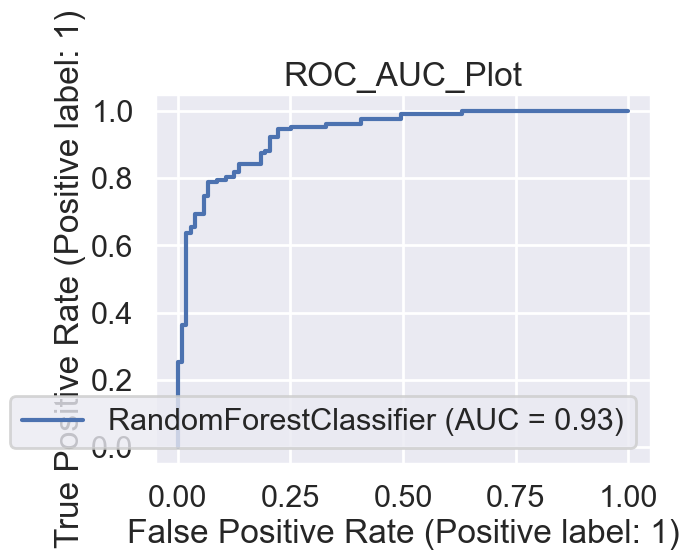

In [807]:
model(classifier_rf)

              precision    recall  f1-score   support

           0       0.80      0.86      0.83       103
           1       0.88      0.83      0.85       127

    accuracy                           0.84       230
   macro avg       0.84      0.85      0.84       230
weighted avg       0.85      0.84      0.84       230



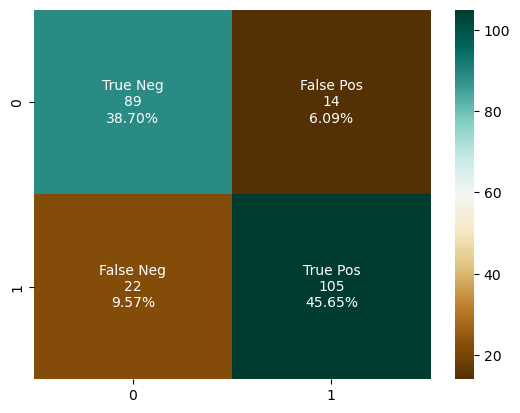

In [251]:
model_evaluation(classifier_rf)

[Text(0.5, 0.8333333333333334, 'X[1] <= 0.5\ngini = 0.498\nsamples = 437\nvalue = [322, 366]'),
 Text(0.25, 0.5, 'X[2] <= 0.5\ngini = 0.307\nsamples = 231\nvalue = [68, 291]'),
 Text(0.125, 0.16666666666666666, 'gini = 0.479\nsamples = 88\nvalue = [51, 77]'),
 Text(0.375, 0.16666666666666666, 'gini = 0.136\nsamples = 143\nvalue = [17, 214]'),
 Text(0.75, 0.5, 'X[6] <= 0.188\ngini = 0.352\nsamples = 206\nvalue = [254, 75]'),
 Text(0.625, 0.16666666666666666, 'gini = 0.193\nsamples = 124\nvalue = [181, 22]'),
 Text(0.875, 0.16666666666666666, 'gini = 0.487\nsamples = 82\nvalue = [73, 53]')]

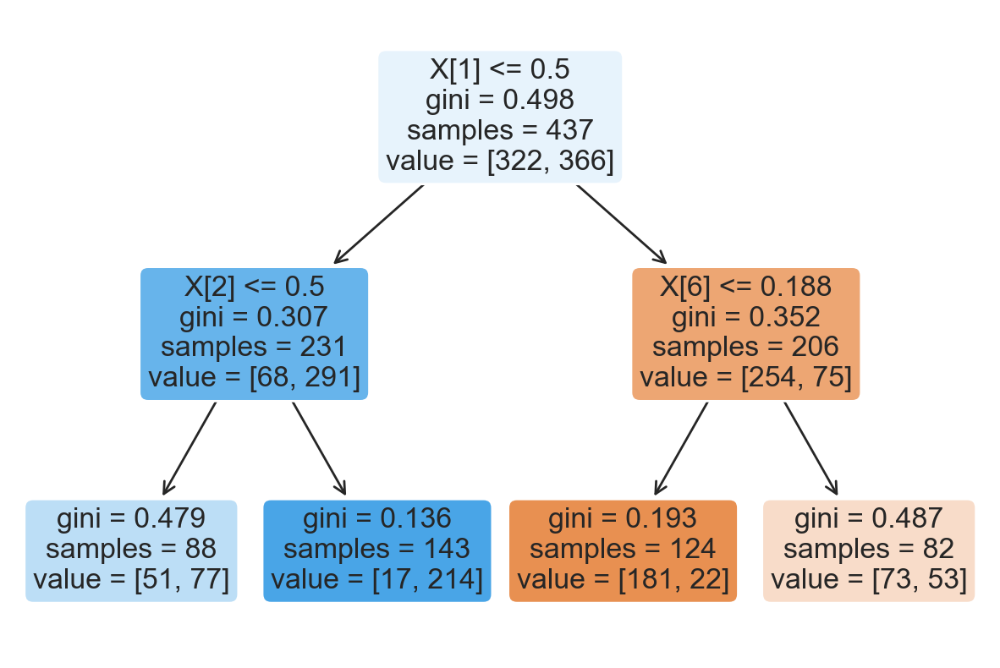

In [810]:
fig = plt.figure(figsize=(15, 10))
plot_tree(randomtree.estimators_[0], filled=True, impurity=True,rounded=True)

In [811]:
classifier_NB = GaussianNB()

Accuracy :  79.57%
Cross Validation Score :  88.47%
ROC_AUC Score :  80.03%


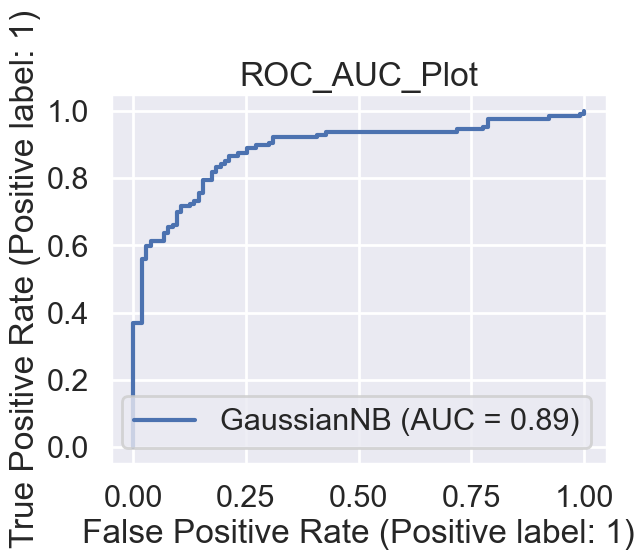

In [812]:
model(classifier_NB)

              precision    recall  f1-score   support

           0       0.74      0.82      0.77       103
           1       0.84      0.76      0.80       127

    accuracy                           0.79       230
   macro avg       0.79      0.79      0.79       230
weighted avg       0.79      0.79      0.79       230



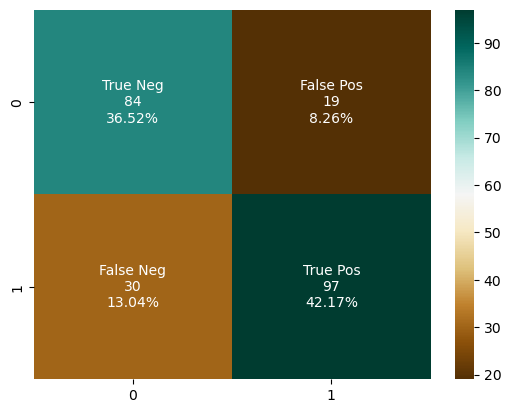

In [254]:
model_evaluation(classifier_NB)

In [813]:
gb = GradientBoostingClassifier(random_state = 1)
ab=AdaBoostClassifier()

In [814]:
from scipy.stats import uniform as sp_randFloat
from scipy.stats import randint as sp_randInt

In [819]:
parameters={'learning_rate': [0.1,0.9],
            'subsample':[0.1,0.9],
            'n_estimators':[1,100],
            'max_depth':[3,10],
            'min_samples_split':[50,140],
            'min_samples_leaf':[50,140]
           }

In [820]:
classifier_Gb=GridSearchCV(gb,param_grid=parameters,scoring='accuracy',cv=cv)

In [821]:
classifier_Gb.fit(XXtrain,YYtrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=GradientBoostingClassifier(random_state=1),
             param_grid={'learning_rate': [0.1, 0.9], 'max_depth': [3, 10],
                         'min_samples_leaf': [50, 140],
                         'min_samples_split': [50, 140],
                         'n_estimators': [1, 100], 'subsample': [0.1, 0.9]},
             scoring='accuracy')

In [822]:
print(classifier_Gb.best_params_)

{'learning_rate': 0.1, 'max_depth': 3, 'min_samples_leaf': 50, 'min_samples_split': 140, 'n_estimators': 100, 'subsample': 0.9}


In [823]:
print(classifier_Gb.best_score_)

0.8371838590508667


In [824]:
##prediction
y_pred1=classifier_Gb.predict(XXtest)

In [825]:
score=accuracy_score(y_pred1,YYtest)
error=1-accuracy_score(y_pred1,YYtest)
print("accuracy is ",score)
print("error rate is",error)

accuracy is  0.8434782608695652
error rate is 0.15652173913043477


In [826]:
# imbalanced and via grid search
print(classification_report(y_pred1,YYtest))

              precision    recall  f1-score   support

           0       0.85      0.81      0.83       109
           1       0.83      0.88      0.85       121

    accuracy                           0.84       230
   macro avg       0.84      0.84      0.84       230
weighted avg       0.84      0.84      0.84       230



              precision    recall  f1-score   support

           0       0.81      0.85      0.83       103
           1       0.88      0.83      0.85       127

    accuracy                           0.84       230
   macro avg       0.84      0.84      0.84       230
weighted avg       0.85      0.84      0.84       230



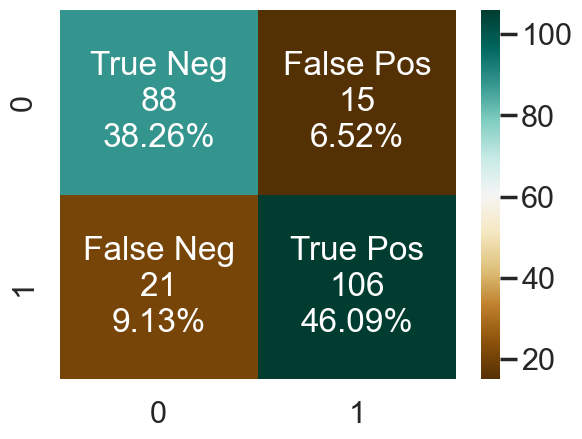

In [827]:
model_evaluation(classifier_Gb)

Accuracy :  86.52%
Cross Validation Score :  89.69%
ROC_AUC Score :  86.69%


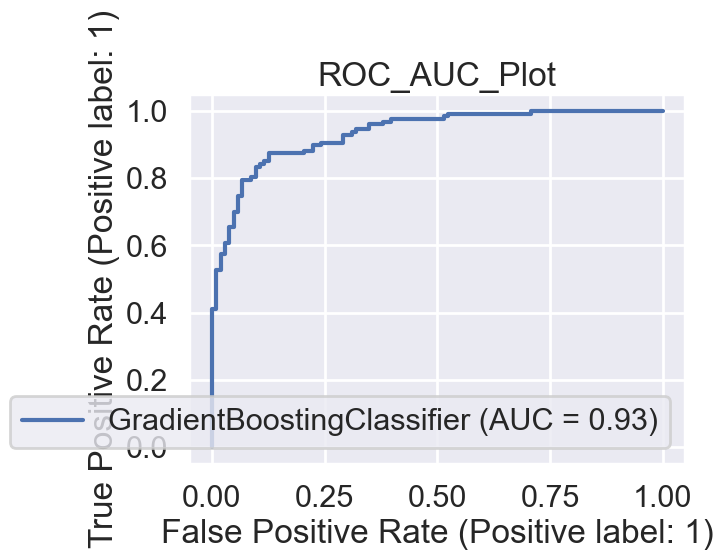

In [828]:
model(gb)

              precision    recall  f1-score   support

           0       0.83      0.88      0.85       103
           1       0.90      0.85      0.87       127

    accuracy                           0.87       230
   macro avg       0.86      0.87      0.86       230
weighted avg       0.87      0.87      0.87       230



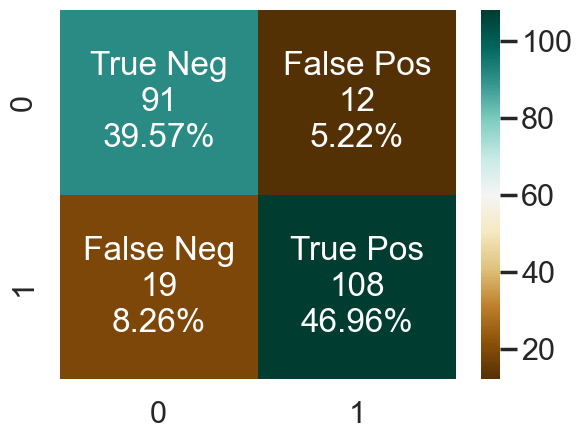

In [829]:
model_evaluation(gb)